<a href="https://colab.research.google.com/github/Alriyan1/number-plate-recognition/blob/main/number_plate_detection_p2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Fri Oct 11 05:47:55 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 23.2 MB/s eta 0:00:00


In [3]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.3/281.3 kB 22.3 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO
import cv2
import easyocr
import matplotlib.pyplot as plt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
model = YOLO("/content/plate_detection_model.pt")

In [6]:
reader = easyocr.Reader(['en'])

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [7]:
def ocr_img(frame):
  gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
  result = reader.readtext(gray)
  if len(result[0])==3 and result[0][-1]>0.5:
    print(result)



In [8]:
SOURCE_VIDEO="/content/car.mp4"

In [9]:
len(([[35, 7], [173, 7], [173, 45], [35, 45]], 'R-IB3-JF', 0.6266958377001908))

3

In [10]:
!pip install supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 kB 4.8 MB/s eta 0:00:00


In [11]:
import supervision as sv
from tqdm import tqdm

In [12]:
generator = sv.get_video_frames_generator(SOURCE_VIDEO)
frame = next(generator)
results = model(frame, conf=0.5)[0]
detections = sv.Detections.from_ultralytics(results)
detections = detections.with_nms(threshold=0.5, class_agnostic=True)
number_plate_crops = []

cropped_image = sv.crop_image(frame, detections.xyxy)
gray = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)
result = reader.readtext(gray)
if len(result[0])==3:
  print(result)


0: 416x640 1 0, 115.1ms
Speed: 19.5ms preprocess, 115.1ms inference, 907.4ms postprocess per image at shape (1, 3, 416, 640)
[([[34, 4], [173, 4], [173, 52], [34, 52]], 'RIBH', 0.1383061408996582)]


array([[[37, 29, 37],
        [37, 30, 36],
        [37, 30, 36],
        ...,
        [12, 10, 22],
        [16, 12, 22],
        [16, 12, 22]],

       [[19, 11, 19],
        [19, 12, 18],
        [19, 12, 18],
        ...,
        [12, 10, 22],
        [16, 12, 22],
        [16, 12, 22]],

       [[17,  9, 17],
        [17, 10, 16],
        [17, 10, 16],
        ...,
        [11, 11, 25],
        [17, 13, 23],
        [17, 13, 23]],

       ...,

       [[14, 11, 12],
        [17, 12, 13],
        [20, 15, 16],
        ...,
        [14, 16, 18],
        [14, 15, 20],
        [14, 15, 20]],

       [[17, 14, 15],
        [15, 12, 13],
        [17, 14, 15],
        ...,
        [16, 15, 17],
        [14, 15, 20],
        [14, 15, 20]],

       [[17, 14, 15],
        [17, 14, 15],
        [17, 14, 15],
        ...,
        [16, 15, 17],
        [14, 15, 20],
        [14, 15, 20]]], dtype=uint8)
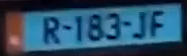

In [13]:
cropped_image

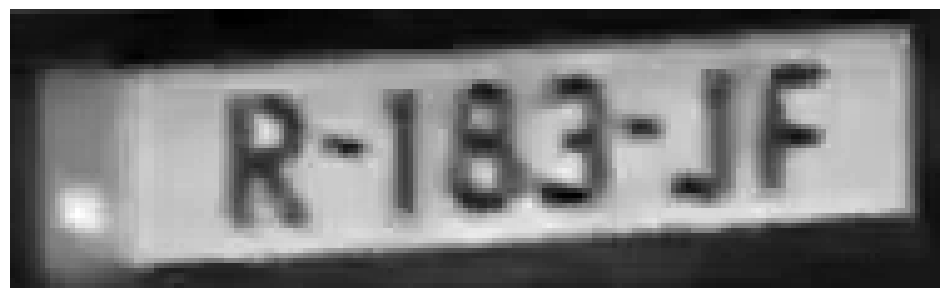

In [14]:
sv.plot_image(gray)

In [15]:
text = reader.readtext(gray)
print(text)

[([[34, 4], [173, 4], [173, 52], [34, 52]], 'RIBH', 0.1383061408996582)]


In [16]:
generator = sv.get_video_frames_generator(SOURCE_VIDEO)
crop_img=[]

for frame in tqdm(generator,desc='collecting crops'):
  results = model(frame)[0]
  detections = sv.Detections.from_ultralytics(results)
  detections = detections.with_nms(threshold=0.7, class_agnostic=True)
  number_plate_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
  crop_img.append(number_plate_crops)

collecting crops: 0it [00:00, ?it/s]


0: 416x640 1 0, 12.7ms
Speed: 5.7ms preprocess, 12.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 1it [00:00,  8.50it/s]


0: 416x640 1 0, 12.1ms
Speed: 3.3ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 4.8ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 4.7ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 4it [00:00, 19.09it/s]


0: 416x640 1 0, 11.2ms
Speed: 4.8ms preprocess, 11.2ms inference, 5.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 5.5ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 4.7ms preprocess, 13.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 7it [00:00, 22.14it/s]


0: 416x640 1 0, 11.6ms
Speed: 4.5ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 5.1ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 5.3ms preprocess, 10.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 10it [00:00, 23.83it/s]


0: 416x640 1 0, 11.5ms
Speed: 5.3ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 4.7ms preprocess, 11.3ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 5.0ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 13it [00:00, 25.28it/s]


0: 416x640 1 0, 12.7ms
Speed: 5.1ms preprocess, 12.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.9ms
Speed: 5.8ms preprocess, 13.9ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.2ms
Speed: 10.4ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 16it [00:00, 24.31it/s]


0: 416x640 1 0, 12.2ms
Speed: 5.2ms preprocess, 12.2ms inference, 8.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 4.8ms preprocess, 12.6ms inference, 8.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 6.5ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 19it [00:00, 21.65it/s]


0: 416x640 1 0, 12.9ms
Speed: 4.8ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.7ms
Speed: 6.4ms preprocess, 16.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.5ms
Speed: 6.3ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 22it [00:00, 23.75it/s]


0: 416x640 1 0, 11.1ms
Speed: 5.1ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 4.7ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 4.5ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 4.5ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 26it [00:01, 27.01it/s]


0: 416x640 1 0, 10.8ms
Speed: 4.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 5.1ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 4.4ms preprocess, 11.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 3.4ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 30it [00:01, 28.96it/s]


0: 416x640 1 0, 10.7ms
Speed: 3.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 4.5ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.1ms
Speed: 5.0ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.9ms
Speed: 6.2ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 34it [00:01, 30.15it/s]


0: 416x640 1 0, 10.9ms
Speed: 6.1ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 5.9ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 5.4ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 5.2ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 38it [00:01, 31.34it/s]


0: 416x640 1 0, 9.5ms
Speed: 5.7ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 4.9ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 3.8ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 4.1ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 42it [00:01, 32.44it/s]


0: 416x640 1 0, 8.8ms
Speed: 5.5ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.4ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 5.5ms preprocess, 9.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.9ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 46it [00:01, 33.23it/s]


0: 416x640 1 0, 9.1ms
Speed: 5.1ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 6.2ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.0ms
Speed: 6.9ms preprocess, 16.0ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 4.7ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 50it [00:01, 33.26it/s]


0: 416x640 1 0, 11.6ms
Speed: 7.1ms preprocess, 11.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 5.7ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 6.1ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.9ms
Speed: 4.5ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 54it [00:01, 31.43it/s]


0: 416x640 1 0, 11.3ms
Speed: 4.9ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 4.6ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 4.8ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 4.5ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 58it [00:02, 31.25it/s]


0: 416x640 1 0, 12.0ms
Speed: 4.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 4.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 4.3ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 4.6ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 62it [00:02, 30.98it/s]


0: 416x640 1 0, 12.6ms
Speed: 4.3ms preprocess, 12.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 4.4ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 4.6ms preprocess, 11.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 4.6ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 66it [00:02, 31.71it/s]


0: 416x640 1 0, 7.4ms
Speed: 5.0ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 4.8ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 4.6ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 4.8ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 4.4ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 71it [00:02, 35.12it/s]


0: 416x640 1 0, 8.4ms
Speed: 4.8ms preprocess, 8.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 5.1ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 4.9ms preprocess, 8.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 6.6ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 4.7ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 76it [00:02, 37.68it/s]


0: 416x640 1 0, 12.3ms
Speed: 4.2ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 4.8ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 7.5ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 5.1ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 80it [00:02, 34.88it/s]


0: 416x640 1 0, 12.3ms
Speed: 5.1ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 4.6ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 7.1ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 27.1ms
Speed: 6.3ms preprocess, 27.1ms inference, 4.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 84it [00:02, 32.53it/s]


0: 416x640 1 0, 37.7ms
Speed: 9.8ms preprocess, 37.7ms inference, 3.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.2ms
Speed: 7.7ms preprocess, 21.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.0ms
Speed: 8.0ms preprocess, 19.0ms inference, 5.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.9ms
Speed: 6.8ms preprocess, 19.9ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 88it [00:03, 26.51it/s]


0: 416x640 1 0, 9.7ms
Speed: 7.2ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 4.8ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.6ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 6.0ms preprocess, 10.7ms inference, 4.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 92it [00:03, 27.60it/s]


0: 416x640 1 0, 10.7ms
Speed: 6.3ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 6.2ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 6.4ms preprocess, 12.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 4.6ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 96it [00:03, 28.59it/s]


0: 416x640 1 0, 14.3ms
Speed: 7.4ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 4.9ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 5.7ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 6.2ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 100it [00:03, 30.00it/s]


0: 416x640 1 0, 10.0ms
Speed: 5.6ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 26.1ms
Speed: 6.8ms preprocess, 26.1ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.3ms
Speed: 6.5ms preprocess, 22.3ms inference, 4.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 44.7ms
Speed: 26.1ms preprocess, 44.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 104it [00:03, 24.47it/s]


0: 416x640 1 0, 10.7ms
Speed: 5.7ms preprocess, 10.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.9ms
Speed: 5.0ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 4.7ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.7ms
Speed: 4.1ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 108it [00:03, 26.31it/s]


0: 416x640 1 0, 15.6ms
Speed: 6.6ms preprocess, 15.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.9ms
Speed: 7.0ms preprocess, 15.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 10.5ms preprocess, 12.4ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 111it [00:03, 24.86it/s]


0: 416x640 1 0, 14.6ms
Speed: 5.1ms preprocess, 14.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.7ms
Speed: 5.0ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 6.7ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 114it [00:04, 24.88it/s]


0: 416x640 1 0, 10.6ms
Speed: 4.6ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 7.6ms preprocess, 11.6ms inference, 6.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 7.3ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 117it [00:04, 24.31it/s]


0: 416x640 1 0, 18.5ms
Speed: 7.9ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 4.7ms preprocess, 11.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 4.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 120it [00:04, 25.19it/s]


0: 416x640 1 0, 10.8ms
Speed: 4.9ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 4.9ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 5.1ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 4.8ms preprocess, 12.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 124it [00:04, 26.72it/s]


0: 416x640 1 0, 11.3ms
Speed: 4.9ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 4.8ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 5.1ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 127it [00:04, 26.38it/s]


0: 416x640 1 0, 14.3ms
Speed: 9.5ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 4.9ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 26.3ms
Speed: 8.6ms preprocess, 26.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 130it [00:04, 25.23it/s]


0: 416x640 1 0, 10.9ms
Speed: 5.0ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 5.1ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 4.8ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.6ms
Speed: 4.4ms preprocess, 15.6ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 134it [00:04, 26.29it/s]


0: 416x640 1 0, 15.2ms
Speed: 8.2ms preprocess, 15.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.1ms
Speed: 7.0ms preprocess, 18.1ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.3ms
Speed: 4.5ms preprocess, 19.3ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 137it [00:04, 23.31it/s]


0: 416x640 1 0, 25.7ms
Speed: 7.6ms preprocess, 25.7ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.2ms
Speed: 12.7ms preprocess, 14.2ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.8ms
Speed: 7.2ms preprocess, 19.8ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 140it [00:05, 20.99it/s]


0: 416x640 1 0, 25.7ms
Speed: 10.7ms preprocess, 25.7ms inference, 12.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.0ms
Speed: 10.5ms preprocess, 18.0ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 4.6ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 143it [00:05, 19.57it/s]


0: 416x640 1 0, 11.6ms
Speed: 6.5ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 5.4ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.1ms
Speed: 4.6ms preprocess, 20.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 146it [00:05, 20.61it/s]


0: 416x640 1 0, 19.5ms
Speed: 5.8ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 4.7ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 5.2ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 149it [00:05, 20.27it/s]


0: 416x640 1 0, 11.5ms
Speed: 4.9ms preprocess, 11.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 5.2ms preprocess, 10.9ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 5.3ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.2ms
Speed: 7.3ms preprocess, 21.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 153it [00:05, 22.67it/s]


0: 416x640 1 0, 12.8ms
Speed: 5.8ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 6.1ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 37.3ms
Speed: 22.8ms preprocess, 37.3ms inference, 4.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 156it [00:05, 21.01it/s]


0: 416x640 1 0, 13.9ms
Speed: 5.0ms preprocess, 13.9ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 4.8ms preprocess, 13.6ms inference, 9.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 4.9ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 159it [00:06, 20.25it/s]


0: 416x640 1 0, 17.5ms
Speed: 8.2ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 6.3ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.5ms
Speed: 4.6ms preprocess, 18.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 162it [00:06, 20.28it/s]


0: 416x640 1 0, 33.0ms
Speed: 4.8ms preprocess, 33.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 38.6ms
Speed: 8.9ms preprocess, 38.6ms inference, 15.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 27.0ms
Speed: 11.6ms preprocess, 27.0ms inference, 11.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 165it [00:06, 16.88it/s]


0: 416x640 1 0, 19.5ms
Speed: 8.2ms preprocess, 19.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 24.8ms
Speed: 10.5ms preprocess, 24.8ms inference, 21.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 167it [00:06, 15.46it/s]


0: 416x640 1 0, 42.0ms
Speed: 21.5ms preprocess, 42.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 61.1ms
Speed: 24.0ms preprocess, 61.1ms inference, 5.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 169it [00:06, 13.17it/s]


0: 416x640 1 0, 19.2ms
Speed: 7.8ms preprocess, 19.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 24.7ms
Speed: 5.0ms preprocess, 24.7ms inference, 6.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 171it [00:06, 14.01it/s]


0: 416x640 1 0, 32.0ms
Speed: 14.9ms preprocess, 32.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 24.2ms
Speed: 4.8ms preprocess, 24.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 173it [00:07, 13.61it/s]


0: 416x640 1 0, 21.0ms
Speed: 7.2ms preprocess, 21.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 39.6ms
Speed: 6.1ms preprocess, 39.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 175it [00:07, 14.51it/s]


0: 416x640 1 0, 27.6ms
Speed: 11.4ms preprocess, 27.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 26.7ms
Speed: 9.7ms preprocess, 26.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 177it [00:07, 14.34it/s]


0: 416x640 1 0, 16.9ms
Speed: 8.5ms preprocess, 16.9ms inference, 9.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.1ms
Speed: 11.2ms preprocess, 21.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 179it [00:07, 14.78it/s]


0: 416x640 1 0, 17.0ms
Speed: 12.0ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.8ms
Speed: 15.8ms preprocess, 22.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 181it [00:07, 15.10it/s]


0: 416x640 1 0, 14.9ms
Speed: 6.4ms preprocess, 14.9ms inference, 11.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.5ms
Speed: 8.4ms preprocess, 15.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 183it [00:07, 14.34it/s]


0: 416x640 1 0, 26.5ms
Speed: 5.5ms preprocess, 26.5ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 36.1ms
Speed: 14.9ms preprocess, 36.1ms inference, 4.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 185it [00:07, 14.00it/s]


0: 416x640 1 0, 49.3ms
Speed: 17.3ms preprocess, 49.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 32.4ms
Speed: 12.6ms preprocess, 32.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 187it [00:08, 12.33it/s]


0: 416x640 1 0, 19.5ms
Speed: 16.7ms preprocess, 19.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.0ms
Speed: 38.4ms preprocess, 19.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 189it [00:08, 11.85it/s]


0: 416x640 1 0, 42.4ms
Speed: 14.0ms preprocess, 42.4ms inference, 6.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.4ms
Speed: 6.2ms preprocess, 22.4ms inference, 3.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 191it [00:08, 12.20it/s]


0: 416x640 1 0, 44.3ms
Speed: 23.0ms preprocess, 44.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 4.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 193it [00:08, 13.12it/s]


0: 416x640 1 0, 17.6ms
Speed: 7.9ms preprocess, 17.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.3ms
Speed: 10.8ms preprocess, 17.3ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.9ms
Speed: 8.1ms preprocess, 19.9ms inference, 6.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 196it [00:08, 15.47it/s]


0: 416x640 1 0, 26.4ms
Speed: 8.2ms preprocess, 26.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.0ms
Speed: 8.4ms preprocess, 19.0ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 198it [00:08, 16.36it/s]


0: 416x640 1 0, 19.5ms
Speed: 5.2ms preprocess, 19.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 4.8ms preprocess, 11.4ms inference, 4.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.6ms
Speed: 4.9ms preprocess, 16.6ms inference, 4.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 201it [00:08, 18.95it/s]


0: 416x640 1 0, 12.7ms
Speed: 4.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 59.6ms
Speed: 7.1ms preprocess, 59.6ms inference, 9.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 203it [00:09, 17.70it/s]


0: 416x640 1 0, 14.3ms
Speed: 5.0ms preprocess, 14.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 30.2ms
Speed: 5.6ms preprocess, 30.2ms inference, 7.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 49.2ms
Speed: 13.8ms preprocess, 49.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 206it [00:09, 17.56it/s]


0: 416x640 1 0, 12.8ms
Speed: 4.6ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 25.1ms
Speed: 5.1ms preprocess, 25.1ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 18.3ms
Speed: 12.0ms preprocess, 18.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 209it [00:09, 18.66it/s]


0: 416x640 1 0, 37.4ms
Speed: 7.4ms preprocess, 37.4ms inference, 7.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.4ms
Speed: 20.4ms preprocess, 22.4ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 211it [00:09, 17.27it/s]


0: 416x640 2 0s, 23.7ms
Speed: 9.5ms preprocess, 23.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.2ms
Speed: 5.5ms preprocess, 22.2ms inference, 8.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 213it [00:09, 17.44it/s]


0: 416x640 1 0, 19.9ms
Speed: 10.7ms preprocess, 19.9ms inference, 4.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 32.5ms
Speed: 9.3ms preprocess, 32.5ms inference, 16.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 215it [00:09, 16.40it/s]


0: 416x640 1 0, 57.5ms
Speed: 21.5ms preprocess, 57.5ms inference, 21.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 25.3ms
Speed: 13.8ms preprocess, 25.3ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 217it [00:10, 13.38it/s]


0: 416x640 1 0, 29.2ms
Speed: 9.5ms preprocess, 29.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.1ms
Speed: 10.6ms preprocess, 20.1ms inference, 4.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 219it [00:10, 14.04it/s]


0: 416x640 1 0, 20.2ms
Speed: 7.9ms preprocess, 20.2ms inference, 4.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 32.6ms
Speed: 12.9ms preprocess, 32.6ms inference, 6.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 221it [00:10, 14.26it/s]


0: 416x640 1 0, 23.0ms
Speed: 31.5ms preprocess, 23.0ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.6ms
Speed: 8.8ms preprocess, 19.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 223it [00:10, 14.53it/s]


0: 416x640 1 0, 20.7ms
Speed: 7.2ms preprocess, 20.7ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 23.4ms
Speed: 8.6ms preprocess, 23.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 225it [00:10, 15.58it/s]


0: 416x640 1 0, 23.0ms
Speed: 6.9ms preprocess, 23.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 51.4ms
Speed: 12.2ms preprocess, 51.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 227it [00:10, 15.34it/s]


0: 416x640 1 0, 22.5ms
Speed: 8.9ms preprocess, 22.5ms inference, 8.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 36.1ms
Speed: 8.4ms preprocess, 36.1ms inference, 5.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 229it [00:10, 15.11it/s]


0: 416x640 1 0, 68.0ms
Speed: 21.6ms preprocess, 68.0ms inference, 12.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 45.2ms
Speed: 23.7ms preprocess, 45.2ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 231it [00:11, 11.08it/s]


0: 416x640 1 0, 57.9ms
Speed: 30.2ms preprocess, 57.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 26.2ms
Speed: 8.9ms preprocess, 26.2ms inference, 7.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 233it [00:11, 10.55it/s]


0: 416x640 1 0, 31.8ms
Speed: 13.9ms preprocess, 31.8ms inference, 4.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 41.2ms
Speed: 4.9ms preprocess, 41.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 235it [00:11, 11.27it/s]


0: 416x640 1 0, 11.8ms
Speed: 6.8ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 5.0ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 6.2ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 238it [00:11, 14.43it/s]


0: 416x640 1 0, 19.9ms
Speed: 6.7ms preprocess, 19.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 4.6ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 6.3ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 241it [00:11, 17.10it/s]


0: 416x640 1 0, 13.3ms
Speed: 6.0ms preprocess, 13.3ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 5.0ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 45.4ms
Speed: 6.5ms preprocess, 45.4ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 244it [00:11, 17.57it/s]


0: 416x640 1 0, 20.9ms
Speed: 10.2ms preprocess, 20.9ms inference, 3.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.3ms
Speed: 9.8ms preprocess, 21.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 246it [00:11, 17.49it/s]


0: 416x640 1 0, 18.7ms
Speed: 5.7ms preprocess, 18.7ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.2ms
Speed: 6.9ms preprocess, 21.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 248it [00:12, 16.83it/s]


0: 416x640 1 0, 11.5ms
Speed: 4.7ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 10.9ms preprocess, 12.3ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.7ms
Speed: 16.3ms preprocess, 21.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 251it [00:12, 17.59it/s]


0: 416x640 1 0, 23.2ms
Speed: 7.3ms preprocess, 23.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 6.3ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 6.1ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 254it [00:12, 19.26it/s]


0: 416x640 1 0, 20.8ms
Speed: 6.0ms preprocess, 20.8ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 6.3ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 256it [00:12, 18.99it/s]


0: 416x640 1 0, 15.8ms
Speed: 10.4ms preprocess, 15.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.0ms
Speed: 6.9ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.3ms
Speed: 12.5ms preprocess, 19.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 259it [00:12, 19.33it/s]


0: 416x640 1 0, 11.7ms
Speed: 6.6ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 6.6ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 4.8ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 262it [00:12, 20.22it/s]


0: 416x640 1 0, 23.4ms
Speed: 7.2ms preprocess, 23.4ms inference, 11.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 9.3ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.9ms
Speed: 6.4ms preprocess, 18.9ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 265it [00:12, 19.66it/s]


0: 416x640 1 0, 11.8ms
Speed: 11.4ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.8ms
Speed: 4.8ms preprocess, 17.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 5.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 268it [00:13, 20.81it/s]


0: 416x640 1 0, 12.5ms
Speed: 4.3ms preprocess, 12.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 7.1ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 25.7ms
Speed: 14.4ms preprocess, 25.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 271it [00:13, 20.64it/s]


0: 416x640 1 0, 39.4ms
Speed: 10.2ms preprocess, 39.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 6.2ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.7ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 274it [00:13, 20.76it/s]


0: 416x640 1 0, 10.3ms
Speed: 4.9ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.0ms
Speed: 5.2ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 7.0ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 277it [00:13, 21.49it/s]


0: 416x640 1 0, 13.0ms
Speed: 5.5ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 10.9ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 5.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 280it [00:13, 21.79it/s]


0: 416x640 1 0, 23.1ms
Speed: 4.7ms preprocess, 23.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 30.4ms
Speed: 15.8ms preprocess, 30.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 6.3ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 283it [00:13, 19.84it/s]


0: 416x640 1 0, 34.8ms
Speed: 30.0ms preprocess, 34.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 55.4ms
Speed: 8.0ms preprocess, 55.4ms inference, 9.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.1ms
Speed: 4.4ms preprocess, 15.1ms inference, 4.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 286it [00:14, 15.78it/s]


0: 416x640 1 0, 25.9ms
Speed: 7.7ms preprocess, 25.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 4.3ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 288it [00:14, 16.36it/s]


0: 416x640 1 0, 14.1ms
Speed: 11.3ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 6.9ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 30.9ms
Speed: 22.2ms preprocess, 30.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 291it [00:14, 16.64it/s]


0: 416x640 2 0s, 9.5ms
Speed: 5.5ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 5.9ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 33.6ms
Speed: 5.1ms preprocess, 33.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 294it [00:14, 17.18it/s]


0: 416x640 1 0, 12.1ms
Speed: 6.9ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 7.5ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 7.2ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 297it [00:14, 18.96it/s]


0: 416x640 1 0, 11.3ms
Speed: 6.1ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 5.0ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 3.8ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 300it [00:14, 20.32it/s]


0: 416x640 1 0, 14.0ms
Speed: 4.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.7ms
Speed: 12.0ms preprocess, 19.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.6ms
Speed: 7.5ms preprocess, 17.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 303it [00:14, 19.10it/s]


0: 416x640 1 0, 24.0ms
Speed: 7.9ms preprocess, 24.0ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.4ms
Speed: 6.8ms preprocess, 15.4ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 305it [00:15, 17.93it/s]


0: 416x640 1 0, 11.8ms
Speed: 6.0ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 8.6ms preprocess, 10.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 4.6ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 308it [00:15, 18.83it/s]


0: 416x640 1 0, 12.7ms
Speed: 8.1ms preprocess, 12.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 4.5ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 4.9ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 311it [00:15, 20.34it/s]


0: 416x640 1 0, 10.5ms
Speed: 6.6ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 7.3ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 35.5ms
Speed: 7.1ms preprocess, 35.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 314it [00:15, 20.82it/s]


0: 416x640 1 0, 24.0ms
Speed: 7.0ms preprocess, 24.0ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 8.7ms preprocess, 13.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.3ms
Speed: 9.4ms preprocess, 15.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 317it [00:15, 20.18it/s]


0: 416x640 1 0, 11.3ms
Speed: 4.9ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.2ms
Speed: 5.0ms preprocess, 15.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.0ms
Speed: 6.9ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 320it [00:15, 21.53it/s]


0: 416x640 1 0, 14.0ms
Speed: 8.0ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.8ms
Speed: 4.8ms preprocess, 13.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.2ms
Speed: 6.7ms preprocess, 20.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 323it [00:15, 21.94it/s]


0: 416x640 1 0, 11.1ms
Speed: 5.2ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 4.9ms preprocess, 13.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 9.8ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 326it [00:16, 21.07it/s]


0: 416x640 1 0, 14.8ms
Speed: 4.9ms preprocess, 14.8ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 5.1ms preprocess, 12.8ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 4.5ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 329it [00:16, 22.61it/s]


0: 416x640 1 0, 12.5ms
Speed: 6.3ms preprocess, 12.5ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 5.0ms preprocess, 13.1ms inference, 8.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.7ms
Speed: 8.8ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 332it [00:16, 22.96it/s]


0: 416x640 1 0, 23.0ms
Speed: 12.0ms preprocess, 23.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 51.1ms
Speed: 11.3ms preprocess, 51.1ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 7.0ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 335it [00:16, 19.79it/s]


0: 416x640 1 0, 12.0ms
Speed: 5.1ms preprocess, 12.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.7ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.8ms
Speed: 8.8ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 338it [00:16, 20.85it/s]


0: 416x640 1 0, 11.3ms
Speed: 8.8ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 5.7ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 5.2ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 341it [00:16, 21.86it/s]


0: 416x640 1 0, 12.6ms
Speed: 5.0ms preprocess, 12.6ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 21.4ms
Speed: 8.3ms preprocess, 21.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 23.2ms
Speed: 12.0ms preprocess, 23.2ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 344it [00:16, 20.35it/s]


0: 416x640 1 0, 26.2ms
Speed: 15.5ms preprocess, 26.2ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 19.6ms
Speed: 4.7ms preprocess, 19.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.2ms
Speed: 5.5ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 347it [00:17, 18.67it/s]


0: 416x640 2 0s, 12.0ms
Speed: 4.8ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 15.7ms
Speed: 4.6ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 10.6ms
Speed: 5.2ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 350it [00:17, 20.11it/s]


0: 416x640 2 0s, 11.5ms
Speed: 4.9ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 7.7ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 7.1ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 10.7ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 354it [00:17, 22.47it/s]


0: 416x640 1 0, 11.1ms
Speed: 9.3ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 11.1ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 9.0ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 357it [00:17, 23.53it/s]


0: 416x640 1 0, 10.6ms
Speed: 6.9ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 7.2ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 10.0ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 360it [00:17, 24.23it/s]


0: 416x640 1 0, 27.3ms
Speed: 9.2ms preprocess, 27.3ms inference, 7.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 4.6ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 8.3ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 363it [00:17, 24.36it/s]


0: 416x640 1 0, 12.0ms
Speed: 3.9ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.7ms
Speed: 7.5ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 5.2ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 366it [00:17, 24.95it/s]


0: 416x640 1 0, 9.5ms
Speed: 4.8ms preprocess, 9.5ms inference, 4.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.0ms
Speed: 6.2ms preprocess, 18.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.8ms
Speed: 5.3ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 369it [00:17, 26.21it/s]


0: 416x640 1 0, 14.9ms
Speed: 5.0ms preprocess, 14.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 5.3ms preprocess, 12.7ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 5.5ms preprocess, 11.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 372it [00:18, 26.74it/s]


0: 416x640 1 0, 13.6ms
Speed: 4.8ms preprocess, 13.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.7ms
Speed: 5.6ms preprocess, 13.7ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 5.7ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.0ms
Speed: 4.6ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 376it [00:18, 28.17it/s]


0: 416x640 1 0, 11.2ms
Speed: 5.0ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 4.9ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 13.2ms
Speed: 5.3ms preprocess, 13.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 379it [00:18, 28.21it/s]


0: 416x640 2 0s, 12.6ms
Speed: 5.3ms preprocess, 12.6ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 14.3ms
Speed: 5.7ms preprocess, 14.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 5.3ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 382it [00:18, 27.70it/s]


0: 416x640 1 0, 12.5ms
Speed: 6.3ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 6.5ms preprocess, 12.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 32.0ms
Speed: 17.5ms preprocess, 32.0ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 385it [00:18, 23.18it/s]


0: 416x640 1 0, 10.9ms
Speed: 10.3ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 6.5ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.1ms
Speed: 4.7ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 388it [00:18, 23.37it/s]


0: 416x640 1 0, 15.6ms
Speed: 7.2ms preprocess, 15.6ms inference, 5.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.2ms
Speed: 4.7ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 5.0ms preprocess, 13.1ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 391it [00:18, 23.61it/s]


0: 416x640 1 0, 13.2ms
Speed: 5.5ms preprocess, 13.2ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.8ms
Speed: 4.8ms preprocess, 15.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 24.9ms
Speed: 5.6ms preprocess, 24.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 394it [00:18, 23.48it/s]


0: 416x640 1 0, 16.0ms
Speed: 6.4ms preprocess, 16.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 5.9ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.5ms
Speed: 21.3ms preprocess, 17.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 397it [00:19, 22.32it/s]


0: 416x640 1 0, 12.3ms
Speed: 4.7ms preprocess, 12.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 25.9ms
Speed: 4.4ms preprocess, 25.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 4.7ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 400it [00:19, 21.48it/s]


0: 416x640 1 0, 10.8ms
Speed: 8.4ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 4.8ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 7.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 403it [00:19, 21.60it/s]


0: 416x640 1 0, 12.0ms
Speed: 6.9ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 17.7ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 5.4ms preprocess, 13.3ms inference, 5.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 406it [00:19, 21.70it/s]


0: 416x640 1 0, 10.6ms
Speed: 6.8ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 27.0ms
Speed: 7.6ms preprocess, 27.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 7.7ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 409it [00:19, 21.32it/s]


0: 416x640 1 0, 12.9ms
Speed: 7.4ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 31.8ms
Speed: 4.9ms preprocess, 31.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.2ms
Speed: 9.0ms preprocess, 20.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 412it [00:19, 18.91it/s]


0: 416x640 1 0, 38.9ms
Speed: 20.4ms preprocess, 38.9ms inference, 6.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 26.4ms
Speed: 25.4ms preprocess, 26.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 414it [00:20, 15.97it/s]


0: 416x640 1 0, 27.1ms
Speed: 6.1ms preprocess, 27.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 43.7ms
Speed: 15.4ms preprocess, 43.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 416it [00:20, 14.09it/s]


0: 416x640 1 0, 23.8ms
Speed: 11.5ms preprocess, 23.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.2ms
Speed: 5.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 4.6ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 419it [00:20, 15.86it/s]


0: 416x640 2 0s, 9.3ms
Speed: 5.1ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.5ms
Speed: 8.1ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 7.2ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 422it [00:20, 17.87it/s]


0: 416x640 1 0, 10.7ms
Speed: 6.6ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 22.5ms
Speed: 5.5ms preprocess, 22.5ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 12.3ms
Speed: 8.4ms preprocess, 12.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 425it [00:20, 18.74it/s]


0: 416x640 1 0, 12.1ms
Speed: 8.0ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 12.4ms
Speed: 5.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 427it [00:20, 18.78it/s]


0: 416x640 1 0, 16.3ms
Speed: 5.3ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 27.4ms
Speed: 5.1ms preprocess, 27.4ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 23.0ms
Speed: 4.8ms preprocess, 23.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 430it [00:20, 19.87it/s]


0: 416x640 1 0, 12.7ms
Speed: 5.1ms preprocess, 12.7ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 5.4ms preprocess, 12.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.7ms
Speed: 6.2ms preprocess, 15.7ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 433it [00:21, 21.38it/s]


0: 416x640 1 0, 9.7ms
Speed: 4.6ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.8ms
Speed: 4.7ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.6ms
Speed: 5.1ms preprocess, 13.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.2ms
Speed: 4.8ms preprocess, 12.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 437it [00:21, 24.58it/s]


0: 416x640 (no detections), 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.3ms
Speed: 4.9ms preprocess, 12.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.2ms
Speed: 5.1ms preprocess, 13.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 441it [00:21, 27.39it/s]


0: 416x640 (no detections), 11.9ms
Speed: 3.8ms preprocess, 11.9ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.1ms
Speed: 4.8ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.0ms
Speed: 2.4ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 445it [00:21, 29.42it/s]


0: 416x640 (no detections), 14.4ms
Speed: 4.4ms preprocess, 14.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.9ms
Speed: 3.5ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 448it [00:21, 28.93it/s]


0: 416x640 (no detections), 28.9ms
Speed: 3.0ms preprocess, 28.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 22.9ms
Speed: 3.2ms preprocess, 22.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 27.6ms
Speed: 7.2ms preprocess, 27.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 451it [00:21, 24.58it/s]


0: 416x640 (no detections), 24.6ms
Speed: 7.6ms preprocess, 24.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 27.4ms
Speed: 8.7ms preprocess, 27.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 34.1ms
Speed: 3.1ms preprocess, 34.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 454it [00:21, 21.52it/s]


0: 416x640 (no detections), 17.7ms
Speed: 3.4ms preprocess, 17.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 22.4ms
Speed: 8.4ms preprocess, 22.4ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.3ms
Speed: 6.6ms preprocess, 16.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 457it [00:21, 21.10it/s]


0: 416x640 (no detections), 26.0ms
Speed: 9.8ms preprocess, 26.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 18.5ms
Speed: 4.2ms preprocess, 18.5ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 27.1ms
Speed: 6.5ms preprocess, 27.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 460it [00:22, 20.60it/s]


0: 416x640 (no detections), 33.0ms
Speed: 4.7ms preprocess, 33.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 32.2ms
Speed: 7.6ms preprocess, 32.2ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 17.9ms
Speed: 16.9ms preprocess, 17.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 463it [00:22, 19.10it/s]


0: 416x640 (no detections), 15.1ms
Speed: 7.3ms preprocess, 15.1ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.2ms
Speed: 4.0ms preprocess, 12.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.6ms
Speed: 3.2ms preprocess, 10.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 467it [00:22, 22.74it/s]


0: 416x640 (no detections), 11.4ms
Speed: 9.9ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 21.1ms
Speed: 6.0ms preprocess, 21.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 470it [00:22, 22.87it/s]


0: 416x640 (no detections), 23.3ms
Speed: 3.1ms preprocess, 23.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 21.7ms
Speed: 5.6ms preprocess, 21.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.2ms
Speed: 4.2ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 473it [00:22, 22.22it/s]


0: 416x640 1 0, 21.0ms
Speed: 3.7ms preprocess, 21.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 53.9ms
Speed: 3.3ms preprocess, 53.9ms inference, 35.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 33.9ms
Speed: 3.7ms preprocess, 33.9ms inference, 6.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 476it [00:22, 17.44it/s]


0: 416x640 1 0, 43.9ms
Speed: 5.0ms preprocess, 43.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 53.9ms
Speed: 8.7ms preprocess, 53.9ms inference, 6.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 478it [00:23, 15.57it/s]


0: 416x640 1 0, 36.1ms
Speed: 7.8ms preprocess, 36.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 10.1ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.5ms
Speed: 9.2ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 481it [00:23, 17.22it/s]


0: 416x640 1 0, 22.9ms
Speed: 8.7ms preprocess, 22.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 29.2ms
Speed: 10.9ms preprocess, 29.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 483it [00:23, 17.25it/s]


0: 416x640 1 0, 41.7ms
Speed: 26.2ms preprocess, 41.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.1ms
Speed: 9.5ms preprocess, 16.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 485it [00:23, 16.06it/s]


0: 416x640 1 0, 27.5ms
Speed: 7.8ms preprocess, 27.5ms inference, 9.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 43.2ms
Speed: 13.6ms preprocess, 43.2ms inference, 3.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 487it [00:23, 14.95it/s]


0: 416x640 1 0, 27.5ms
Speed: 8.7ms preprocess, 27.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 43.2ms
Speed: 18.6ms preprocess, 43.2ms inference, 7.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 489it [00:23, 13.94it/s]


0: 416x640 1 0, 23.9ms
Speed: 4.8ms preprocess, 23.9ms inference, 6.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 29.5ms
Speed: 9.8ms preprocess, 29.5ms inference, 26.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 491it [00:24, 12.86it/s]


0: 416x640 2 0s, 33.9ms
Speed: 13.8ms preprocess, 33.9ms inference, 4.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 27.9ms
Speed: 5.0ms preprocess, 27.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 493it [00:24, 12.75it/s]


0: 416x640 2 0s, 29.2ms
Speed: 9.6ms preprocess, 29.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 32.7ms
Speed: 12.3ms preprocess, 32.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 495it [00:24, 12.71it/s]


0: 416x640 1 0, 25.2ms
Speed: 6.6ms preprocess, 25.2ms inference, 5.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 14.4ms
Speed: 6.3ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 497it [00:24, 14.14it/s]


0: 416x640 1 0, 13.6ms
Speed: 4.8ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.5ms
Speed: 4.2ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.5ms
Speed: 4.6ms preprocess, 14.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 500it [00:24, 17.33it/s]


0: 416x640 1 0, 13.3ms
Speed: 6.2ms preprocess, 13.3ms inference, 4.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.2ms
Speed: 5.7ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.9ms
Speed: 4.9ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 503it [00:24, 19.82it/s]


0: 416x640 1 0, 10.8ms
Speed: 4.3ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 4.5ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.8ms
Speed: 5.2ms preprocess, 13.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 506it [00:24, 22.22it/s]


0: 416x640 1 0, 16.0ms
Speed: 7.6ms preprocess, 16.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 4.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 4.3ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 509it [00:24, 22.58it/s]


0: 416x640 1 0, 19.9ms
Speed: 7.3ms preprocess, 19.9ms inference, 5.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.2ms
Speed: 5.1ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 6.1ms preprocess, 12.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 512it [00:25, 23.40it/s]


0: 416x640 1 0, 15.9ms
Speed: 5.0ms preprocess, 15.9ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 5.0ms preprocess, 12.4ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.2ms
Speed: 4.7ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 4.5ms preprocess, 13.5ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 516it [00:25, 25.79it/s]


0: 416x640 1 0, 12.8ms
Speed: 5.8ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 12.7ms
Speed: 5.1ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.3ms
Speed: 5.4ms preprocess, 14.3ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.2ms
Speed: 5.4ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 520it [00:25, 27.69it/s]


0: 416x640 2 0s, 10.1ms
Speed: 4.9ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 4.6ms preprocess, 13.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 7.2ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 4.8ms preprocess, 12.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 524it [00:25, 29.65it/s]


0: 416x640 2 0s, 11.4ms
Speed: 4.6ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 4.7ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 4.7ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 4.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 528it [00:25, 32.34it/s]


0: 416x640 1 0, 10.1ms
Speed: 4.6ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 4.5ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 14.8ms
Speed: 4.6ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 7.7ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 532it [00:25, 33.10it/s]


0: 416x640 1 0, 12.3ms
Speed: 4.6ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.6ms
Speed: 5.0ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 4.6ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 10.2ms
Speed: 6.3ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 536it [00:25, 34.30it/s]


0: 416x640 1 0, 14.3ms
Speed: 4.6ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 5.0ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 5.3ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.3ms
Speed: 4.7ms preprocess, 14.3ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 540it [00:25, 34.05it/s]


0: 416x640 1 0, 11.4ms
Speed: 7.4ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.9ms
Speed: 4.6ms preprocess, 14.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.2ms
Speed: 7.5ms preprocess, 14.2ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.1ms
Speed: 7.0ms preprocess, 14.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 544it [00:26, 33.30it/s]


0: 416x640 1 0, 14.9ms
Speed: 4.8ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 4.6ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 4.8ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 4.5ms preprocess, 11.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 548it [00:26, 34.37it/s]


0: 416x640 1 0, 9.8ms
Speed: 4.5ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 4.7ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 7.8ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 7.3ms preprocess, 13.3ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 552it [00:26, 34.03it/s]


0: 416x640 1 0, 12.1ms
Speed: 4.3ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.9ms
Speed: 4.8ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.7ms
Speed: 4.8ms preprocess, 19.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.4ms
Speed: 7.2ms preprocess, 18.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 556it [00:26, 32.58it/s]


0: 416x640 1 0, 13.3ms
Speed: 7.2ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 5.0ms preprocess, 13.6ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 9.0ms preprocess, 12.1ms inference, 3.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.6ms
Speed: 7.6ms preprocess, 18.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 560it [00:26, 30.89it/s]


0: 416x640 2 0s, 16.1ms
Speed: 6.5ms preprocess, 16.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 4.7ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.0ms
Speed: 4.6ms preprocess, 15.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 8.5ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 564it [00:26, 30.77it/s]


0: 416x640 1 0, 17.2ms
Speed: 4.5ms preprocess, 17.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 5.4ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 4.9ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 5.1ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 568it [00:26, 31.02it/s]


0: 416x640 1 0, 13.3ms
Speed: 7.9ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 6.2ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 5.4ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.0ms
Speed: 4.6ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 572it [00:26, 31.01it/s]


0: 416x640 1 0, 14.5ms
Speed: 6.3ms preprocess, 14.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.9ms
Speed: 5.6ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 13.2ms
Speed: 5.4ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 5.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 576it [00:27, 31.18it/s]


0: 416x640 2 0s, 13.1ms
Speed: 4.8ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 7.6ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 5.9ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.8ms
Speed: 5.0ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 580it [00:27, 31.64it/s]


0: 416x640 1 0, 12.5ms
Speed: 5.8ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.6ms
Speed: 5.9ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 13.5ms
Speed: 5.6ms preprocess, 13.5ms inference, 3.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.6ms
Speed: 5.3ms preprocess, 15.6ms inference, 3.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 584it [00:27, 31.28it/s]


0: 416x640 2 0s, 21.3ms
Speed: 5.5ms preprocess, 21.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.5ms
Speed: 4.3ms preprocess, 14.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 5.5ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 5.0ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 588it [00:27, 29.95it/s]


0: 416x640 1 0, 14.4ms
Speed: 6.1ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.9ms
Speed: 8.2ms preprocess, 14.9ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 19.0ms
Speed: 6.9ms preprocess, 19.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.6ms
Speed: 7.8ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 592it [00:27, 26.82it/s]


0: 416x640 (no detections), 17.5ms
Speed: 4.7ms preprocess, 17.5ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.4ms
Speed: 10.2ms preprocess, 16.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.5ms
Speed: 8.3ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 595it [00:27, 27.00it/s]


0: 416x640 (no detections), 12.5ms
Speed: 3.2ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.9ms
Speed: 4.5ms preprocess, 11.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 599it [00:27, 29.45it/s]


0: 416x640 (no detections), 22.3ms
Speed: 6.0ms preprocess, 22.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 603it [00:27, 30.56it/s]


0: 416x640 (no detections), 13.2ms
Speed: 2.9ms preprocess, 13.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 607it [00:28, 32.17it/s]


0: 416x640 (no detections), 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 611it [00:28, 34.17it/s]


0: 416x640 (no detections), 10.9ms
Speed: 3.6ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.8ms
Speed: 5.3ms preprocess, 8.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.6ms
Speed: 3.6ms preprocess, 14.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 616it [00:28, 36.20it/s]


0: 416x640 (no detections), 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.2ms
Speed: 3.5ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 20.1ms
Speed: 3.0ms preprocess, 20.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 620it [00:28, 36.98it/s]


0: 416x640 (no detections), 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.6ms
Speed: 3.7ms preprocess, 8.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 625it [00:28, 38.69it/s]


0: 416x640 (no detections), 8.5ms
Speed: 2.8ms preprocess, 8.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.3ms
Speed: 2.8ms preprocess, 8.3ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 630it [00:28, 39.72it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


collecting crops: 631it [00:28, 22.02it/s]


In [17]:
import pandas as pd

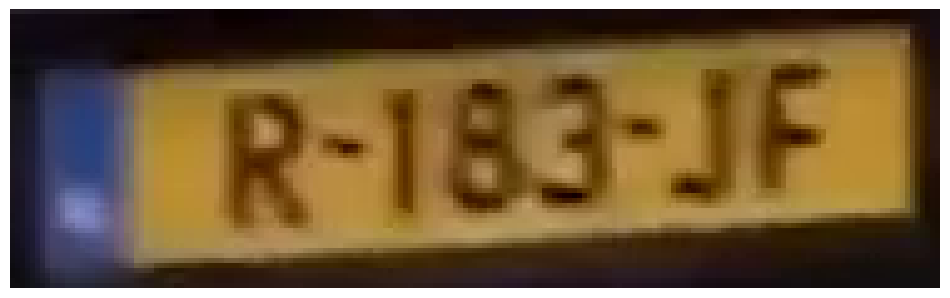

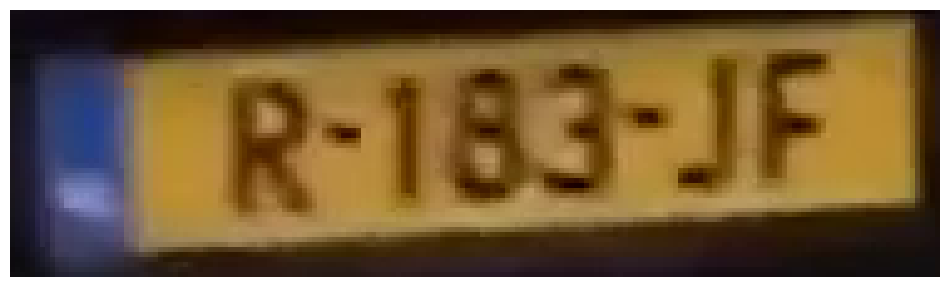

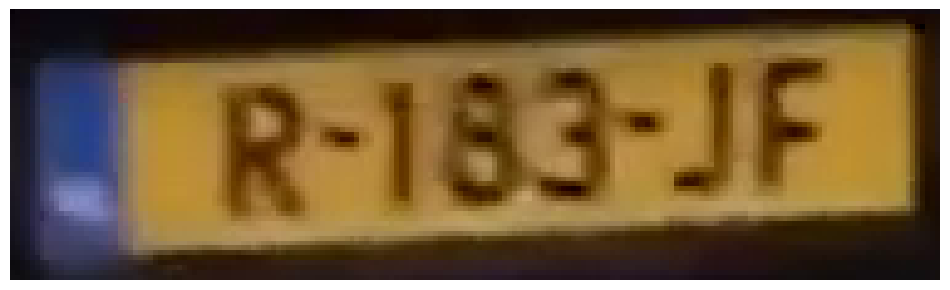

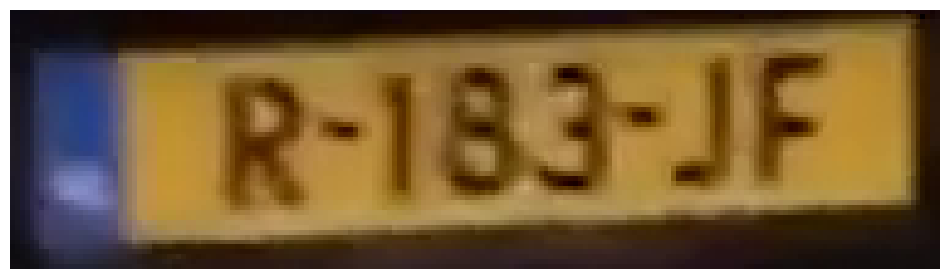

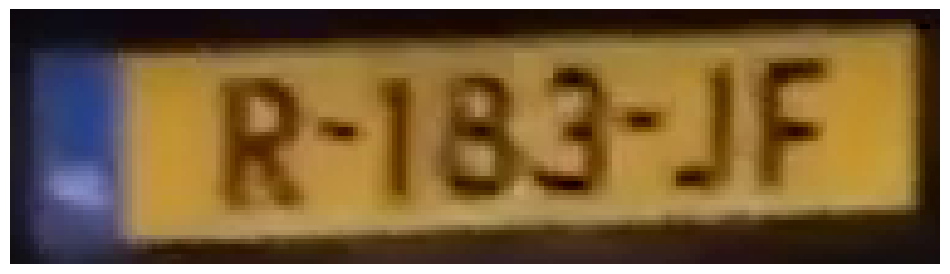

...

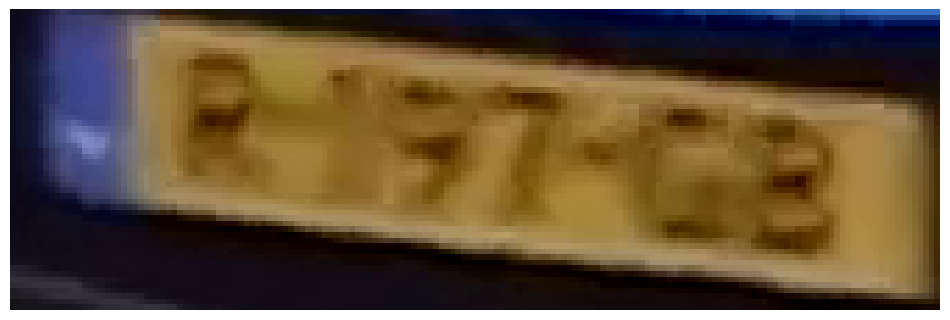

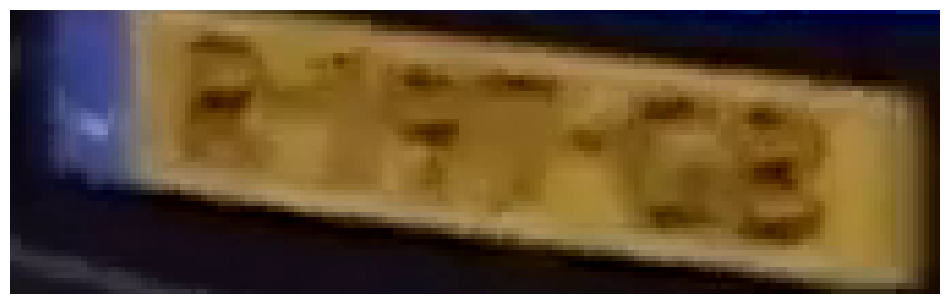

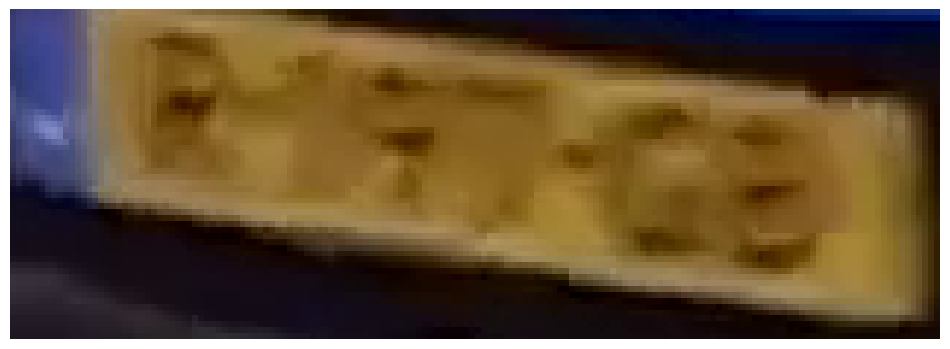

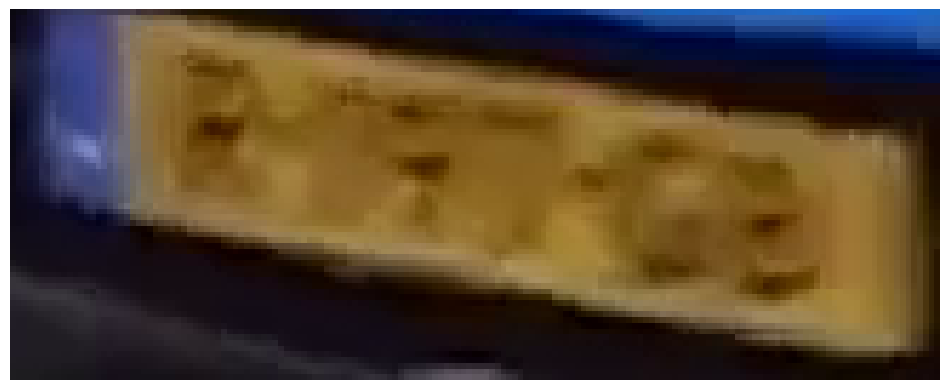

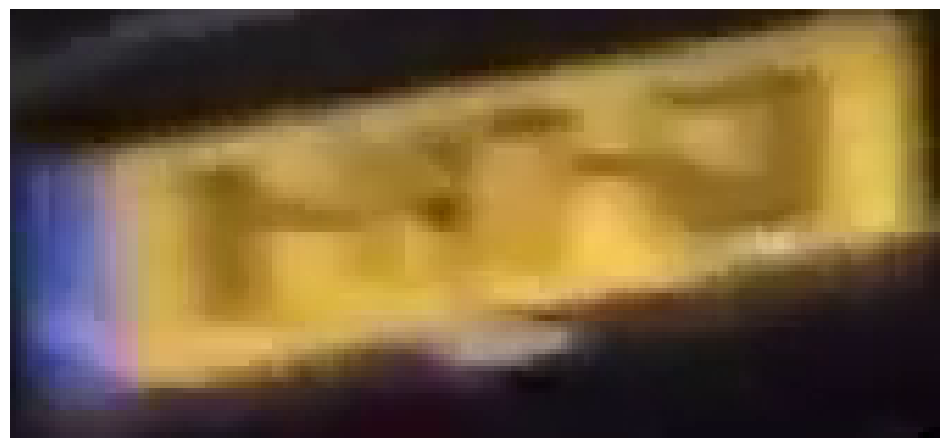

In [18]:
for image in crop_img:
  if len(image)>=1:
    sv.plot_image(image[0])


In [19]:
for image in crop_img:
  if len(image)>=1:
    gray = cv2.cvtColor(image[0], cv2.COLOR_RGB2GRAY)
    result = reader.readtext(gray)
    print(result)

[([[34, 4], [173, 4], [173, 52], [34, 52]], 'RIBH', 0.1383061408996582)]
[([[34, 0], [175, 0], [175, 50], [34, 50]], 'REBF', 0.15069642663002014)]
[([[34, 2], [175, 2], [175, 51], [34, 51]], 'REBF', 0.09284569323062897)]
[([[34, 2], [175, 2], [175, 50], [34, 50]], 'RE}F', 0.40535488724708557)]
[([[36, 5], [173, 5], [173, 49], [36, 49]], 'REZJ', 0.16498920321464539)]
[([[38, 4], [175, 4], [175, 45], [38, 45]], 'R-13J', 0.3090610614801077)]
[([[40, 3], [179, 3], [179, 45], [40, 45]], 'REZF', 0.15405993163585663)]
[([[35, 9], [173, 9], [173, 49], [35, 49]], 'RIBZJF', 0.45921843187578354)]
[([[36, 7], [175, 7], [175, 49], [36, 49]], 'REZJ', 0.25379323959350586)]
[([[33, 7], [171, 7], [171, 45], [33, 45]], 'R-IB3-JF', 0.4299377055176567)]
[([[33, 5], [169, 5], [169, 43], [33, 43]], 'R-IB3-JF', 0.6130578458564829)]
[([[39, 5], [176, 5], [176, 42], [39, 42]], 'R-183-JF', 0.6015234045489634)]
[([[37, 5], [175, 5], [175, 43], [37, 43]], 'R-183-JF', 0.5621091552568636)]
[([[39, 6], [176, 6], [17

In [20]:
TARGET_PATH = "/content/car_results.mp4"
OUTPUT_FILE_NAME="number_plate_list.xlsx"

In [21]:
import csv
import os
import uuid

In [32]:
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO)
video_sink = sv.VideoSink(TARGET_PATH,video_info=video_info)
df = pd.DataFrame(columns=["Don't know","License_plate","confidence"])

bounding_box_annotator = sv.BoundingBoxAnnotator(thickness=4)
label_annotator = sv.LabelAnnotator(text_thickness=4,text_scale=2)
generator =sv.get_video_frames_generator(SOURCE_VIDEO)

with video_sink:
  for frame in tqdm(generator,total=video_info.total_frames):
    results = model(frame)[0]
    detections = sv.Detections.from_ultralytics(results)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)

    labels = [
    f"{results.names[class_id]} {confidence:0.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
    ]

    annotated_frame = bounding_box_annotator.annotate(frame.copy(),detections)
    number_plate_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    if len(number_plate_crops)>0:
      gray = cv2.cvtColor(number_plate_crops[0], cv2.COLOR_RGB2GRAY)
      result = reader.readtext(gray)
      if result and len(result[0])==3 and result[0][-1]>0.5:
        annotated_frame = label_annotator.annotate(annotated_frame,detections,labels)
        df = pd.concat([df, pd.DataFrame([{"Don't know":result[0][0],"License_plate":result[0][1],"confidence":result[0][2]}])], ignore_index=True)
    video_sink.write_frame(annotated_frame)
df.to_excel(OUTPUT_FILE_NAME,index=False)


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
  0%|          | 0/631 [00:00<?, ?it/s]


0: 416x640 1 0, 150.7ms
Speed: 3.8ms preprocess, 150.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 1/631 [00:00<04:52,  2.16it/s]


0: 416x640 1 0, 135.8ms
Speed: 5.0ms preprocess, 135.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 2/631 [00:00<04:39,  2.25it/s]


0: 416x640 1 0, 145.0ms
Speed: 3.6ms preprocess, 145.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 3/631 [00:01<04:48,  2.17it/s]


0: 416x640 1 0, 140.8ms
Speed: 4.7ms preprocess, 140.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 4/631 [00:01<04:37,  2.26it/s]


0: 416x640 1 0, 139.3ms
Speed: 3.5ms preprocess, 139.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 5/631 [00:02<04:34,  2.28it/s]


0: 416x640 1 0, 140.7ms
Speed: 5.4ms preprocess, 140.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 6/631 [00:02<04:28,  2.33it/s]


0: 416x640 1 0, 151.0ms
Speed: 4.8ms preprocess, 151.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 7/631 [00:03<04:53,  2.13it/s]


0: 416x640 1 0, 224.2ms
Speed: 7.6ms preprocess, 224.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  1%|▏         | 8/631 [00:03<05:32,  1.87it/s]


0: 416x640 1 0, 213.2ms
Speed: 5.2ms preprocess, 213.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


  1%|▏         | 9/631 [00:04<05:54,  1.75it/s]


0: 416x640 1 0, 218.3ms
Speed: 4.4ms preprocess, 218.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 10/631 [00:05<06:11,  1.67it/s]


0: 416x640 1 0, 251.4ms
Speed: 6.2ms preprocess, 251.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 11/631 [00:05<06:35,  1.57it/s]


0: 416x640 1 0, 227.5ms
Speed: 6.5ms preprocess, 227.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 12/631 [00:06<06:57,  1.48it/s]


0: 416x640 1 0, 236.1ms
Speed: 4.2ms preprocess, 236.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 13/631 [00:07<06:28,  1.59it/s]


0: 416x640 1 0, 140.7ms
Speed: 6.0ms preprocess, 140.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 14/631 [00:07<05:51,  1.76it/s]


0: 416x640 1 0, 160.8ms
Speed: 4.2ms preprocess, 160.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 15/631 [00:08<05:26,  1.88it/s]


0: 416x640 1 0, 132.9ms
Speed: 3.5ms preprocess, 132.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 16/631 [00:08<05:04,  2.02it/s]


0: 416x640 1 0, 152.6ms
Speed: 4.2ms preprocess, 152.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 17/631 [00:08<04:57,  2.07it/s]


0: 416x640 1 0, 142.0ms
Speed: 4.2ms preprocess, 142.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 18/631 [00:09<04:46,  2.14it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.0ms preprocess, 141.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 19/631 [00:09<04:41,  2.18it/s]


0: 416x640 1 0, 144.8ms
Speed: 4.9ms preprocess, 144.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 20/631 [00:10<04:33,  2.23it/s]


0: 416x640 1 0, 144.2ms
Speed: 4.1ms preprocess, 144.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 21/631 [00:10<04:31,  2.25it/s]


0: 416x640 1 0, 160.5ms
Speed: 4.2ms preprocess, 160.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 22/631 [00:11<04:31,  2.25it/s]


0: 416x640 1 0, 139.8ms
Speed: 5.1ms preprocess, 139.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  4%|▎         | 23/631 [00:11<04:24,  2.30it/s]


0: 416x640 1 0, 147.3ms
Speed: 4.5ms preprocess, 147.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 24/631 [00:11<04:24,  2.29it/s]


0: 416x640 1 0, 135.9ms
Speed: 4.2ms preprocess, 135.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 25/631 [00:12<04:20,  2.33it/s]


0: 416x640 1 0, 136.9ms
Speed: 5.3ms preprocess, 136.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 26/631 [00:12<04:26,  2.27it/s]


0: 416x640 1 0, 141.1ms
Speed: 4.1ms preprocess, 141.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 27/631 [00:13<04:27,  2.26it/s]


0: 416x640 1 0, 132.6ms
Speed: 4.3ms preprocess, 132.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 28/631 [00:13<04:27,  2.25it/s]


0: 416x640 1 0, 149.1ms
Speed: 4.3ms preprocess, 149.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  5%|▍         | 29/631 [00:14<04:25,  2.27it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.2ms preprocess, 141.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  5%|▍         | 30/631 [00:14<04:18,  2.32it/s]


0: 416x640 1 0, 142.7ms
Speed: 4.6ms preprocess, 142.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


  5%|▍         | 31/631 [00:15<04:25,  2.26it/s]


0: 416x640 1 0, 139.1ms
Speed: 3.7ms preprocess, 139.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  5%|▌         | 32/631 [00:15<04:20,  2.30it/s]


0: 416x640 2 0s, 141.4ms
Speed: 7.4ms preprocess, 141.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  5%|▌         | 33/631 [00:15<04:21,  2.28it/s]


0: 416x640 2 0s, 136.6ms
Speed: 5.0ms preprocess, 136.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  5%|▌         | 34/631 [00:16<04:16,  2.33it/s]


0: 416x640 1 0, 134.4ms
Speed: 5.0ms preprocess, 134.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 35/631 [00:16<04:13,  2.35it/s]


0: 416x640 1 0, 172.0ms
Speed: 5.3ms preprocess, 172.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 36/631 [00:17<04:43,  2.10it/s]


0: 416x640 1 0, 209.0ms
Speed: 4.2ms preprocess, 209.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 37/631 [00:17<05:16,  1.88it/s]


0: 416x640 1 0, 213.2ms
Speed: 4.3ms preprocess, 213.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 38/631 [00:18<05:33,  1.78it/s]


0: 416x640 1 0, 219.3ms
Speed: 4.2ms preprocess, 219.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 39/631 [00:19<05:51,  1.68it/s]


0: 416x640 1 0, 219.2ms
Speed: 4.1ms preprocess, 219.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


  6%|▋         | 40/631 [00:19<06:06,  1.61it/s]


0: 416x640 1 0, 235.2ms
Speed: 4.2ms preprocess, 235.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  6%|▋         | 41/631 [00:20<06:09,  1.60it/s]


0: 416x640 1 0, 226.3ms
Speed: 4.1ms preprocess, 226.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 42/631 [00:21<05:50,  1.68it/s]


0: 416x640 1 0, 147.1ms
Speed: 4.7ms preprocess, 147.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 43/631 [00:21<05:14,  1.87it/s]


0: 416x640 1 0, 140.5ms
Speed: 8.0ms preprocess, 140.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 44/631 [00:21<04:51,  2.02it/s]


0: 416x640 1 0, 151.9ms
Speed: 5.0ms preprocess, 151.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 45/631 [00:22<04:33,  2.14it/s]


0: 416x640 1 0, 136.3ms
Speed: 5.1ms preprocess, 136.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 46/631 [00:22<04:15,  2.29it/s]


0: 416x640 1 0, 147.2ms
Speed: 3.6ms preprocess, 147.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 47/631 [00:23<04:08,  2.35it/s]


0: 416x640 1 0, 141.3ms
Speed: 5.9ms preprocess, 141.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 48/631 [00:23<04:01,  2.41it/s]


0: 416x640 1 0, 143.3ms
Speed: 4.4ms preprocess, 143.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 49/631 [00:23<03:57,  2.45it/s]


0: 416x640 1 0, 152.1ms
Speed: 3.4ms preprocess, 152.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 50/631 [00:24<03:56,  2.46it/s]


0: 416x640 1 0, 136.1ms
Speed: 4.0ms preprocess, 136.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 51/631 [00:24<03:46,  2.56it/s]


0: 416x640 1 0, 144.1ms
Speed: 4.0ms preprocess, 144.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 52/631 [00:25<03:51,  2.50it/s]


0: 416x640 1 0, 150.6ms
Speed: 5.3ms preprocess, 150.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 53/631 [00:25<03:46,  2.56it/s]


0: 416x640 1 0, 138.0ms
Speed: 4.8ms preprocess, 138.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  9%|▊         | 54/631 [00:25<03:42,  2.59it/s]


0: 416x640 1 0, 143.7ms
Speed: 4.5ms preprocess, 143.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  9%|▊         | 55/631 [00:26<03:47,  2.53it/s]


0: 416x640 1 0, 145.3ms
Speed: 4.2ms preprocess, 145.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 56/631 [00:26<03:40,  2.61it/s]


0: 416x640 1 0, 131.6ms
Speed: 3.9ms preprocess, 131.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 57/631 [00:26<03:47,  2.52it/s]


0: 416x640 1 0, 135.6ms
Speed: 3.4ms preprocess, 135.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 58/631 [00:27<03:43,  2.57it/s]


0: 416x640 1 0, 137.0ms
Speed: 5.4ms preprocess, 137.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 59/631 [00:27<03:56,  2.42it/s]


0: 416x640 1 0, 139.7ms
Speed: 4.2ms preprocess, 139.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 60/631 [00:28<03:47,  2.51it/s]


0: 416x640 1 0, 151.9ms
Speed: 4.3ms preprocess, 151.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 61/631 [00:28<03:40,  2.58it/s]


0: 416x640 1 0, 143.0ms
Speed: 5.1ms preprocess, 143.0ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 62/631 [00:29<03:54,  2.42it/s]


0: 416x640 1 0, 138.8ms
Speed: 4.9ms preprocess, 138.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 63/631 [00:29<04:06,  2.31it/s]


0: 416x640 1 0, 144.7ms
Speed: 5.1ms preprocess, 144.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 10%|█         | 64/631 [00:29<04:10,  2.27it/s]


0: 416x640 1 0, 140.1ms
Speed: 4.7ms preprocess, 140.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 10%|█         | 65/631 [00:30<03:55,  2.41it/s]


0: 416x640 1 0, 171.6ms
Speed: 3.3ms preprocess, 171.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 10%|█         | 66/631 [00:30<03:51,  2.44it/s]


0: 416x640 1 0, 140.9ms
Speed: 6.9ms preprocess, 140.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 67/631 [00:31<04:00,  2.34it/s]


0: 416x640 1 0, 235.3ms
Speed: 4.1ms preprocess, 235.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 68/631 [00:31<04:58,  1.89it/s]


0: 416x640 1 0, 210.7ms
Speed: 6.9ms preprocess, 210.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 69/631 [00:32<05:30,  1.70it/s]


0: 416x640 1 0, 226.5ms
Speed: 7.5ms preprocess, 226.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 70/631 [00:33<05:57,  1.57it/s]


0: 416x640 1 0, 236.1ms
Speed: 4.6ms preprocess, 236.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 11%|█▏        | 71/631 [00:34<06:22,  1.46it/s]


0: 416x640 1 0, 228.9ms
Speed: 4.1ms preprocess, 228.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 11%|█▏        | 72/631 [00:35<06:40,  1.40it/s]


0: 416x640 1 0, 138.7ms
Speed: 5.5ms preprocess, 138.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 73/631 [00:35<05:58,  1.56it/s]


0: 416x640 1 0, 138.5ms
Speed: 4.2ms preprocess, 138.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 74/631 [00:35<05:33,  1.67it/s]


0: 416x640 1 0, 144.5ms
Speed: 4.5ms preprocess, 144.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 75/631 [00:36<05:14,  1.77it/s]


0: 416x640 1 0, 139.1ms
Speed: 3.7ms preprocess, 139.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 76/631 [00:36<05:02,  1.84it/s]


0: 416x640 1 0, 145.2ms
Speed: 4.4ms preprocess, 145.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 77/631 [00:37<04:41,  1.97it/s]


0: 416x640 1 0, 149.2ms
Speed: 4.5ms preprocess, 149.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 78/631 [00:37<04:37,  1.99it/s]


0: 416x640 1 0, 142.2ms
Speed: 4.0ms preprocess, 142.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 79/631 [00:38<04:31,  2.04it/s]


0: 416x640 1 0, 139.9ms
Speed: 4.1ms preprocess, 139.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 80/631 [00:38<04:29,  2.04it/s]


0: 416x640 1 0, 142.1ms
Speed: 4.3ms preprocess, 142.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 81/631 [00:39<04:25,  2.07it/s]


0: 416x640 1 0, 142.0ms
Speed: 3.9ms preprocess, 142.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 82/631 [00:39<04:24,  2.08it/s]


0: 416x640 1 0, 154.0ms
Speed: 4.8ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 83/631 [00:40<04:19,  2.11it/s]


0: 416x640 1 0, 141.7ms
Speed: 4.5ms preprocess, 141.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 84/631 [00:40<04:17,  2.12it/s]


0: 416x640 1 0, 160.1ms
Speed: 6.1ms preprocess, 160.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 85/631 [00:41<04:25,  2.06it/s]


0: 416x640 1 0, 138.8ms
Speed: 4.8ms preprocess, 138.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▎        | 86/631 [00:41<04:17,  2.11it/s]


0: 416x640 1 0, 156.8ms
Speed: 6.2ms preprocess, 156.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 87/631 [00:42<04:16,  2.12it/s]


0: 416x640 1 0, 142.8ms
Speed: 4.6ms preprocess, 142.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 88/631 [00:42<04:01,  2.25it/s]


0: 416x640 1 0, 134.9ms
Speed: 4.3ms preprocess, 134.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 89/631 [00:42<04:04,  2.21it/s]


0: 416x640 1 0, 136.5ms
Speed: 4.6ms preprocess, 136.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 90/631 [00:43<03:53,  2.32it/s]


0: 416x640 1 0, 139.3ms
Speed: 6.8ms preprocess, 139.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 91/631 [00:43<04:00,  2.25it/s]


0: 416x640 1 0, 152.8ms
Speed: 4.9ms preprocess, 152.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▍        | 92/631 [00:44<03:53,  2.31it/s]


0: 416x640 1 0, 135.9ms
Speed: 4.1ms preprocess, 135.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▍        | 93/631 [00:44<03:44,  2.39it/s]


0: 416x640 1 0, 155.8ms
Speed: 4.6ms preprocess, 155.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▍        | 94/631 [00:45<03:59,  2.24it/s]


0: 416x640 1 0, 228.4ms
Speed: 7.8ms preprocess, 228.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▌        | 95/631 [00:45<04:26,  2.01it/s]


0: 416x640 1 0, 224.9ms
Speed: 4.3ms preprocess, 224.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▌        | 96/631 [00:46<04:48,  1.85it/s]


0: 416x640 1 0, 216.6ms
Speed: 4.9ms preprocess, 216.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▌        | 97/631 [00:46<04:55,  1.81it/s]


0: 416x640 1 0, 231.0ms
Speed: 4.6ms preprocess, 231.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 98/631 [00:47<05:05,  1.75it/s]


0: 416x640 1 0, 225.5ms
Speed: 4.2ms preprocess, 225.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 99/631 [00:48<05:22,  1.65it/s]


0: 416x640 1 0, 230.1ms
Speed: 4.8ms preprocess, 230.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 100/631 [00:48<05:25,  1.63it/s]


0: 416x640 1 0, 198.6ms
Speed: 4.3ms preprocess, 198.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 101/631 [00:49<05:02,  1.75it/s]


0: 416x640 1 0, 149.1ms
Speed: 4.3ms preprocess, 149.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 102/631 [00:49<04:34,  1.93it/s]


0: 416x640 1 0, 136.4ms
Speed: 4.7ms preprocess, 136.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▋        | 103/631 [00:50<04:12,  2.09it/s]


0: 416x640 1 0, 140.9ms
Speed: 4.5ms preprocess, 140.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▋        | 104/631 [00:50<03:59,  2.20it/s]


0: 416x640 1 0, 136.7ms
Speed: 5.0ms preprocess, 136.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 105/631 [00:50<03:50,  2.28it/s]


0: 416x640 1 0, 138.4ms
Speed: 4.7ms preprocess, 138.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 106/631 [00:51<03:41,  2.37it/s]


0: 416x640 1 0, 146.1ms
Speed: 4.1ms preprocess, 146.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 107/631 [00:51<03:38,  2.39it/s]


0: 416x640 1 0, 134.7ms
Speed: 4.3ms preprocess, 134.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 108/631 [00:52<03:33,  2.45it/s]


0: 416x640 1 0, 136.0ms
Speed: 4.1ms preprocess, 136.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 109/631 [00:52<03:30,  2.48it/s]


0: 416x640 1 0, 140.3ms
Speed: 4.4ms preprocess, 140.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 110/631 [00:52<03:29,  2.48it/s]


0: 416x640 1 0, 137.6ms
Speed: 4.3ms preprocess, 137.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 111/631 [00:53<03:26,  2.52it/s]


0: 416x640 1 0, 158.3ms
Speed: 4.0ms preprocess, 158.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 112/631 [00:53<03:23,  2.55it/s]


0: 416x640 1 0, 146.2ms
Speed: 4.9ms preprocess, 146.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 113/631 [00:54<03:21,  2.57it/s]


0: 416x640 1 0, 140.4ms
Speed: 4.0ms preprocess, 140.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 114/631 [00:54<04:13,  2.04it/s]


0: 416x640 1 0, 152.8ms
Speed: 5.0ms preprocess, 152.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 115/631 [00:55<04:46,  1.80it/s]


0: 416x640 1 0, 148.7ms
Speed: 7.6ms preprocess, 148.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 116/631 [00:56<05:01,  1.71it/s]


0: 416x640 1 0, 137.2ms
Speed: 4.2ms preprocess, 137.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▊        | 117/631 [00:56<05:06,  1.68it/s]


0: 416x640 1 0, 141.8ms
Speed: 4.6ms preprocess, 141.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▊        | 118/631 [00:57<05:17,  1.62it/s]


0: 416x640 1 0, 148.2ms
Speed: 4.7ms preprocess, 148.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 119/631 [00:57<04:59,  1.71it/s]


0: 416x640 1 0, 131.6ms
Speed: 5.7ms preprocess, 131.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 120/631 [00:58<04:40,  1.82it/s]


0: 416x640 1 0, 141.0ms
Speed: 5.5ms preprocess, 141.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 121/631 [00:58<04:33,  1.87it/s]


0: 416x640 1 0, 143.6ms
Speed: 4.7ms preprocess, 143.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 122/631 [00:59<04:49,  1.76it/s]


0: 416x640 1 0, 233.9ms
Speed: 4.2ms preprocess, 233.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 123/631 [01:00<05:10,  1.64it/s]


0: 416x640 1 0, 205.8ms
Speed: 6.7ms preprocess, 205.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 20%|█▉        | 124/631 [01:01<05:25,  1.56it/s]


0: 416x640 1 0, 220.2ms
Speed: 4.3ms preprocess, 220.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 20%|█▉        | 125/631 [01:01<05:39,  1.49it/s]


0: 416x640 1 0, 249.4ms
Speed: 4.3ms preprocess, 249.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 20%|█▉        | 126/631 [01:02<05:57,  1.41it/s]


0: 416x640 1 0, 217.2ms
Speed: 4.1ms preprocess, 217.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 20%|██        | 127/631 [01:03<05:54,  1.42it/s]


0: 416x640 1 0, 144.6ms
Speed: 4.5ms preprocess, 144.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 20%|██        | 128/631 [01:03<05:17,  1.58it/s]


0: 416x640 1 0, 149.1ms
Speed: 4.0ms preprocess, 149.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 20%|██        | 129/631 [01:04<04:49,  1.73it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.5ms preprocess, 141.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 130/631 [01:04<04:27,  1.87it/s]


0: 416x640 1 0, 144.0ms
Speed: 4.1ms preprocess, 144.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 131/631 [01:05<04:15,  1.96it/s]


0: 416x640 1 0, 147.6ms
Speed: 4.5ms preprocess, 147.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 132/631 [01:05<04:05,  2.04it/s]


0: 416x640 1 0, 140.5ms
Speed: 4.6ms preprocess, 140.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 133/631 [01:05<03:56,  2.10it/s]


0: 416x640 1 0, 151.7ms
Speed: 4.6ms preprocess, 151.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 134/631 [01:06<03:50,  2.16it/s]


0: 416x640 1 0, 133.8ms
Speed: 5.5ms preprocess, 133.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 21%|██▏       | 135/631 [01:06<03:45,  2.20it/s]


0: 416x640 1 0, 142.9ms
Speed: 5.1ms preprocess, 142.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 136/631 [01:07<03:42,  2.22it/s]


0: 416x640 1 0, 143.7ms
Speed: 4.2ms preprocess, 143.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 137/631 [01:07<03:43,  2.21it/s]


0: 416x640 1 0, 158.7ms
Speed: 3.1ms preprocess, 158.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 138/631 [01:08<03:49,  2.14it/s]


0: 416x640 1 0, 144.2ms
Speed: 5.9ms preprocess, 144.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 139/631 [01:08<03:47,  2.16it/s]


0: 416x640 1 0, 148.6ms
Speed: 5.1ms preprocess, 148.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 140/631 [01:09<03:50,  2.13it/s]


0: 416x640 1 0, 146.8ms
Speed: 4.5ms preprocess, 146.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 141/631 [01:09<03:45,  2.18it/s]


0: 416x640 1 0, 137.5ms
Speed: 3.8ms preprocess, 137.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 142/631 [01:10<03:46,  2.16it/s]


0: 416x640 1 0, 151.5ms
Speed: 5.7ms preprocess, 151.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 143/631 [01:10<03:47,  2.14it/s]


0: 416x640 1 0, 142.5ms
Speed: 4.2ms preprocess, 142.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 144/631 [01:10<03:45,  2.16it/s]


0: 416x640 1 0, 148.3ms
Speed: 6.4ms preprocess, 148.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 145/631 [01:11<03:47,  2.14it/s]


0: 416x640 1 0, 142.9ms
Speed: 4.1ms preprocess, 142.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 146/631 [01:11<03:46,  2.14it/s]


0: 416x640 1 0, 131.5ms
Speed: 5.7ms preprocess, 131.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 147/631 [01:12<03:44,  2.15it/s]


0: 416x640 1 0, 134.2ms
Speed: 5.5ms preprocess, 134.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 148/631 [01:12<03:44,  2.15it/s]


0: 416x640 1 0, 146.4ms
Speed: 4.3ms preprocess, 146.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▎       | 149/631 [01:13<03:51,  2.08it/s]


0: 416x640 1 0, 209.9ms
Speed: 4.0ms preprocess, 209.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 150/631 [01:14<04:21,  1.84it/s]


0: 416x640 1 0, 214.3ms
Speed: 7.5ms preprocess, 214.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 151/631 [01:14<04:45,  1.68it/s]


0: 416x640 1 0, 209.5ms
Speed: 4.2ms preprocess, 209.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 152/631 [01:15<05:02,  1.59it/s]


0: 416x640 1 0, 222.0ms
Speed: 4.7ms preprocess, 222.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 153/631 [01:16<05:16,  1.51it/s]


0: 416x640 1 0, 235.7ms
Speed: 4.0ms preprocess, 235.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 154/631 [01:16<05:30,  1.44it/s]


0: 416x640 1 0, 207.9ms
Speed: 5.9ms preprocess, 207.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▍       | 155/631 [01:17<05:14,  1.51it/s]


0: 416x640 1 0, 145.8ms
Speed: 4.3ms preprocess, 145.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▍       | 156/631 [01:18<04:46,  1.66it/s]


0: 416x640 1 0, 139.4ms
Speed: 5.9ms preprocess, 139.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▍       | 157/631 [01:18<04:18,  1.83it/s]


0: 416x640 1 0, 153.4ms
Speed: 4.1ms preprocess, 153.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 158/631 [01:18<04:03,  1.94it/s]


0: 416x640 1 0, 140.6ms
Speed: 4.2ms preprocess, 140.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 159/631 [01:19<03:51,  2.04it/s]


0: 416x640 1 0, 138.4ms
Speed: 4.0ms preprocess, 138.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 160/631 [01:19<03:47,  2.07it/s]


0: 416x640 1 0, 136.9ms
Speed: 5.5ms preprocess, 136.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 161/631 [01:20<03:38,  2.15it/s]


0: 416x640 1 0, 131.8ms
Speed: 6.1ms preprocess, 131.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 162/631 [01:20<03:34,  2.19it/s]


0: 416x640 1 0, 154.3ms
Speed: 4.8ms preprocess, 154.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 163/631 [01:21<03:32,  2.21it/s]


0: 416x640 2 0s, 137.7ms
Speed: 4.2ms preprocess, 137.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 164/631 [01:21<03:28,  2.24it/s]


0: 416x640 1 0, 147.9ms
Speed: 4.0ms preprocess, 147.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 165/631 [01:21<03:28,  2.23it/s]


0: 416x640 1 0, 135.4ms
Speed: 4.4ms preprocess, 135.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▋       | 166/631 [01:22<03:24,  2.27it/s]


0: 416x640 1 0, 137.3ms
Speed: 7.7ms preprocess, 137.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▋       | 167/631 [01:22<03:23,  2.28it/s]


0: 416x640 1 0, 143.1ms
Speed: 5.5ms preprocess, 143.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 168/631 [01:23<03:16,  2.35it/s]


0: 416x640 2 0s, 137.8ms
Speed: 6.1ms preprocess, 137.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 169/631 [01:23<03:11,  2.41it/s]


0: 416x640 1 0, 167.4ms
Speed: 5.6ms preprocess, 167.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 170/631 [01:24<03:13,  2.38it/s]


0: 416x640 1 0, 136.4ms
Speed: 4.7ms preprocess, 136.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 171/631 [01:24<03:07,  2.46it/s]


0: 416x640 1 0, 141.6ms
Speed: 3.6ms preprocess, 141.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 172/631 [01:24<03:06,  2.46it/s]


0: 416x640 1 0, 143.8ms
Speed: 4.9ms preprocess, 143.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 173/631 [01:25<03:03,  2.49it/s]


0: 416x640 1 0, 134.7ms
Speed: 4.3ms preprocess, 134.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 174/631 [01:25<03:02,  2.50it/s]


0: 416x640 1 0, 161.8ms
Speed: 7.3ms preprocess, 161.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 175/631 [01:26<03:06,  2.45it/s]


0: 416x640 1 0, 133.5ms
Speed: 4.7ms preprocess, 133.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 176/631 [01:26<03:02,  2.50it/s]


0: 416x640 1 0, 136.5ms
Speed: 5.6ms preprocess, 136.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 177/631 [01:26<03:03,  2.48it/s]


0: 416x640 1 0, 143.2ms
Speed: 5.2ms preprocess, 143.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 178/631 [01:27<03:00,  2.51it/s]


0: 416x640 1 0, 154.3ms
Speed: 6.0ms preprocess, 154.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 179/631 [01:27<03:16,  2.30it/s]


0: 416x640 1 0, 224.4ms
Speed: 8.1ms preprocess, 224.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▊       | 180/631 [01:28<03:44,  2.01it/s]


0: 416x640 1 0, 212.5ms
Speed: 7.9ms preprocess, 212.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▊       | 181/631 [01:28<03:58,  1.89it/s]


0: 416x640 1 0, 208.5ms
Speed: 4.2ms preprocess, 208.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 182/631 [01:29<03:59,  1.87it/s]


0: 416x640 1 0, 226.8ms
Speed: 6.0ms preprocess, 226.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 183/631 [01:30<04:02,  1.84it/s]


0: 416x640 1 0, 226.4ms
Speed: 9.3ms preprocess, 226.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 184/631 [01:30<04:12,  1.77it/s]


0: 416x640 1 0, 238.5ms
Speed: 5.5ms preprocess, 238.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 185/631 [01:31<04:17,  1.73it/s]


0: 416x640 1 0, 137.8ms
Speed: 4.7ms preprocess, 137.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 186/631 [01:31<03:48,  1.94it/s]


0: 416x640 1 0, 144.4ms
Speed: 3.9ms preprocess, 144.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 30%|██▉       | 187/631 [01:32<03:30,  2.11it/s]


0: 416x640 1 0, 142.4ms
Speed: 4.2ms preprocess, 142.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 30%|██▉       | 188/631 [01:32<03:14,  2.28it/s]


0: 416x640 1 0, 149.8ms
Speed: 4.0ms preprocess, 149.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 30%|██▉       | 189/631 [01:32<03:06,  2.37it/s]


0: 416x640 1 0, 147.2ms
Speed: 5.0ms preprocess, 147.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 190/631 [01:33<03:00,  2.44it/s]


0: 416x640 1 0, 144.2ms
Speed: 4.0ms preprocess, 144.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 191/631 [01:33<02:59,  2.45it/s]


0: 416x640 1 0, 167.0ms
Speed: 3.9ms preprocess, 167.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 192/631 [01:33<02:59,  2.45it/s]


0: 416x640 1 0, 153.0ms
Speed: 4.3ms preprocess, 153.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 193/631 [01:34<02:54,  2.51it/s]


0: 416x640 1 0, 143.8ms
Speed: 4.6ms preprocess, 143.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 194/631 [01:34<02:42,  2.69it/s]


0: 416x640 1 0, 159.3ms
Speed: 4.6ms preprocess, 159.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 195/631 [01:35<02:42,  2.68it/s]


0: 416x640 1 0, 150.4ms
Speed: 4.9ms preprocess, 150.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 196/631 [01:35<02:43,  2.66it/s]


0: 416x640 1 0, 145.3ms
Speed: 4.0ms preprocess, 145.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 197/631 [01:35<02:43,  2.66it/s]


0: 416x640 1 0, 142.5ms
Speed: 4.0ms preprocess, 142.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 31%|███▏      | 198/631 [01:36<02:41,  2.69it/s]


0: 416x640 1 0, 140.9ms
Speed: 4.5ms preprocess, 140.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 199/631 [01:36<02:41,  2.68it/s]


0: 416x640 1 0, 137.4ms
Speed: 3.9ms preprocess, 137.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 200/631 [01:36<02:41,  2.67it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.1ms preprocess, 141.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 201/631 [01:37<02:41,  2.67it/s]


0: 416x640 1 0, 132.2ms
Speed: 4.0ms preprocess, 132.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 202/631 [01:37<02:40,  2.67it/s]


0: 416x640 1 0, 154.8ms
Speed: 4.5ms preprocess, 154.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 203/631 [01:38<02:40,  2.67it/s]


0: 416x640 1 0, 141.1ms
Speed: 4.4ms preprocess, 141.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 204/631 [01:38<02:40,  2.66it/s]


0: 416x640 1 0, 145.8ms
Speed: 5.1ms preprocess, 145.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 205/631 [01:38<02:32,  2.78it/s]


0: 416x640 1 0, 141.9ms
Speed: 6.4ms preprocess, 141.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 206/631 [01:39<02:27,  2.88it/s]


0: 416x640 1 0, 146.3ms
Speed: 4.7ms preprocess, 146.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 207/631 [01:39<02:30,  2.82it/s]


0: 416x640 1 0, 144.0ms
Speed: 5.1ms preprocess, 144.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 208/631 [01:39<02:32,  2.77it/s]


0: 416x640 2 0s, 138.9ms
Speed: 5.5ms preprocess, 138.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 209/631 [01:40<02:31,  2.79it/s]


0: 416x640 1 0, 139.3ms
Speed: 4.2ms preprocess, 139.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 210/631 [01:40<02:39,  2.64it/s]


0: 416x640 1 0, 140.9ms
Speed: 5.0ms preprocess, 140.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 211/631 [01:40<02:31,  2.77it/s]


0: 416x640 2 0s, 136.4ms
Speed: 5.9ms preprocess, 136.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▎      | 212/631 [01:41<02:30,  2.78it/s]


0: 416x640 1 0, 224.0ms
Speed: 4.6ms preprocess, 224.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 213/631 [01:41<02:47,  2.49it/s]


0: 416x640 1 0, 211.1ms
Speed: 4.8ms preprocess, 211.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 214/631 [01:42<03:22,  2.06it/s]


0: 416x640 1 0, 210.1ms
Speed: 4.1ms preprocess, 210.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 215/631 [01:43<03:50,  1.80it/s]


0: 416x640 1 0, 216.7ms
Speed: 5.1ms preprocess, 216.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 216/631 [01:43<04:09,  1.66it/s]


0: 416x640 1 0, 235.6ms
Speed: 4.1ms preprocess, 235.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 217/631 [01:44<04:14,  1.63it/s]


0: 416x640 1 0, 251.5ms
Speed: 5.9ms preprocess, 251.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▍      | 218/631 [01:45<04:33,  1.51it/s]


0: 416x640 1 0, 202.9ms
Speed: 4.3ms preprocess, 202.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▍      | 219/631 [01:45<04:17,  1.60it/s]


0: 416x640 1 0, 143.1ms
Speed: 4.3ms preprocess, 143.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▍      | 220/631 [01:46<03:59,  1.72it/s]


0: 416x640 1 0, 141.7ms
Speed: 5.1ms preprocess, 141.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 221/631 [01:46<03:48,  1.80it/s]


0: 416x640 1 0, 142.0ms
Speed: 6.6ms preprocess, 142.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 222/631 [01:47<03:28,  1.97it/s]


0: 416x640 1 0, 136.5ms
Speed: 4.3ms preprocess, 136.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 223/631 [01:47<03:19,  2.05it/s]


0: 416x640 1 0, 155.9ms
Speed: 7.4ms preprocess, 155.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 224/631 [01:48<03:09,  2.15it/s]


0: 416x640 1 0, 145.0ms
Speed: 5.7ms preprocess, 145.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 225/631 [01:48<03:06,  2.17it/s]


0: 416x640 1 0, 151.9ms
Speed: 4.8ms preprocess, 151.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 226/631 [01:49<03:12,  2.11it/s]


0: 416x640 1 0, 149.0ms
Speed: 4.2ms preprocess, 149.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 227/631 [01:49<03:11,  2.11it/s]


0: 416x640 1 0, 143.0ms
Speed: 4.0ms preprocess, 143.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 228/631 [01:49<03:03,  2.20it/s]


0: 416x640 1 0, 138.9ms
Speed: 4.0ms preprocess, 138.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▋      | 229/631 [01:50<03:01,  2.22it/s]


0: 416x640 1 0, 145.8ms
Speed: 4.0ms preprocess, 145.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▋      | 230/631 [01:50<02:54,  2.29it/s]


0: 416x640 1 0, 153.9ms
Speed: 4.2ms preprocess, 153.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 231/631 [01:51<02:51,  2.34it/s]


0: 416x640 1 0, 139.6ms
Speed: 4.5ms preprocess, 139.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 232/631 [01:51<02:53,  2.30it/s]


0: 416x640 1 0, 163.6ms
Speed: 4.5ms preprocess, 163.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 233/631 [01:52<02:58,  2.23it/s]


0: 416x640 1 0, 138.2ms
Speed: 5.0ms preprocess, 138.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 234/631 [01:52<02:58,  2.22it/s]


0: 416x640 1 0, 142.4ms
Speed: 5.8ms preprocess, 142.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 235/631 [01:53<03:01,  2.18it/s]


0: 416x640 1 0, 137.0ms
Speed: 5.5ms preprocess, 137.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 236/631 [01:53<02:59,  2.20it/s]


0: 416x640 1 0, 143.1ms
Speed: 4.1ms preprocess, 143.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 237/631 [01:53<02:53,  2.27it/s]


0: 416x640 1 0, 162.9ms
Speed: 4.8ms preprocess, 162.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 238/631 [01:54<02:50,  2.30it/s]


0: 416x640 1 0, 150.1ms
Speed: 4.5ms preprocess, 150.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 239/631 [01:54<02:54,  2.25it/s]


0: 416x640 1 0, 180.5ms
Speed: 6.5ms preprocess, 180.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 240/631 [01:55<02:59,  2.17it/s]


0: 416x640 1 0, 154.5ms
Speed: 4.0ms preprocess, 154.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 241/631 [01:55<03:07,  2.07it/s]


0: 416x640 1 0, 253.9ms
Speed: 9.1ms preprocess, 253.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 242/631 [01:56<03:29,  1.85it/s]


0: 416x640 1 0, 218.3ms
Speed: 4.5ms preprocess, 218.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▊      | 243/631 [01:57<03:37,  1.79it/s]


0: 416x640 1 0, 225.7ms
Speed: 4.6ms preprocess, 225.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▊      | 244/631 [01:57<03:42,  1.74it/s]


0: 416x640 1 0, 233.0ms
Speed: 4.5ms preprocess, 233.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 245/631 [01:58<04:02,  1.59it/s]


0: 416x640 1 0, 236.9ms
Speed: 8.7ms preprocess, 236.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 246/631 [01:59<04:05,  1.57it/s]


0: 416x640 1 0, 234.2ms
Speed: 6.9ms preprocess, 234.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 247/631 [01:59<03:56,  1.63it/s]


0: 416x640 1 0, 153.2ms
Speed: 4.3ms preprocess, 153.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 248/631 [02:00<03:38,  1.75it/s]


0: 416x640 1 0, 140.3ms
Speed: 4.0ms preprocess, 140.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 249/631 [02:00<03:19,  1.92it/s]


0: 416x640 1 0, 140.8ms
Speed: 4.5ms preprocess, 140.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 250/631 [02:00<03:05,  2.06it/s]


0: 416x640 1 0, 135.0ms
Speed: 3.9ms preprocess, 135.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 251/631 [02:01<02:53,  2.19it/s]


0: 416x640 1 0, 157.0ms
Speed: 4.1ms preprocess, 157.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 252/631 [02:01<02:48,  2.24it/s]


0: 416x640 1 0, 146.7ms
Speed: 4.7ms preprocess, 146.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 40%|████      | 253/631 [02:02<02:52,  2.20it/s]


0: 416x640 1 0, 131.1ms
Speed: 4.3ms preprocess, 131.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 40%|████      | 254/631 [02:02<02:49,  2.23it/s]


0: 416x640 1 0, 166.9ms
Speed: 4.2ms preprocess, 166.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 40%|████      | 255/631 [02:03<02:49,  2.22it/s]


0: 416x640 1 0, 139.1ms
Speed: 5.6ms preprocess, 139.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 256/631 [02:03<02:47,  2.24it/s]


0: 416x640 1 0, 141.2ms
Speed: 5.5ms preprocess, 141.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 257/631 [02:03<02:47,  2.23it/s]


0: 416x640 1 0, 131.9ms
Speed: 4.9ms preprocess, 131.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 258/631 [02:04<02:43,  2.28it/s]


0: 416x640 1 0, 161.9ms
Speed: 6.0ms preprocess, 161.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 259/631 [02:04<02:47,  2.22it/s]


0: 416x640 1 0, 136.3ms
Speed: 4.0ms preprocess, 136.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 260/631 [02:05<02:44,  2.25it/s]


0: 416x640 1 0, 144.3ms
Speed: 5.1ms preprocess, 144.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 41%|████▏     | 261/631 [02:05<02:44,  2.25it/s]


0: 416x640 1 0, 145.0ms
Speed: 5.0ms preprocess, 145.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 262/631 [02:06<02:41,  2.28it/s]


0: 416x640 1 0, 134.9ms
Speed: 5.4ms preprocess, 134.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 263/631 [02:06<02:39,  2.30it/s]


0: 416x640 1 0, 157.0ms
Speed: 4.6ms preprocess, 157.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 264/631 [02:07<02:41,  2.27it/s]


0: 416x640 1 0, 138.4ms
Speed: 4.3ms preprocess, 138.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 265/631 [02:07<02:39,  2.29it/s]


0: 416x640 1 0, 151.7ms
Speed: 4.9ms preprocess, 151.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 266/631 [02:07<02:42,  2.25it/s]


0: 416x640 1 0, 135.3ms
Speed: 4.7ms preprocess, 135.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 267/631 [02:08<02:39,  2.28it/s]


0: 416x640 1 0, 140.4ms
Speed: 4.4ms preprocess, 140.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 268/631 [02:08<02:41,  2.25it/s]


0: 416x640 1 0, 135.8ms
Speed: 3.7ms preprocess, 135.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 269/631 [02:09<02:37,  2.30it/s]


0: 416x640 1 0, 133.6ms
Speed: 8.8ms preprocess, 133.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 270/631 [02:09<02:44,  2.19it/s]


0: 416x640 1 0, 231.1ms
Speed: 4.2ms preprocess, 231.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 271/631 [02:10<03:08,  1.91it/s]


0: 416x640 1 0, 223.0ms
Speed: 4.3ms preprocess, 223.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 272/631 [02:11<03:22,  1.77it/s]


0: 416x640 1 0, 206.7ms
Speed: 5.7ms preprocess, 206.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 273/631 [02:11<03:29,  1.71it/s]


0: 416x640 1 0, 236.8ms
Speed: 9.3ms preprocess, 236.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 274/631 [02:12<03:37,  1.64it/s]


0: 416x640 1 0, 217.2ms
Speed: 5.9ms preprocess, 217.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▎     | 275/631 [02:13<03:48,  1.56it/s]


0: 416x640 1 0, 171.8ms
Speed: 4.2ms preprocess, 171.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▎     | 276/631 [02:13<03:27,  1.71it/s]


0: 416x640 1 0, 134.1ms
Speed: 4.9ms preprocess, 134.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 277/631 [02:14<03:12,  1.84it/s]


0: 416x640 1 0, 143.0ms
Speed: 5.0ms preprocess, 143.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 278/631 [02:14<02:58,  1.98it/s]


0: 416x640 1 0, 138.5ms
Speed: 4.1ms preprocess, 138.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 279/631 [02:14<02:47,  2.10it/s]


0: 416x640 1 0, 159.8ms
Speed: 4.1ms preprocess, 159.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 280/631 [02:15<02:42,  2.16it/s]


0: 416x640 1 0, 137.4ms
Speed: 6.4ms preprocess, 137.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▍     | 281/631 [02:15<02:33,  2.28it/s]


0: 416x640 1 0, 155.6ms
Speed: 6.3ms preprocess, 155.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▍     | 282/631 [02:16<02:31,  2.30it/s]


0: 416x640 1 0, 141.0ms
Speed: 6.6ms preprocess, 141.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▍     | 283/631 [02:16<02:26,  2.38it/s]


0: 416x640 1 0, 137.8ms
Speed: 5.1ms preprocess, 137.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 284/631 [02:16<02:24,  2.40it/s]


0: 416x640 1 0, 164.5ms
Speed: 6.6ms preprocess, 164.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 285/631 [02:17<02:32,  2.27it/s]


0: 416x640 1 0, 230.6ms
Speed: 4.6ms preprocess, 230.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 286/631 [02:18<03:39,  1.57it/s]


0: 416x640 1 0, 219.8ms
Speed: 4.3ms preprocess, 219.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 287/631 [02:19<04:36,  1.24it/s]


0: 416x640 1 0, 213.3ms
Speed: 4.1ms preprocess, 213.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 288/631 [02:20<05:08,  1.11it/s]


0: 416x640 1 0, 221.0ms
Speed: 5.8ms preprocess, 221.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 289/631 [02:21<04:58,  1.15it/s]


0: 416x640 1 0, 162.5ms
Speed: 5.6ms preprocess, 162.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 290/631 [02:22<04:43,  1.20it/s]


0: 416x640 1 0, 139.4ms
Speed: 4.2ms preprocess, 139.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 291/631 [02:23<04:29,  1.26it/s]


0: 416x640 2 0s, 143.0ms
Speed: 4.2ms preprocess, 143.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▋     | 292/631 [02:23<04:13,  1.34it/s]


0: 416x640 1 0, 216.2ms
Speed: 5.1ms preprocess, 216.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▋     | 293/631 [02:24<04:12,  1.34it/s]


0: 416x640 1 0, 218.3ms
Speed: 4.0ms preprocess, 218.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 294/631 [02:25<04:14,  1.32it/s]


0: 416x640 1 0, 208.4ms
Speed: 4.6ms preprocess, 208.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 295/631 [02:25<04:17,  1.30it/s]


0: 416x640 1 0, 220.0ms
Speed: 4.3ms preprocess, 220.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 296/631 [02:26<04:22,  1.28it/s]


0: 416x640 1 0, 218.5ms
Speed: 4.4ms preprocess, 218.5ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 297/631 [02:27<04:06,  1.36it/s]


0: 416x640 1 0, 135.5ms
Speed: 4.1ms preprocess, 135.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 298/631 [02:27<03:40,  1.51it/s]


0: 416x640 1 0, 140.2ms
Speed: 4.0ms preprocess, 140.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 299/631 [02:28<03:20,  1.66it/s]


0: 416x640 1 0, 139.1ms
Speed: 4.0ms preprocess, 139.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 300/631 [02:28<03:07,  1.76it/s]


0: 416x640 1 0, 149.9ms
Speed: 4.2ms preprocess, 149.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 301/631 [02:29<02:54,  1.90it/s]


0: 416x640 1 0, 141.5ms
Speed: 4.8ms preprocess, 141.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 302/631 [02:29<02:44,  2.00it/s]


0: 416x640 1 0, 145.9ms
Speed: 4.0ms preprocess, 145.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 303/631 [02:30<02:37,  2.08it/s]


0: 416x640 1 0, 139.1ms
Speed: 4.3ms preprocess, 139.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 304/631 [02:30<02:31,  2.16it/s]


0: 416x640 1 0, 151.5ms
Speed: 3.9ms preprocess, 151.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 305/631 [02:31<02:31,  2.15it/s]


0: 416x640 1 0, 144.4ms
Speed: 4.4ms preprocess, 144.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 306/631 [02:31<02:26,  2.22it/s]


0: 416x640 1 0, 140.3ms
Speed: 6.0ms preprocess, 140.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▊     | 307/631 [02:31<02:27,  2.19it/s]


0: 416x640 1 0, 132.4ms
Speed: 3.9ms preprocess, 132.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 308/631 [02:32<02:21,  2.28it/s]


0: 416x640 1 0, 129.7ms
Speed: 5.9ms preprocess, 129.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 309/631 [02:32<02:16,  2.36it/s]


0: 416x640 1 0, 155.6ms
Speed: 8.8ms preprocess, 155.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 310/631 [02:33<02:14,  2.38it/s]


0: 416x640 1 0, 135.5ms
Speed: 4.7ms preprocess, 135.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 311/631 [02:33<02:11,  2.44it/s]


0: 416x640 1 0, 139.4ms
Speed: 6.0ms preprocess, 139.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 312/631 [02:33<02:11,  2.42it/s]


0: 416x640 1 0, 141.0ms
Speed: 3.9ms preprocess, 141.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 50%|████▉     | 313/631 [02:34<02:09,  2.45it/s]


0: 416x640 2 0s, 135.6ms
Speed: 3.9ms preprocess, 135.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 50%|████▉     | 314/631 [02:34<02:10,  2.44it/s]


0: 416x640 1 0, 157.3ms
Speed: 4.8ms preprocess, 157.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 50%|████▉     | 315/631 [02:35<02:09,  2.43it/s]


0: 416x640 1 0, 141.6ms
Speed: 4.2ms preprocess, 141.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 50%|█████     | 316/631 [02:35<02:07,  2.46it/s]


0: 416x640 1 0, 138.5ms
Speed: 4.0ms preprocess, 138.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 50%|█████     | 317/631 [02:35<02:07,  2.46it/s]


0: 416x640 1 0, 137.7ms
Speed: 4.8ms preprocess, 137.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 50%|█████     | 318/631 [02:36<02:03,  2.54it/s]


0: 416x640 1 0, 138.6ms
Speed: 4.3ms preprocess, 138.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 319/631 [02:36<01:54,  2.72it/s]


0: 416x640 2 0s, 151.4ms
Speed: 3.9ms preprocess, 151.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 320/631 [02:37<01:56,  2.66it/s]


0: 416x640 1 0, 138.4ms
Speed: 4.2ms preprocess, 138.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 321/631 [02:37<02:02,  2.54it/s]


0: 416x640 1 0, 217.0ms
Speed: 4.2ms preprocess, 217.0ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 322/631 [02:38<02:18,  2.24it/s]


0: 416x640 1 0, 215.0ms
Speed: 5.8ms preprocess, 215.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 323/631 [02:38<02:27,  2.09it/s]


0: 416x640 1 0, 222.6ms
Speed: 5.2ms preprocess, 222.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████▏    | 324/631 [02:39<02:55,  1.75it/s]


0: 416x640 1 0, 215.3ms
Speed: 4.2ms preprocess, 215.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 325/631 [02:40<03:14,  1.58it/s]


0: 416x640 1 0, 232.3ms
Speed: 5.1ms preprocess, 232.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 326/631 [02:41<03:32,  1.43it/s]


0: 416x640 1 0, 228.4ms
Speed: 6.2ms preprocess, 228.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 327/631 [02:41<03:26,  1.47it/s]


0: 416x640 1 0, 141.9ms
Speed: 7.6ms preprocess, 141.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 328/631 [02:42<03:13,  1.57it/s]


0: 416x640 1 0, 157.1ms
Speed: 4.1ms preprocess, 157.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 329/631 [02:42<02:57,  1.70it/s]


0: 416x640 1 0, 157.7ms
Speed: 4.2ms preprocess, 157.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 330/631 [02:43<02:46,  1.81it/s]


0: 416x640 1 0, 146.0ms
Speed: 4.3ms preprocess, 146.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 331/631 [02:43<02:38,  1.90it/s]


0: 416x640 1 0, 151.7ms
Speed: 4.9ms preprocess, 151.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 332/631 [02:44<02:33,  1.95it/s]


0: 416x640 1 0, 141.4ms
Speed: 6.2ms preprocess, 141.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 333/631 [02:44<02:29,  2.00it/s]


0: 416x640 1 0, 134.4ms
Speed: 6.2ms preprocess, 134.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 334/631 [02:45<02:26,  2.02it/s]


0: 416x640 1 0, 138.3ms
Speed: 4.3ms preprocess, 138.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 335/631 [02:45<02:28,  2.00it/s]


0: 416x640 1 0, 138.1ms
Speed: 4.2ms preprocess, 138.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 336/631 [02:46<02:25,  2.03it/s]


0: 416x640 1 0, 143.7ms
Speed: 4.4ms preprocess, 143.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 337/631 [02:46<02:23,  2.04it/s]


0: 416x640 1 0, 139.8ms
Speed: 5.2ms preprocess, 139.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▎    | 338/631 [02:46<02:22,  2.06it/s]


0: 416x640 1 0, 133.6ms
Speed: 5.0ms preprocess, 133.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▎    | 339/631 [02:47<02:17,  2.13it/s]


0: 416x640 1 0, 149.5ms
Speed: 4.2ms preprocess, 149.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 340/631 [02:47<02:15,  2.15it/s]


0: 416x640 1 0, 145.9ms
Speed: 4.9ms preprocess, 145.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 341/631 [02:48<02:12,  2.19it/s]


0: 416x640 1 0, 139.1ms
Speed: 5.0ms preprocess, 139.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 342/631 [02:48<02:14,  2.15it/s]


0: 416x640 1 0, 151.2ms
Speed: 4.7ms preprocess, 151.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 343/631 [02:49<02:13,  2.16it/s]


0: 416x640 1 0, 150.9ms
Speed: 4.2ms preprocess, 150.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 344/631 [02:49<02:14,  2.13it/s]


0: 416x640 1 0, 142.4ms
Speed: 4.4ms preprocess, 142.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 345/631 [02:50<02:13,  2.14it/s]


0: 416x640 2 0s, 137.6ms
Speed: 4.5ms preprocess, 137.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 346/631 [02:50<02:13,  2.13it/s]


0: 416x640 2 0s, 145.9ms
Speed: 4.9ms preprocess, 145.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 347/631 [02:51<02:13,  2.13it/s]


0: 416x640 2 0s, 136.1ms
Speed: 4.8ms preprocess, 136.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 348/631 [02:51<02:26,  1.93it/s]


0: 416x640 2 0s, 211.3ms
Speed: 5.3ms preprocess, 211.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 349/631 [02:52<02:41,  1.75it/s]


0: 416x640 2 0s, 213.9ms
Speed: 3.9ms preprocess, 213.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 350/631 [02:53<02:50,  1.65it/s]


0: 416x640 2 0s, 220.5ms
Speed: 4.0ms preprocess, 220.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 351/631 [02:53<03:01,  1.54it/s]


0: 416x640 1 0, 212.2ms
Speed: 4.7ms preprocess, 212.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 352/631 [02:54<03:09,  1.47it/s]


0: 416x640 1 0, 256.0ms
Speed: 4.2ms preprocess, 256.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 353/631 [02:55<03:15,  1.42it/s]


0: 416x640 1 0, 163.5ms
Speed: 5.4ms preprocess, 163.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 354/631 [02:55<02:56,  1.57it/s]


0: 416x640 1 0, 159.1ms
Speed: 8.3ms preprocess, 159.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▋    | 355/631 [02:56<02:43,  1.69it/s]


0: 416x640 1 0, 150.7ms
Speed: 4.1ms preprocess, 150.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▋    | 356/631 [02:56<02:33,  1.79it/s]


0: 416x640 1 0, 162.4ms
Speed: 5.1ms preprocess, 162.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 357/631 [02:57<02:26,  1.87it/s]


0: 416x640 1 0, 142.6ms
Speed: 4.0ms preprocess, 142.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 358/631 [02:57<02:22,  1.92it/s]


0: 416x640 1 0, 149.5ms
Speed: 4.3ms preprocess, 149.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 359/631 [02:58<02:16,  1.99it/s]


0: 416x640 1 0, 144.9ms
Speed: 5.0ms preprocess, 144.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 360/631 [02:58<02:12,  2.04it/s]


0: 416x640 1 0, 146.6ms
Speed: 4.3ms preprocess, 146.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 361/631 [02:59<02:10,  2.07it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.7ms preprocess, 141.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 362/631 [02:59<02:07,  2.11it/s]


0: 416x640 1 0, 164.1ms
Speed: 5.0ms preprocess, 164.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 363/631 [03:00<02:08,  2.09it/s]


0: 416x640 1 0, 143.1ms
Speed: 4.2ms preprocess, 143.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 364/631 [03:00<02:05,  2.13it/s]


0: 416x640 1 0, 153.4ms
Speed: 4.1ms preprocess, 153.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 365/631 [03:01<02:04,  2.13it/s]


0: 416x640 1 0, 159.0ms
Speed: 4.3ms preprocess, 159.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 366/631 [03:01<02:04,  2.13it/s]


0: 416x640 1 0, 152.4ms
Speed: 4.3ms preprocess, 152.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 367/631 [03:02<02:05,  2.11it/s]


0: 416x640 1 0, 157.6ms
Speed: 4.1ms preprocess, 157.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 368/631 [03:02<02:05,  2.10it/s]


0: 416x640 1 0, 145.1ms
Speed: 5.5ms preprocess, 145.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 369/631 [03:03<02:05,  2.09it/s]


0: 416x640 1 0, 142.0ms
Speed: 4.3ms preprocess, 142.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▊    | 370/631 [03:03<02:05,  2.09it/s]


0: 416x640 1 0, 137.2ms
Speed: 5.2ms preprocess, 137.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 371/631 [03:03<02:05,  2.06it/s]


0: 416x640 1 0, 143.3ms
Speed: 4.2ms preprocess, 143.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 372/631 [03:04<02:06,  2.05it/s]


0: 416x640 1 0, 146.3ms
Speed: 4.8ms preprocess, 146.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 373/631 [03:04<02:06,  2.03it/s]


0: 416x640 1 0, 141.6ms
Speed: 4.9ms preprocess, 141.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 374/631 [03:05<02:07,  2.02it/s]


0: 416x640 1 0, 221.7ms
Speed: 4.2ms preprocess, 221.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 375/631 [03:06<02:25,  1.77it/s]


0: 416x640 1 0, 224.7ms
Speed: 4.2ms preprocess, 224.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 60%|█████▉    | 376/631 [03:07<02:53,  1.47it/s]


0: 416x640 1 0, 233.1ms
Speed: 8.3ms preprocess, 233.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 60%|█████▉    | 377/631 [03:07<03:00,  1.41it/s]


0: 416x640 1 0, 209.2ms
Speed: 5.9ms preprocess, 209.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 60%|█████▉    | 378/631 [03:08<03:04,  1.37it/s]


0: 416x640 2 0s, 224.1ms
Speed: 7.2ms preprocess, 224.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 379/631 [03:09<03:05,  1.36it/s]


0: 416x640 2 0s, 155.8ms
Speed: 4.2ms preprocess, 155.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 380/631 [03:09<02:47,  1.50it/s]


0: 416x640 2 0s, 135.3ms
Speed: 4.1ms preprocess, 135.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 381/631 [03:10<02:32,  1.64it/s]


0: 416x640 1 0, 157.5ms
Speed: 5.4ms preprocess, 157.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 382/631 [03:11<02:32,  1.64it/s]


0: 416x640 1 0, 139.2ms
Speed: 6.0ms preprocess, 139.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 383/631 [03:11<02:32,  1.62it/s]


0: 416x640 1 0, 142.4ms
Speed: 5.2ms preprocess, 142.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 384/631 [03:12<02:32,  1.62it/s]


0: 416x640 1 0, 142.9ms
Speed: 4.1ms preprocess, 142.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 385/631 [03:12<02:31,  1.63it/s]


0: 416x640 1 0, 135.0ms
Speed: 4.5ms preprocess, 135.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 386/631 [03:13<02:28,  1.65it/s]


0: 416x640 1 0, 155.9ms
Speed: 5.9ms preprocess, 155.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████▏   | 387/631 [03:14<02:31,  1.61it/s]


0: 416x640 1 0, 141.3ms
Speed: 3.9ms preprocess, 141.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████▏   | 388/631 [03:14<02:30,  1.61it/s]


0: 416x640 1 0, 146.4ms
Speed: 4.1ms preprocess, 146.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 389/631 [03:15<02:30,  1.60it/s]


0: 416x640 1 0, 138.8ms
Speed: 4.3ms preprocess, 138.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 390/631 [03:15<02:22,  1.69it/s]


0: 416x640 1 0, 143.8ms
Speed: 6.7ms preprocess, 143.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 391/631 [03:16<02:23,  1.67it/s]


0: 416x640 1 0, 147.8ms
Speed: 4.0ms preprocess, 147.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 392/631 [03:17<02:24,  1.65it/s]


0: 416x640 1 0, 147.6ms
Speed: 4.6ms preprocess, 147.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 393/631 [03:17<02:25,  1.64it/s]


0: 416x640 1 0, 152.0ms
Speed: 5.7ms preprocess, 152.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 394/631 [03:18<02:24,  1.64it/s]


0: 416x640 1 0, 145.2ms
Speed: 4.6ms preprocess, 145.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 395/631 [03:19<02:24,  1.64it/s]


0: 416x640 1 0, 143.4ms
Speed: 3.9ms preprocess, 143.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 396/631 [03:19<02:26,  1.60it/s]


0: 416x640 1 0, 225.6ms
Speed: 4.0ms preprocess, 225.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 397/631 [03:20<02:45,  1.41it/s]


0: 416x640 1 0, 219.7ms
Speed: 8.2ms preprocess, 219.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 398/631 [03:21<02:58,  1.30it/s]


0: 416x640 1 0, 230.2ms
Speed: 4.2ms preprocess, 230.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 399/631 [03:22<02:59,  1.29it/s]


0: 416x640 1 0, 223.2ms
Speed: 4.1ms preprocess, 223.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 400/631 [03:23<03:00,  1.28it/s]


0: 416x640 1 0, 226.6ms
Speed: 4.1ms preprocess, 226.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▎   | 401/631 [03:23<02:45,  1.39it/s]


0: 416x640 1 0, 148.2ms
Speed: 4.1ms preprocess, 148.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▎   | 402/631 [03:24<02:27,  1.55it/s]


0: 416x640 1 0, 148.1ms
Speed: 6.0ms preprocess, 148.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 403/631 [03:24<02:16,  1.67it/s]


0: 416x640 1 0, 149.3ms
Speed: 4.1ms preprocess, 149.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 404/631 [03:25<02:06,  1.79it/s]


0: 416x640 1 0, 149.1ms
Speed: 4.6ms preprocess, 149.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 405/631 [03:25<01:59,  1.89it/s]


0: 416x640 1 0, 146.1ms
Speed: 3.9ms preprocess, 146.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 406/631 [03:26<01:55,  1.95it/s]


0: 416x640 1 0, 143.3ms
Speed: 5.0ms preprocess, 143.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 407/631 [03:26<01:51,  2.00it/s]


0: 416x640 1 0, 137.1ms
Speed: 3.9ms preprocess, 137.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 408/631 [03:26<01:49,  2.04it/s]


0: 416x640 1 0, 138.6ms
Speed: 5.0ms preprocess, 138.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 409/631 [03:27<01:50,  2.01it/s]


0: 416x640 1 0, 138.8ms
Speed: 4.9ms preprocess, 138.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 410/631 [03:27<01:50,  2.01it/s]


0: 416x640 1 0, 154.1ms
Speed: 4.2ms preprocess, 154.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 411/631 [03:28<01:48,  2.03it/s]


0: 416x640 1 0, 150.3ms
Speed: 4.8ms preprocess, 150.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 412/631 [03:28<01:45,  2.07it/s]


0: 416x640 1 0, 145.4ms
Speed: 7.1ms preprocess, 145.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 413/631 [03:29<01:43,  2.10it/s]


0: 416x640 1 0, 139.2ms
Speed: 4.5ms preprocess, 139.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 414/631 [03:29<01:40,  2.15it/s]


0: 416x640 1 0, 142.7ms
Speed: 4.2ms preprocess, 142.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 415/631 [03:30<01:37,  2.22it/s]


0: 416x640 1 0, 137.2ms
Speed: 3.9ms preprocess, 137.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 416/631 [03:30<01:36,  2.24it/s]


0: 416x640 1 0, 155.1ms
Speed: 4.3ms preprocess, 155.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 417/631 [03:31<01:34,  2.26it/s]


0: 416x640 1 0, 141.2ms
Speed: 4.2ms preprocess, 141.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 418/631 [03:31<01:33,  2.29it/s]


0: 416x640 1 0, 147.6ms
Speed: 4.1ms preprocess, 147.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▋   | 419/631 [03:31<01:32,  2.30it/s]


0: 416x640 2 0s, 136.6ms
Speed: 4.8ms preprocess, 136.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 420/631 [03:32<01:30,  2.34it/s]


0: 416x640 2 0s, 153.2ms
Speed: 4.2ms preprocess, 153.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 421/631 [03:32<01:28,  2.38it/s]


0: 416x640 1 0, 152.8ms
Speed: 4.3ms preprocess, 152.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 422/631 [03:33<01:27,  2.40it/s]


0: 416x640 1 0, 136.8ms
Speed: 6.4ms preprocess, 136.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 423/631 [03:33<01:32,  2.24it/s]


0: 416x640 1 0, 233.4ms
Speed: 4.4ms preprocess, 233.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 424/631 [03:34<01:45,  1.96it/s]


0: 416x640 2 0s, 228.7ms
Speed: 8.7ms preprocess, 228.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 425/631 [03:35<01:54,  1.80it/s]


0: 416x640 1 0, 210.8ms
Speed: 4.6ms preprocess, 210.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 426/631 [03:35<01:59,  1.72it/s]


0: 416x640 2 0s, 223.0ms
Speed: 4.2ms preprocess, 223.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 427/631 [03:36<02:02,  1.66it/s]


0: 416x640 1 0, 228.6ms
Speed: 4.1ms preprocess, 228.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 428/631 [03:37<02:10,  1.55it/s]


0: 416x640 2 0s, 209.6ms
Speed: 4.7ms preprocess, 209.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 429/631 [03:37<02:09,  1.56it/s]


0: 416x640 2 0s, 163.2ms
Speed: 5.9ms preprocess, 163.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 430/631 [03:38<02:03,  1.63it/s]


0: 416x640 1 0, 144.9ms
Speed: 4.0ms preprocess, 144.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 431/631 [03:38<02:02,  1.63it/s]


0: 416x640 1 0, 148.3ms
Speed: 5.3ms preprocess, 148.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 432/631 [03:39<02:04,  1.59it/s]


0: 416x640 1 0, 137.8ms
Speed: 4.0ms preprocess, 137.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▊   | 433/631 [03:40<02:01,  1.62it/s]


0: 416x640 1 0, 155.9ms
Speed: 4.9ms preprocess, 155.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 434/631 [03:40<01:54,  1.72it/s]


0: 416x640 1 0, 163.3ms
Speed: 4.2ms preprocess, 163.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 435/631 [03:41<01:57,  1.67it/s]


0: 416x640 (no detections), 145.4ms
Speed: 4.3ms preprocess, 145.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 436/631 [03:41<01:32,  2.12it/s]


0: 416x640 (no detections), 152.7ms
Speed: 4.1ms preprocess, 152.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 437/631 [03:41<01:15,  2.57it/s]


0: 416x640 (no detections), 157.9ms
Speed: 4.7ms preprocess, 157.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 438/631 [03:41<01:03,  3.03it/s]


0: 416x640 (no detections), 158.5ms
Speed: 4.9ms preprocess, 158.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 70%|██████▉   | 439/631 [03:41<00:55,  3.47it/s]


0: 416x640 (no detections), 140.6ms
Speed: 4.4ms preprocess, 140.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 70%|██████▉   | 440/631 [03:42<00:48,  3.90it/s]


0: 416x640 (no detections), 139.6ms
Speed: 4.5ms preprocess, 139.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 70%|██████▉   | 441/631 [03:42<00:43,  4.33it/s]


0: 416x640 (no detections), 144.0ms
Speed: 4.1ms preprocess, 144.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 70%|███████   | 442/631 [03:42<00:40,  4.63it/s]


0: 416x640 (no detections), 145.2ms
Speed: 4.5ms preprocess, 145.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 70%|███████   | 443/631 [03:42<00:38,  4.88it/s]


0: 416x640 (no detections), 172.9ms
Speed: 4.3ms preprocess, 172.9ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 70%|███████   | 444/631 [03:42<00:38,  4.86it/s]


0: 416x640 (no detections), 153.5ms
Speed: 3.9ms preprocess, 153.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 445/631 [03:43<00:37,  4.98it/s]


0: 416x640 (no detections), 140.9ms
Speed: 6.9ms preprocess, 140.9ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 446/631 [03:43<00:35,  5.16it/s]


0: 416x640 (no detections), 139.5ms
Speed: 3.9ms preprocess, 139.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 447/631 [03:43<00:34,  5.29it/s]


0: 416x640 (no detections), 140.7ms
Speed: 3.9ms preprocess, 140.7ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 448/631 [03:43<00:33,  5.40it/s]


0: 416x640 (no detections), 174.2ms
Speed: 4.1ms preprocess, 174.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 449/631 [03:43<00:35,  5.19it/s]


0: 416x640 (no detections), 170.5ms
Speed: 4.3ms preprocess, 170.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████▏  | 450/631 [03:44<00:35,  5.04it/s]


0: 416x640 (no detections), 138.6ms
Speed: 4.0ms preprocess, 138.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████▏  | 451/631 [03:44<00:34,  5.21it/s]


0: 416x640 (no detections), 140.4ms
Speed: 4.4ms preprocess, 140.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 452/631 [03:44<00:33,  5.32it/s]


0: 416x640 (no detections), 141.9ms
Speed: 4.4ms preprocess, 141.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 453/631 [03:44<00:33,  5.37it/s]


0: 416x640 (no detections), 146.2ms
Speed: 4.3ms preprocess, 146.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 454/631 [03:44<00:33,  5.35it/s]


0: 416x640 (no detections), 161.6ms
Speed: 5.2ms preprocess, 161.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 455/631 [03:44<00:33,  5.22it/s]


0: 416x640 (no detections), 163.1ms
Speed: 4.5ms preprocess, 163.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 456/631 [03:45<00:33,  5.20it/s]


0: 416x640 (no detections), 139.2ms
Speed: 4.2ms preprocess, 139.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 457/631 [03:45<00:32,  5.36it/s]


0: 416x640 (no detections), 185.4ms
Speed: 4.5ms preprocess, 185.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 458/631 [03:45<00:33,  5.09it/s]


0: 416x640 (no detections), 134.5ms
Speed: 4.5ms preprocess, 134.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 459/631 [03:45<00:32,  5.29it/s]


0: 416x640 (no detections), 170.7ms
Speed: 4.2ms preprocess, 170.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 460/631 [03:45<00:33,  5.17it/s]


0: 416x640 (no detections), 154.7ms
Speed: 4.3ms preprocess, 154.7ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 461/631 [03:46<00:33,  5.14it/s]


0: 416x640 (no detections), 144.1ms
Speed: 4.2ms preprocess, 144.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 462/631 [03:46<00:32,  5.24it/s]


0: 416x640 (no detections), 139.1ms
Speed: 4.6ms preprocess, 139.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 463/631 [03:46<00:31,  5.33it/s]


0: 416x640 (no detections), 138.0ms
Speed: 4.3ms preprocess, 138.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▎  | 464/631 [03:46<00:30,  5.48it/s]


0: 416x640 (no detections), 176.2ms
Speed: 4.9ms preprocess, 176.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▎  | 465/631 [03:46<00:32,  5.18it/s]


0: 416x640 (no detections), 147.4ms
Speed: 6.5ms preprocess, 147.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 466/631 [03:47<00:31,  5.28it/s]


0: 416x640 (no detections), 156.8ms
Speed: 7.2ms preprocess, 156.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 467/631 [03:47<00:31,  5.24it/s]


0: 416x640 (no detections), 135.6ms
Speed: 4.6ms preprocess, 135.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 468/631 [03:47<00:30,  5.36it/s]


0: 416x640 (no detections), 213.6ms
Speed: 4.6ms preprocess, 213.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 469/631 [03:47<00:32,  4.91it/s]


0: 416x640 (no detections), 237.6ms
Speed: 6.7ms preprocess, 237.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 470/631 [03:47<00:36,  4.42it/s]


0: 416x640 (no detections), 229.5ms
Speed: 4.2ms preprocess, 229.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▍  | 471/631 [03:48<00:37,  4.21it/s]


0: 416x640 (no detections), 213.2ms
Speed: 4.2ms preprocess, 213.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▍  | 472/631 [03:48<00:38,  4.11it/s]


0: 416x640 (no detections), 228.6ms
Speed: 8.5ms preprocess, 228.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▍  | 473/631 [03:48<00:39,  3.96it/s]


0: 416x640 1 0, 229.3ms
Speed: 4.3ms preprocess, 229.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▌  | 474/631 [03:49<01:03,  2.48it/s]


0: 416x640 1 0, 229.1ms
Speed: 9.0ms preprocess, 229.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▌  | 475/631 [03:50<01:20,  1.95it/s]


0: 416x640 1 0, 219.8ms
Speed: 4.1ms preprocess, 219.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▌  | 476/631 [03:50<01:24,  1.83it/s]


0: 416x640 1 0, 241.7ms
Speed: 10.4ms preprocess, 241.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 477/631 [03:51<01:31,  1.69it/s]


0: 416x640 1 0, 245.4ms
Speed: 5.0ms preprocess, 245.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 478/631 [03:52<01:28,  1.73it/s]


0: 416x640 1 0, 158.5ms
Speed: 5.6ms preprocess, 158.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 479/631 [03:52<01:20,  1.88it/s]


0: 416x640 1 0, 140.7ms
Speed: 4.0ms preprocess, 140.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 480/631 [03:52<01:15,  2.01it/s]


0: 416x640 1 0, 146.8ms
Speed: 6.0ms preprocess, 146.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 481/631 [03:53<01:10,  2.13it/s]


0: 416x640 1 0, 154.7ms
Speed: 3.9ms preprocess, 154.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▋  | 482/631 [03:53<01:07,  2.22it/s]


0: 416x640 1 0, 144.1ms
Speed: 4.5ms preprocess, 144.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 483/631 [03:54<01:04,  2.29it/s]


0: 416x640 1 0, 137.6ms
Speed: 5.4ms preprocess, 137.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 484/631 [03:54<01:05,  2.23it/s]


0: 416x640 1 0, 160.6ms
Speed: 4.0ms preprocess, 160.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 485/631 [03:55<01:07,  2.16it/s]


0: 416x640 1 0, 141.1ms
Speed: 10.0ms preprocess, 141.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 486/631 [03:55<01:08,  2.11it/s]


0: 416x640 1 0, 157.4ms
Speed: 4.2ms preprocess, 157.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 487/631 [03:56<01:10,  2.05it/s]


0: 416x640 1 0, 144.5ms
Speed: 4.1ms preprocess, 144.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 488/631 [03:56<01:09,  2.05it/s]


0: 416x640 1 0, 149.5ms
Speed: 3.9ms preprocess, 149.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 489/631 [03:57<01:07,  2.10it/s]


0: 416x640 1 0, 145.3ms
Speed: 7.6ms preprocess, 145.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 490/631 [03:57<01:06,  2.12it/s]


0: 416x640 1 0, 165.0ms
Speed: 4.3ms preprocess, 165.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 491/631 [03:58<01:05,  2.15it/s]


0: 416x640 2 0s, 146.6ms
Speed: 5.8ms preprocess, 146.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 492/631 [03:58<01:03,  2.17it/s]


0: 416x640 2 0s, 155.9ms
Speed: 4.1ms preprocess, 155.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 493/631 [03:58<01:03,  2.16it/s]


0: 416x640 2 0s, 151.4ms
Speed: 4.1ms preprocess, 151.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 494/631 [03:59<01:02,  2.18it/s]


0: 416x640 2 0s, 152.8ms
Speed: 4.5ms preprocess, 152.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 495/631 [03:59<01:03,  2.14it/s]


0: 416x640 1 0, 146.4ms
Speed: 4.2ms preprocess, 146.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▊  | 496/631 [04:00<01:02,  2.17it/s]


0: 416x640 2 0s, 149.6ms
Speed: 3.9ms preprocess, 149.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 497/631 [04:00<01:02,  2.16it/s]


0: 416x640 1 0, 155.6ms
Speed: 3.9ms preprocess, 155.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 498/631 [04:01<01:00,  2.21it/s]


0: 416x640 1 0, 141.4ms
Speed: 4.1ms preprocess, 141.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 499/631 [04:01<00:57,  2.28it/s]


0: 416x640 1 0, 165.8ms
Speed: 4.6ms preprocess, 165.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 500/631 [04:02<01:01,  2.13it/s]


0: 416x640 1 0, 236.0ms
Speed: 4.3ms preprocess, 236.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 501/631 [04:02<01:08,  1.89it/s]


0: 416x640 1 0, 247.4ms
Speed: 4.3ms preprocess, 247.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 502/631 [04:03<01:12,  1.77it/s]


0: 416x640 1 0, 242.4ms
Speed: 4.1ms preprocess, 242.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 503/631 [04:04<01:15,  1.69it/s]


0: 416x640 1 0, 238.8ms
Speed: 7.8ms preprocess, 238.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 504/631 [04:04<01:16,  1.66it/s]


0: 416x640 1 0, 254.3ms
Speed: 5.3ms preprocess, 254.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


 80%|████████  | 505/631 [04:05<01:19,  1.59it/s]


0: 416x640 1 0, 242.9ms
Speed: 4.4ms preprocess, 242.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 80%|████████  | 506/631 [04:06<01:18,  1.59it/s]


0: 416x640 1 0, 143.1ms
Speed: 4.5ms preprocess, 143.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 80%|████████  | 507/631 [04:06<01:09,  1.79it/s]


0: 416x640 1 0, 144.7ms
Speed: 4.5ms preprocess, 144.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 508/631 [04:06<01:03,  1.95it/s]


0: 416x640 1 0, 157.7ms
Speed: 4.6ms preprocess, 157.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 509/631 [04:07<00:59,  2.06it/s]


0: 416x640 1 0, 146.9ms
Speed: 4.3ms preprocess, 146.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 510/631 [04:07<00:55,  2.18it/s]


0: 416x640 1 0, 144.9ms
Speed: 4.8ms preprocess, 144.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 511/631 [04:08<00:52,  2.27it/s]


0: 416x640 1 0, 150.5ms
Speed: 7.1ms preprocess, 150.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 512/631 [04:08<00:51,  2.32it/s]


0: 416x640 1 0, 142.9ms
Speed: 4.4ms preprocess, 142.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████▏ | 513/631 [04:08<00:50,  2.33it/s]


0: 416x640 1 0, 140.6ms
Speed: 4.4ms preprocess, 140.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████▏ | 514/631 [04:09<00:49,  2.36it/s]


0: 416x640 1 0, 142.4ms
Speed: 4.9ms preprocess, 142.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 515/631 [04:09<00:48,  2.40it/s]


0: 416x640 1 0, 154.1ms
Speed: 4.2ms preprocess, 154.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 516/631 [04:10<00:47,  2.42it/s]


0: 416x640 1 0, 156.1ms
Speed: 4.3ms preprocess, 156.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 517/631 [04:10<00:47,  2.42it/s]


0: 416x640 2 0s, 148.2ms
Speed: 3.7ms preprocess, 148.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 518/631 [04:11<00:47,  2.38it/s]


0: 416x640 1 0, 145.0ms
Speed: 4.5ms preprocess, 145.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 519/631 [04:11<00:46,  2.39it/s]


0: 416x640 1 0, 136.5ms
Speed: 5.8ms preprocess, 136.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 520/631 [04:11<00:46,  2.40it/s]


0: 416x640 2 0s, 140.0ms
Speed: 4.2ms preprocess, 140.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 521/631 [04:12<00:45,  2.42it/s]


0: 416x640 1 0, 153.7ms
Speed: 4.4ms preprocess, 153.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 522/631 [04:12<00:45,  2.42it/s]


0: 416x640 1 0, 159.3ms
Speed: 4.8ms preprocess, 159.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 523/631 [04:13<00:45,  2.38it/s]


0: 416x640 1 0, 154.0ms
Speed: 5.1ms preprocess, 154.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 524/631 [04:13<00:45,  2.36it/s]


0: 416x640 2 0s, 144.2ms
Speed: 4.5ms preprocess, 144.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 525/631 [04:13<00:45,  2.31it/s]


0: 416x640 1 0, 142.6ms
Speed: 5.6ms preprocess, 142.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 526/631 [04:14<00:46,  2.28it/s]


0: 416x640 1 0, 143.0ms
Speed: 4.9ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▎ | 527/631 [04:14<00:46,  2.25it/s]


0: 416x640 1 0, 151.9ms
Speed: 4.4ms preprocess, 151.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▎ | 528/631 [04:15<00:46,  2.20it/s]


0: 416x640 1 0, 196.1ms
Speed: 5.3ms preprocess, 196.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 529/631 [04:15<00:48,  2.11it/s]


0: 416x640 1 0, 148.6ms
Speed: 4.1ms preprocess, 148.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 530/631 [04:16<00:51,  1.97it/s]


0: 416x640 2 0s, 222.8ms
Speed: 4.0ms preprocess, 222.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 531/631 [04:17<00:55,  1.81it/s]


0: 416x640 1 0, 216.9ms
Speed: 9.3ms preprocess, 216.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 532/631 [04:17<00:58,  1.70it/s]


0: 416x640 1 0, 227.9ms
Speed: 4.2ms preprocess, 227.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 533/631 [04:18<00:59,  1.65it/s]


0: 416x640 2 0s, 234.4ms
Speed: 4.0ms preprocess, 234.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▍ | 534/631 [04:19<01:00,  1.60it/s]


0: 416x640 1 0, 229.6ms
Speed: 5.2ms preprocess, 229.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▍ | 535/631 [04:19<01:02,  1.54it/s]


0: 416x640 2 0s, 210.8ms
Speed: 4.0ms preprocess, 210.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▍ | 536/631 [04:20<00:57,  1.65it/s]


0: 416x640 1 0, 143.9ms
Speed: 4.0ms preprocess, 143.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 537/631 [04:20<00:52,  1.78it/s]


0: 416x640 1 0, 155.3ms
Speed: 4.4ms preprocess, 155.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 538/631 [04:21<00:48,  1.90it/s]


0: 416x640 1 0, 140.4ms
Speed: 4.7ms preprocess, 140.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 539/631 [04:21<00:45,  2.01it/s]


0: 416x640 1 0, 177.8ms
Speed: 5.0ms preprocess, 177.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 540/631 [04:22<00:44,  2.05it/s]


0: 416x640 1 0, 149.3ms
Speed: 5.1ms preprocess, 149.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 541/631 [04:22<00:42,  2.11it/s]


0: 416x640 1 0, 150.7ms
Speed: 4.5ms preprocess, 150.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 542/631 [04:23<00:41,  2.14it/s]


0: 416x640 1 0, 148.1ms
Speed: 4.5ms preprocess, 148.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 543/631 [04:23<00:40,  2.18it/s]


0: 416x640 1 0, 141.0ms
Speed: 4.5ms preprocess, 141.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 544/631 [04:23<00:38,  2.25it/s]


0: 416x640 1 0, 146.9ms
Speed: 4.7ms preprocess, 146.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▋ | 545/631 [04:24<00:37,  2.32it/s]


0: 416x640 1 0, 148.4ms
Speed: 4.6ms preprocess, 148.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 546/631 [04:24<00:35,  2.38it/s]


0: 416x640 1 0, 152.2ms
Speed: 4.2ms preprocess, 152.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 547/631 [04:25<00:35,  2.36it/s]


0: 416x640 1 0, 142.5ms
Speed: 4.1ms preprocess, 142.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 548/631 [04:25<00:34,  2.38it/s]


0: 416x640 1 0, 147.7ms
Speed: 6.0ms preprocess, 147.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 549/631 [04:25<00:34,  2.34it/s]


0: 416x640 1 0, 147.5ms
Speed: 4.9ms preprocess, 147.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 550/631 [04:26<00:34,  2.37it/s]


0: 416x640 1 0, 146.0ms
Speed: 4.2ms preprocess, 146.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 551/631 [04:26<00:33,  2.38it/s]


0: 416x640 1 0, 164.7ms
Speed: 4.0ms preprocess, 164.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 552/631 [04:27<00:33,  2.38it/s]


0: 416x640 1 0, 149.7ms
Speed: 4.2ms preprocess, 149.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 553/631 [04:27<00:32,  2.42it/s]


0: 416x640 2 0s, 163.0ms
Speed: 4.0ms preprocess, 163.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 554/631 [04:28<00:32,  2.35it/s]


0: 416x640 1 0, 153.3ms
Speed: 4.8ms preprocess, 153.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 555/631 [04:28<00:31,  2.38it/s]


0: 416x640 1 0, 157.9ms
Speed: 4.1ms preprocess, 157.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 556/631 [04:28<00:31,  2.39it/s]


0: 416x640 1 0, 162.4ms
Speed: 4.0ms preprocess, 162.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 557/631 [04:29<00:31,  2.37it/s]


0: 416x640 1 0, 155.2ms
Speed: 4.2ms preprocess, 155.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 558/631 [04:29<00:30,  2.39it/s]


0: 416x640 1 0, 153.2ms
Speed: 5.1ms preprocess, 153.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▊ | 559/631 [04:30<00:31,  2.32it/s]


0: 416x640 1 0, 219.5ms
Speed: 5.6ms preprocess, 219.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▊ | 560/631 [04:30<00:34,  2.04it/s]


0: 416x640 2 0s, 225.0ms
Speed: 4.3ms preprocess, 225.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 561/631 [04:31<00:37,  1.89it/s]


0: 416x640 1 0, 230.5ms
Speed: 8.1ms preprocess, 230.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 562/631 [04:32<00:37,  1.84it/s]


0: 416x640 1 0, 221.8ms
Speed: 5.2ms preprocess, 221.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 563/631 [04:32<00:38,  1.78it/s]


0: 416x640 1 0, 219.8ms
Speed: 4.1ms preprocess, 219.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 564/631 [04:33<00:38,  1.76it/s]


0: 416x640 1 0, 238.5ms
Speed: 4.4ms preprocess, 238.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 565/631 [04:33<00:39,  1.66it/s]


0: 416x640 1 0, 206.4ms
Speed: 4.3ms preprocess, 206.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 566/631 [04:34<00:36,  1.77it/s]


0: 416x640 1 0, 143.9ms
Speed: 4.0ms preprocess, 143.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 567/631 [04:34<00:32,  1.96it/s]


0: 416x640 1 0, 154.9ms
Speed: 4.2ms preprocess, 154.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 568/631 [04:35<00:29,  2.13it/s]


0: 416x640 1 0, 138.3ms
Speed: 4.2ms preprocess, 138.3ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 569/631 [04:35<00:27,  2.23it/s]


0: 416x640 1 0, 143.0ms
Speed: 6.9ms preprocess, 143.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 570/631 [04:35<00:26,  2.30it/s]


0: 416x640 1 0, 137.1ms
Speed: 3.9ms preprocess, 137.1ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 571/631 [04:36<00:25,  2.40it/s]


0: 416x640 1 0, 159.3ms
Speed: 4.1ms preprocess, 159.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 572/631 [04:36<00:23,  2.46it/s]


0: 416x640 1 0, 162.8ms
Speed: 4.1ms preprocess, 162.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 573/631 [04:37<00:23,  2.46it/s]


0: 416x640 1 0, 150.4ms
Speed: 4.4ms preprocess, 150.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 574/631 [04:37<00:23,  2.48it/s]


0: 416x640 2 0s, 151.7ms
Speed: 4.6ms preprocess, 151.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 575/631 [04:37<00:22,  2.49it/s]


0: 416x640 1 0, 147.7ms
Speed: 7.1ms preprocess, 147.7ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████▏| 576/631 [04:38<00:23,  2.32it/s]


0: 416x640 2 0s, 161.7ms
Speed: 4.6ms preprocess, 161.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████▏| 577/631 [04:38<00:23,  2.32it/s]


0: 416x640 1 0, 141.9ms
Speed: 4.3ms preprocess, 141.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 578/631 [04:39<00:23,  2.23it/s]


0: 416x640 1 0, 146.3ms
Speed: 5.4ms preprocess, 146.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 579/631 [04:39<00:23,  2.22it/s]


0: 416x640 2 0s, 156.5ms
Speed: 5.2ms preprocess, 156.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 580/631 [04:40<00:23,  2.15it/s]


0: 416x640 1 0, 146.0ms
Speed: 4.2ms preprocess, 146.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 581/631 [04:40<00:22,  2.18it/s]


0: 416x640 1 0, 161.0ms
Speed: 4.7ms preprocess, 161.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 582/631 [04:41<00:22,  2.20it/s]


0: 416x640 2 0s, 149.5ms
Speed: 5.1ms preprocess, 149.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 583/631 [04:41<00:22,  2.15it/s]


0: 416x640 1 0, 151.8ms
Speed: 4.5ms preprocess, 151.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 584/631 [04:42<00:21,  2.14it/s]


0: 416x640 2 0s, 146.5ms
Speed: 4.6ms preprocess, 146.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 585/631 [04:42<00:21,  2.14it/s]


0: 416x640 1 0, 152.6ms
Speed: 5.2ms preprocess, 152.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 586/631 [04:43<00:21,  2.11it/s]


0: 416x640 1 0, 143.7ms
Speed: 5.3ms preprocess, 143.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 587/631 [04:43<00:21,  2.09it/s]


0: 416x640 1 0, 173.6ms
Speed: 4.1ms preprocess, 173.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 588/631 [04:43<00:19,  2.16it/s]


0: 416x640 1 0, 164.6ms
Speed: 4.1ms preprocess, 164.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 589/631 [04:44<00:19,  2.18it/s]


0: 416x640 1 0, 237.0ms
Speed: 4.2ms preprocess, 237.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▎| 590/631 [04:45<00:22,  1.86it/s]


0: 416x640 (no detections), 208.2ms
Speed: 4.1ms preprocess, 208.2ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▎| 591/631 [04:45<00:17,  2.22it/s]


0: 416x640 (no detections), 222.7ms
Speed: 4.2ms preprocess, 222.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 592/631 [04:45<00:15,  2.55it/s]


0: 416x640 (no detections), 230.7ms
Speed: 4.2ms preprocess, 230.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 593/631 [04:45<00:13,  2.81it/s]


0: 416x640 (no detections), 208.5ms
Speed: 4.3ms preprocess, 208.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 594/631 [04:46<00:11,  3.11it/s]


0: 416x640 (no detections), 214.0ms
Speed: 4.6ms preprocess, 214.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 595/631 [04:46<00:10,  3.31it/s]


0: 416x640 (no detections), 217.0ms
Speed: 4.3ms preprocess, 217.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 596/631 [04:46<00:10,  3.49it/s]


0: 416x640 (no detections), 232.6ms
Speed: 6.0ms preprocess, 232.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▍| 597/631 [04:46<00:09,  3.52it/s]


0: 416x640 (no detections), 224.2ms
Speed: 4.3ms preprocess, 224.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▍| 598/631 [04:47<00:09,  3.55it/s]


0: 416x640 (no detections), 227.2ms
Speed: 4.2ms preprocess, 227.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▍| 599/631 [04:47<00:08,  3.60it/s]


0: 416x640 (no detections), 232.1ms
Speed: 6.0ms preprocess, 232.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▌| 600/631 [04:47<00:08,  3.57it/s]


0: 416x640 (no detections), 272.3ms
Speed: 5.4ms preprocess, 272.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▌| 601/631 [04:48<00:08,  3.47it/s]


0: 416x640 (no detections), 224.4ms
Speed: 5.9ms preprocess, 224.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▌| 602/631 [04:48<00:08,  3.53it/s]


0: 416x640 (no detections), 232.0ms
Speed: 3.8ms preprocess, 232.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 603/631 [04:48<00:07,  3.56it/s]


0: 416x640 (no detections), 241.2ms
Speed: 4.1ms preprocess, 241.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 604/631 [04:48<00:07,  3.53it/s]


0: 416x640 (no detections), 164.0ms
Speed: 4.9ms preprocess, 164.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 605/631 [04:49<00:06,  3.89it/s]


0: 416x640 (no detections), 153.8ms
Speed: 7.3ms preprocess, 153.8ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 606/631 [04:49<00:05,  4.19it/s]


0: 416x640 (no detections), 158.4ms
Speed: 4.8ms preprocess, 158.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 607/631 [04:49<00:05,  4.45it/s]


0: 416x640 (no detections), 147.1ms
Speed: 3.7ms preprocess, 147.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▋| 608/631 [04:49<00:04,  4.65it/s]


0: 416x640 (no detections), 195.0ms
Speed: 4.7ms preprocess, 195.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 609/631 [04:49<00:04,  4.57it/s]


0: 416x640 (no detections), 161.8ms
Speed: 4.2ms preprocess, 161.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 610/631 [04:50<00:04,  4.69it/s]


0: 416x640 (no detections), 168.7ms
Speed: 4.5ms preprocess, 168.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 611/631 [04:50<00:04,  4.76it/s]


0: 416x640 (no detections), 145.8ms
Speed: 4.2ms preprocess, 145.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 612/631 [04:50<00:03,  4.93it/s]


0: 416x640 (no detections), 151.5ms
Speed: 5.8ms preprocess, 151.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 613/631 [04:50<00:03,  5.06it/s]


0: 416x640 (no detections), 189.6ms
Speed: 4.8ms preprocess, 189.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 614/631 [04:50<00:03,  4.85it/s]


0: 416x640 (no detections), 157.7ms
Speed: 4.7ms preprocess, 157.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 615/631 [04:51<00:03,  4.89it/s]


0: 416x640 (no detections), 162.3ms
Speed: 4.7ms preprocess, 162.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 616/631 [04:51<00:03,  4.95it/s]


0: 416x640 (no detections), 148.6ms
Speed: 4.3ms preprocess, 148.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 617/631 [04:51<00:02,  5.06it/s]


0: 416x640 (no detections), 149.8ms
Speed: 4.8ms preprocess, 149.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 618/631 [04:51<00:02,  5.15it/s]


0: 416x640 (no detections), 181.2ms
Speed: 5.6ms preprocess, 181.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 619/631 [04:51<00:02,  4.98it/s]


0: 416x640 (no detections), 152.1ms
Speed: 8.0ms preprocess, 152.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 620/631 [04:52<00:02,  5.08it/s]


0: 416x640 (no detections), 158.8ms
Speed: 4.7ms preprocess, 158.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 621/631 [04:52<00:01,  5.07it/s]


0: 416x640 (no detections), 144.7ms
Speed: 4.4ms preprocess, 144.7ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▊| 622/631 [04:52<00:01,  5.19it/s]


0: 416x640 (no detections), 142.8ms
Speed: 8.4ms preprocess, 142.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▊| 623/631 [04:52<00:01,  5.31it/s]


0: 416x640 (no detections), 188.2ms
Speed: 5.2ms preprocess, 188.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 624/631 [04:52<00:01,  5.01it/s]


0: 416x640 (no detections), 141.3ms
Speed: 5.0ms preprocess, 141.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 625/631 [04:53<00:01,  5.17it/s]


0: 416x640 (no detections), 164.1ms
Speed: 4.6ms preprocess, 164.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 626/631 [04:53<00:00,  5.15it/s]


0: 416x640 (no detections), 143.6ms
Speed: 4.4ms preprocess, 143.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 627/631 [04:53<00:00,  5.23it/s]


0: 416x640 (no detections), 152.1ms
Speed: 4.2ms preprocess, 152.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


100%|█████████▉| 628/631 [04:53<00:00,  5.29it/s]


0: 416x640 (no detections), 170.1ms
Speed: 4.7ms preprocess, 170.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


100%|█████████▉| 629/631 [04:53<00:00,  5.07it/s]


0: 416x640 (no detections), 143.7ms
Speed: 4.6ms preprocess, 143.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


100%|█████████▉| 630/631 [04:54<00:00,  5.15it/s]


0: 416x640 1 0, 164.9ms
Speed: 4.8ms preprocess, 164.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


100%|██████████| 631/631 [04:54<00:00,  2.14it/s]


In [22]:
def save_results(text, region, csv_filename, folder_path):
    img_name = '{}.jpg'.format(uuid.uuid1())

    cv2.imwrite(os.path.join(folder_path, img_name), region)

    with open(csv_filename, mode='a', newline='') as f:
        csv_writer = csv.writer(f, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        csv_writer.writerow([img_name, text])

In [23]:
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO)
video_sink = sv.VideoSink(TARGET_PATH,video_info=video_info)

bounding_box_annotator = sv.BoundingBoxAnnotator(thickness=4)
label_annotator = sv.LabelAnnotator(text_thickness=4,text_scale=2)
generator =sv.get_video_frames_generator(SOURCE_VIDEO)


for frame in tqdm(generator,total=video_info.total_frames):
  results = model(frame)[0]
  detections = sv.Detections.from_ultralytics(results)
  detections = detections.with_nms(threshold=0.5, class_agnostic=True)

  labels = [
  f"{results.names[class_id]} {confidence:0.2f}"
  for class_id, confidence
  in zip(detections.class_id, detections.confidence)
   ]

  annotated_frame = bounding_box_annotator.annotate(frame.copy(),detections)
  number_plate_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
  if len(number_plate_crops)>0:
    gray = cv2.cvtColor(number_plate_crops[0], cv2.COLOR_RGB2GRAY)
    result = reader.readtext(gray)
    if result and len(result[0])==3 and result[0][-1]>0.5:
      annotated_frame = label_annotator.annotate(annotated_frame,detections,labels)

      save_results(result[0][1], number_plate_crops[0], 'detection_results.csv', 'Detection_Images')


SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
  0%|          | 0/631 [00:00<?, ?it/s]


0: 416x640 1 0, 10.1ms
Speed: 4.1ms preprocess, 10.1ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.4ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 2/631 [00:00<00:38, 16.53it/s]


0: 416x640 1 0, 6.7ms
Speed: 2.7ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 3.5ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 5/631 [00:00<00:28, 21.62it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.4ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 3.4ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  1%|▏         | 8/631 [00:00<00:25, 23.97it/s]


0: 416x640 1 0, 6.4ms
Speed: 3.0ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.7ms
Speed: 2.9ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 11/631 [00:00<00:28, 22.09it/s]


0: 416x640 1 0, 10.2ms
Speed: 3.2ms preprocess, 10.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 4.2ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 3.7ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 14/631 [00:00<00:28, 21.62it/s]


0: 416x640 1 0, 16.0ms
Speed: 5.6ms preprocess, 16.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 17/631 [00:00<00:28, 21.69it/s]


0: 416x640 1 0, 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.7ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 20/631 [00:00<00:26, 22.73it/s]


0: 416x640 1 0, 9.1ms
Speed: 3.8ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  4%|▎         | 23/631 [00:01<00:25, 23.50it/s]


0: 416x640 1 0, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.7ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 26/631 [00:01<00:24, 24.25it/s]


0: 416x640 1 0, 7.5ms
Speed: 3.4ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.2ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  5%|▍         | 29/631 [00:01<00:24, 24.87it/s]


0: 416x640 1 0, 6.5ms
Speed: 5.0ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.6ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  5%|▌         | 32/631 [00:01<00:23, 25.11it/s]


0: 416x640 2 0s, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 13.1ms
Speed: 9.2ms preprocess, 13.1ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 35/631 [00:01<00:25, 23.60it/s]


0: 416x640 1 0, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 4.9ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 38/631 [00:01<00:25, 23.09it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


  6%|▋         | 41/631 [00:01<00:26, 22.45it/s]


0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 44/631 [00:01<00:25, 23.04it/s]


0: 416x640 1 0, 6.1ms
Speed: 7.6ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.6ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 4.4ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 47/631 [00:02<00:24, 23.71it/s]


0: 416x640 1 0, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.4ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 50/631 [00:02<00:23, 24.33it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 53/631 [00:02<00:23, 24.81it/s]


0: 416x640 1 0, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 3.0ms preprocess, 6.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 56/631 [00:02<00:22, 25.19it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.4ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 5.5ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 59/631 [00:02<00:25, 22.83it/s]


0: 416x640 1 0, 9.6ms
Speed: 2.8ms preprocess, 9.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 3.1ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 62/631 [00:02<00:24, 23.16it/s]


0: 416x640 1 0, 8.9ms
Speed: 3.9ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 5.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.0ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 10%|█         | 65/631 [00:02<00:25, 22.22it/s]


0: 416x640 1 0, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 68/631 [00:02<00:24, 23.44it/s]


0: 416x640 1 0, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.3ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 11%|█▏        | 71/631 [00:03<00:24, 22.65it/s]


0: 416x640 1 0, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.8ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 74/631 [00:03<00:24, 22.43it/s]


0: 416x640 1 0, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 1.9ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 77/631 [00:03<00:24, 22.57it/s]


0: 416x640 1 0, 6.2ms
Speed: 1.9ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 3.2ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 80/631 [00:03<00:25, 21.28it/s]


0: 416x640 1 0, 17.9ms
Speed: 5.9ms preprocess, 17.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 83/631 [00:03<00:27, 20.05it/s]


0: 416x640 1 0, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 5.4ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.4ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▎        | 86/631 [00:03<00:28, 18.98it/s]


0: 416x640 1 0, 7.3ms
Speed: 3.8ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.1ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 89/631 [00:03<00:27, 19.93it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.4ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▍        | 92/631 [00:04<00:25, 21.12it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.4ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.1ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.3ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▌        | 95/631 [00:04<00:23, 22.52it/s]


0: 416x640 1 0, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 98/631 [00:04<00:23, 23.08it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.5ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 4.7ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 101/631 [00:04<00:22, 23.40it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 5.9ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 3.8ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▋        | 104/631 [00:04<00:24, 21.85it/s]


0: 416x640 1 0, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 2.8ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 3.6ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 107/631 [00:04<00:24, 21.47it/s]


0: 416x640 1 0, 11.0ms
Speed: 3.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 110/631 [00:04<00:23, 22.28it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.7ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 113/631 [00:05<00:22, 22.75it/s]


0: 416x640 1 0, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.1ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 116/631 [00:05<00:23, 22.16it/s]


0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.9ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.8ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 119/631 [00:05<00:22, 22.47it/s]


0: 416x640 1 0, 6.0ms
Speed: 1.9ms preprocess, 6.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.0ms
Speed: 2.3ms preprocess, 6.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.4ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 122/631 [00:05<00:21, 23.43it/s]


0: 416x640 1 0, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 20%|█▉        | 125/631 [00:05<00:22, 22.79it/s]


0: 416x640 1 0, 13.9ms
Speed: 3.3ms preprocess, 13.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.7ms preprocess, 9.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.0ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 20%|██        | 128/631 [00:05<00:23, 21.83it/s]


0: 416x640 1 0, 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.1ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 6.0ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 131/631 [00:05<00:22, 21.76it/s]


0: 416x640 1 0, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.0ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.4ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 134/631 [00:05<00:21, 22.91it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.7ms preprocess, 6.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 3.3ms preprocess, 6.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 137/631 [00:06<00:20, 23.77it/s]


0: 416x640 1 0, 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 140/631 [00:06<00:20, 24.03it/s]


0: 416x640 1 0, 7.2ms
Speed: 4.4ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 4.5ms preprocess, 6.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.3ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 143/631 [00:06<00:20, 24.36it/s]


0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.5ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 146/631 [00:06<00:19, 24.30it/s]


0: 416x640 1 0, 9.8ms
Speed: 2.9ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 4.0ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▎       | 149/631 [00:06<00:21, 22.78it/s]


0: 416x640 1 0, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 4.7ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 152/631 [00:06<00:22, 21.68it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.5ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▍       | 155/631 [00:06<00:21, 22.15it/s]


0: 416x640 1 0, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 3.8ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 158/631 [00:06<00:20, 23.32it/s]


0: 416x640 1 0, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.2ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.6ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 161/631 [00:07<00:19, 24.19it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.6ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.6ms
Speed: 1.9ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 164/631 [00:07<00:18, 24.65it/s]


0: 416x640 1 0, 6.7ms
Speed: 2.9ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 3.7ms preprocess, 9.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▋       | 167/631 [00:07<00:18, 24.77it/s]


0: 416x640 1 0, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 170/631 [00:07<00:18, 24.46it/s]


0: 416x640 1 0, 9.2ms
Speed: 3.4ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 5.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 3.0ms preprocess, 8.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 173/631 [00:07<00:19, 23.19it/s]


0: 416x640 1 0, 11.7ms
Speed: 2.9ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.3ms
Speed: 4.2ms preprocess, 15.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 2.5ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 176/631 [00:07<00:20, 21.81it/s]


0: 416x640 1 0, 10.1ms
Speed: 3.8ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.5ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 179/631 [00:07<00:20, 22.17it/s]


0: 416x640 1 0, 6.5ms
Speed: 4.0ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.6ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 2.9ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 182/631 [00:07<00:19, 23.36it/s]


0: 416x640 1 0, 6.2ms
Speed: 3.8ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.7ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 185/631 [00:08<00:18, 23.94it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.3ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.3ms preprocess, 6.8ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)


 30%|██▉       | 188/631 [00:08<00:18, 24.59it/s]


0: 416x640 1 0, 6.3ms
Speed: 3.1ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 191/631 [00:08<00:17, 25.08it/s]


0: 416x640 1 0, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 194/631 [00:08<00:17, 25.23it/s]


0: 416x640 1 0, 9.2ms
Speed: 4.4ms preprocess, 9.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 3.2ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 197/631 [00:08<00:18, 23.65it/s]


0: 416x640 1 0, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 200/631 [00:08<00:19, 22.40it/s]


0: 416x640 1 0, 11.5ms
Speed: 3.3ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 3.5ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 203/631 [00:08<00:18, 23.00it/s]


0: 416x640 1 0, 6.1ms
Speed: 2.6ms preprocess, 6.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.9ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 206/631 [00:08<00:17, 23.89it/s]


0: 416x640 1 0, 6.3ms
Speed: 2.3ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.2ms
Speed: 3.3ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 209/631 [00:09<00:17, 24.66it/s]


0: 416x640 1 0, 6.8ms
Speed: 5.1ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.8ms
Speed: 3.7ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▎      | 212/631 [00:09<00:17, 24.00it/s]


0: 416x640 1 0, 9.5ms
Speed: 2.8ms preprocess, 9.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.0ms
Speed: 2.2ms preprocess, 6.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 215/631 [00:09<00:17, 23.74it/s]


0: 416x640 1 0, 6.0ms
Speed: 2.9ms preprocess, 6.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 3.2ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 3.3ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▍      | 218/631 [00:09<00:19, 20.90it/s]


0: 416x640 1 0, 15.5ms
Speed: 3.3ms preprocess, 15.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.2ms
Speed: 3.0ms preprocess, 19.2ms inference, 3.8ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 221/631 [00:09<00:23, 17.38it/s]


0: 416x640 1 0, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.3ms
Speed: 3.0ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 223/631 [00:09<00:24, 16.93it/s]


0: 416x640 1 0, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 225/631 [00:10<00:23, 17.04it/s]


0: 416x640 1 0, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 3.4ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 227/631 [00:10<00:24, 16.74it/s]


0: 416x640 1 0, 8.3ms
Speed: 5.3ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▋      | 229/631 [00:10<00:23, 16.88it/s]


0: 416x640 1 0, 9.1ms
Speed: 3.3ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 231/631 [00:10<00:22, 17.57it/s]


0: 416x640 1 0, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 4.8ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 233/631 [00:10<00:24, 16.15it/s]


0: 416x640 1 0, 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 235/631 [00:10<00:25, 15.67it/s]


0: 416x640 1 0, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 5.4ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 237/631 [00:10<00:24, 16.02it/s]


0: 416x640 1 0, 13.6ms
Speed: 4.4ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 239/631 [00:10<00:24, 16.08it/s]


0: 416x640 1 0, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 3.5ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 242/631 [00:11<00:22, 17.55it/s]


0: 416x640 1 0, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.6ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▊      | 244/631 [00:11<00:21, 18.06it/s]


0: 416x640 1 0, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 2.9ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 246/631 [00:11<00:21, 17.67it/s]


0: 416x640 1 0, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 248/631 [00:11<00:21, 17.56it/s]


0: 416x640 1 0, 13.8ms
Speed: 3.6ms preprocess, 13.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 250/631 [00:11<00:22, 17.22it/s]


0: 416x640 1 0, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.2ms
Speed: 2.9ms preprocess, 16.2ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 252/631 [00:11<00:22, 16.89it/s]


0: 416x640 1 0, 13.2ms
Speed: 3.5ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.2ms
Speed: 2.9ms preprocess, 17.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 40%|████      | 254/631 [00:11<00:22, 16.61it/s]


0: 416x640 1 0, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.9ms
Speed: 3.5ms preprocess, 13.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 256/631 [00:11<00:23, 16.19it/s]


0: 416x640 1 0, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 258/631 [00:11<00:22, 16.35it/s]


0: 416x640 1 0, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 2.9ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 260/631 [00:12<00:22, 16.32it/s]


0: 416x640 1 0, 13.0ms
Speed: 3.1ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.2ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 262/631 [00:12<00:21, 16.94it/s]


0: 416x640 1 0, 9.5ms
Speed: 4.6ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 3.1ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 264/631 [00:12<00:21, 17.47it/s]


0: 416x640 1 0, 10.3ms
Speed: 4.8ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 3.9ms preprocess, 12.2ms inference, 3.3ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 266/631 [00:12<00:21, 17.11it/s]


0: 416x640 1 0, 13.9ms
Speed: 3.1ms preprocess, 13.9ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.6ms
Speed: 7.6ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 268/631 [00:12<00:21, 16.57it/s]


0: 416x640 1 0, 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 3.1ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 270/631 [00:12<00:21, 16.44it/s]


0: 416x640 1 0, 14.2ms
Speed: 3.0ms preprocess, 14.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 3.8ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 272/631 [00:12<00:22, 16.19it/s]


0: 416x640 1 0, 8.6ms
Speed: 3.5ms preprocess, 8.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▎     | 275/631 [00:12<00:19, 18.53it/s]


0: 416x640 1 0, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 4.5ms preprocess, 10.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 278/631 [00:13<00:17, 20.28it/s]


0: 416x640 1 0, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 2.1ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▍     | 281/631 [00:13<00:16, 21.70it/s]


0: 416x640 1 0, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.7ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.6ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 284/631 [00:13<00:15, 22.88it/s]


0: 416x640 1 0, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.5ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 287/631 [00:13<00:16, 21.08it/s]


0: 416x640 1 0, 12.6ms
Speed: 2.9ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.7ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 6.2ms preprocess, 11.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 290/631 [00:13<00:17, 18.97it/s]


0: 416x640 1 0, 15.1ms
Speed: 3.8ms preprocess, 15.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.1ms
Speed: 4.1ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▋     | 292/631 [00:13<00:18, 18.68it/s]


0: 416x640 1 0, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 295/631 [00:13<00:16, 20.19it/s]


0: 416x640 1 0, 17.1ms
Speed: 3.5ms preprocess, 17.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.7ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 2.2ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 298/631 [00:14<00:15, 20.95it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.7ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 301/631 [00:14<00:15, 21.81it/s]


0: 416x640 1 0, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 5.8ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 304/631 [00:14<00:14, 22.20it/s]


0: 416x640 1 0, 8.3ms
Speed: 4.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.5ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▊     | 307/631 [00:14<00:14, 22.57it/s]


0: 416x640 1 0, 9.1ms
Speed: 4.4ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 3.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 2.7ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 310/631 [00:14<00:14, 21.63it/s]


0: 416x640 1 0, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 50%|████▉     | 313/631 [00:14<00:14, 21.41it/s]


0: 416x640 2 0s, 9.5ms
Speed: 5.4ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 3.9ms preprocess, 8.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 50%|█████     | 316/631 [00:14<00:14, 21.90it/s]


0: 416x640 1 0, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 3.2ms preprocess, 8.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 319/631 [00:14<00:14, 22.16it/s]


0: 416x640 2 0s, 7.4ms
Speed: 6.2ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 322/631 [00:15<00:13, 23.28it/s]


0: 416x640 1 0, 10.1ms
Speed: 2.9ms preprocess, 10.1ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.2ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 325/631 [00:15<00:13, 22.96it/s]


0: 416x640 1 0, 6.3ms
Speed: 3.1ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 328/631 [00:15<00:13, 22.49it/s]


0: 416x640 1 0, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.3ms
Speed: 3.3ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.7ms
Speed: 3.2ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 331/631 [00:15<00:13, 21.58it/s]


0: 416x640 1 0, 15.5ms
Speed: 3.9ms preprocess, 15.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 4.3ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 3.5ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 334/631 [00:15<00:13, 21.28it/s]


0: 416x640 1 0, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 337/631 [00:15<00:13, 21.31it/s]


0: 416x640 1 0, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 3.4ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 340/631 [00:15<00:13, 22.08it/s]


0: 416x640 1 0, 6.4ms
Speed: 4.6ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.8ms
Speed: 2.8ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 5.5ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 343/631 [00:16<00:13, 22.14it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.1ms preprocess, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 346/631 [00:16<00:12, 22.60it/s]


0: 416x640 2 0s, 9.9ms
Speed: 3.7ms preprocess, 9.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 349/631 [00:16<00:12, 23.25it/s]


0: 416x640 2 0s, 10.0ms
Speed: 3.2ms preprocess, 10.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.0ms
Speed: 2.1ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 4.4ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 352/631 [00:16<00:12, 22.96it/s]


0: 416x640 1 0, 9.4ms
Speed: 2.5ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.4ms
Speed: 4.3ms preprocess, 16.4ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 4.2ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▋    | 355/631 [00:16<00:13, 21.17it/s]


0: 416x640 1 0, 9.9ms
Speed: 4.5ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 2.7ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 3.6ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 358/631 [00:16<00:13, 20.64it/s]


0: 416x640 1 0, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 2.3ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 361/631 [00:16<00:12, 21.17it/s]


0: 416x640 1 0, 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.9ms
Speed: 3.4ms preprocess, 16.9ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 364/631 [00:17<00:12, 20.66it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.1ms preprocess, 9.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.4ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.6ms preprocess, 8.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 367/631 [00:17<00:12, 21.23it/s]


0: 416x640 1 0, 9.6ms
Speed: 2.3ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▊    | 370/631 [00:17<00:12, 21.31it/s]


0: 416x640 1 0, 7.8ms
Speed: 3.6ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 3.5ms preprocess, 8.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 5.6ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 373/631 [00:17<00:12, 21.19it/s]


0: 416x640 1 0, 13.8ms
Speed: 4.9ms preprocess, 13.8ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 60%|█████▉    | 376/631 [00:17<00:12, 20.31it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 3.3ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 379/631 [00:17<00:12, 20.16it/s]


0: 416x640 2 0s, 7.2ms
Speed: 4.1ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.2ms
Speed: 2.8ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 382/631 [00:17<00:12, 20.70it/s]


0: 416x640 1 0, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 3.4ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.9ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 385/631 [00:18<00:11, 20.82it/s]


0: 416x640 1 0, 11.4ms
Speed: 3.4ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 5.4ms preprocess, 10.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████▏   | 388/631 [00:18<00:11, 20.73it/s]


0: 416x640 1 0, 6.2ms
Speed: 3.7ms preprocess, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.8ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 391/631 [00:18<00:11, 21.32it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.4ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 3.2ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 3.5ms preprocess, 10.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 394/631 [00:18<00:11, 21.14it/s]


0: 416x640 1 0, 14.7ms
Speed: 3.7ms preprocess, 14.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 6.4ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 4.7ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 397/631 [00:18<00:11, 20.52it/s]


0: 416x640 1 0, 9.9ms
Speed: 2.9ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 3.3ms preprocess, 11.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 400/631 [00:18<00:11, 20.59it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 403/631 [00:18<00:10, 21.21it/s]


0: 416x640 1 0, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 406/631 [00:19<00:10, 21.93it/s]


0: 416x640 1 0, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.5ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 409/631 [00:19<00:09, 22.23it/s]


0: 416x640 1 0, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.4ms preprocess, 8.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 412/631 [00:19<00:09, 23.09it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.1ms preprocess, 9.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.1ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.6ms preprocess, 7.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 415/631 [00:19<00:09, 23.63it/s]


0: 416x640 1 0, 12.4ms
Speed: 4.4ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 5.6ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 5.1ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 418/631 [00:19<00:09, 22.45it/s]


0: 416x640 1 0, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.2ms
Speed: 3.1ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 421/631 [00:19<00:09, 21.89it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.9ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 424/631 [00:19<00:09, 21.96it/s]


0: 416x640 2 0s, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.5ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.6ms
Speed: 3.0ms preprocess, 8.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 427/631 [00:19<00:08, 22.98it/s]


0: 416x640 1 0, 9.6ms
Speed: 3.9ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 430/631 [00:20<00:08, 22.70it/s]


0: 416x640 1 0, 9.3ms
Speed: 4.3ms preprocess, 9.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 2.3ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▊   | 433/631 [00:20<00:09, 21.68it/s]


0: 416x640 1 0, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 437/631 [00:20<00:07, 25.28it/s]


0: 416x640 (no detections), 7.4ms
Speed: 2.7ms preprocess, 7.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.8ms
Speed: 3.0ms preprocess, 11.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.6ms
Speed: 3.0ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 70%|███████   | 442/631 [00:20<00:06, 29.98it/s]


0: 416x640 (no detections), 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.5ms
Speed: 5.2ms preprocess, 12.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 446/631 [00:20<00:05, 31.49it/s]


0: 416x640 (no detections), 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.4ms
Speed: 5.8ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.6ms
Speed: 3.6ms preprocess, 15.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.8ms
Speed: 4.9ms preprocess, 8.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████▏  | 450/631 [00:20<00:05, 32.73it/s]


0: 416x640 (no detections), 9.4ms
Speed: 2.8ms preprocess, 9.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.3ms
Speed: 5.2ms preprocess, 12.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.7ms
Speed: 3.1ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 454/631 [00:20<00:05, 33.77it/s]


0: 416x640 (no detections), 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.7ms
Speed: 3.1ms preprocess, 11.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 459/631 [00:20<00:04, 36.15it/s]


0: 416x640 (no detections), 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 17.5ms
Speed: 3.1ms preprocess, 17.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.9ms
Speed: 3.1ms preprocess, 12.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.6ms
Speed: 3.7ms preprocess, 9.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 463/631 [00:21<00:04, 36.16it/s]


0: 416x640 (no detections), 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.6ms
Speed: 3.9ms preprocess, 12.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.4ms
Speed: 3.9ms preprocess, 12.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.7ms
Speed: 4.1ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 467/631 [00:21<00:04, 36.34it/s]


0: 416x640 (no detections), 15.7ms
Speed: 3.1ms preprocess, 15.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.8ms
Speed: 3.9ms preprocess, 16.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 6.7ms
Speed: 3.7ms preprocess, 6.7ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▍  | 471/631 [00:21<00:04, 36.83it/s]


0: 416x640 (no detections), 10.4ms
Speed: 3.1ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.9ms
Speed: 3.2ms preprocess, 9.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▌  | 475/631 [00:21<00:04, 36.48it/s]


0: 416x640 1 0, 9.9ms
Speed: 2.9ms preprocess, 9.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 4.4ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 3.3ms preprocess, 12.5ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.3ms
Speed: 4.4ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 479/631 [00:21<00:04, 33.00it/s]


0: 416x640 1 0, 15.1ms
Speed: 3.1ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 2.9ms preprocess, 11.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 6.1ms preprocess, 8.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 3.4ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 483/631 [00:21<00:04, 30.69it/s]


0: 416x640 1 0, 6.8ms
Speed: 2.7ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 3.4ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 487/631 [00:21<00:05, 27.10it/s]


0: 416x640 1 0, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.2ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.0ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 490/631 [00:22<00:05, 25.58it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.9ms
Speed: 3.4ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 493/631 [00:22<00:05, 25.11it/s]


0: 416x640 2 0s, 6.6ms
Speed: 3.4ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.8ms
Speed: 3.5ms preprocess, 15.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▊  | 496/631 [00:22<00:05, 23.99it/s]


0: 416x640 2 0s, 6.9ms
Speed: 2.9ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 499/631 [00:22<00:05, 24.21it/s]


0: 416x640 1 0, 9.5ms
Speed: 4.7ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 4.4ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 7.9ms preprocess, 13.1ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 502/631 [00:22<00:05, 22.42it/s]


0: 416x640 1 0, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 5.1ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 4.4ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 80%|████████  | 505/631 [00:22<00:05, 21.37it/s]


0: 416x640 1 0, 12.9ms
Speed: 3.2ms preprocess, 12.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.3ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 2.5ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 508/631 [00:22<00:05, 21.44it/s]


0: 416x640 1 0, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 4.9ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 511/631 [00:23<00:05, 20.54it/s]


0: 416x640 1 0, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 3.3ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████▏ | 514/631 [00:23<00:05, 19.94it/s]


0: 416x640 1 0, 10.2ms
Speed: 3.2ms preprocess, 10.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 517/631 [00:23<00:05, 19.36it/s]


0: 416x640 2 0s, 8.3ms
Speed: 3.4ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.1ms
Speed: 3.1ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 519/631 [00:23<00:05, 18.73it/s]


0: 416x640 1 0, 13.5ms
Speed: 6.9ms preprocess, 13.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 12.7ms
Speed: 5.0ms preprocess, 12.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 521/631 [00:23<00:06, 17.51it/s]


0: 416x640 1 0, 16.0ms
Speed: 2.9ms preprocess, 16.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 6.1ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 523/631 [00:23<00:06, 17.08it/s]


0: 416x640 1 0, 15.0ms
Speed: 4.9ms preprocess, 15.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.9ms
Speed: 4.0ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 525/631 [00:23<00:06, 16.59it/s]


0: 416x640 1 0, 8.5ms
Speed: 3.6ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.2ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▎ | 527/631 [00:23<00:06, 17.10it/s]


0: 416x640 1 0, 12.3ms
Speed: 3.1ms preprocess, 12.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 529/631 [00:24<00:05, 17.17it/s]


0: 416x640 1 0, 9.2ms
Speed: 3.8ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.9ms
Speed: 3.9ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 531/631 [00:24<00:05, 17.63it/s]


0: 416x640 1 0, 9.8ms
Speed: 4.2ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 3.7ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 533/631 [00:24<00:05, 17.09it/s]


0: 416x640 2 0s, 15.0ms
Speed: 3.1ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▍ | 535/631 [00:24<00:05, 16.95it/s]


0: 416x640 2 0s, 13.0ms
Speed: 3.3ms preprocess, 13.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.2ms
Speed: 6.8ms preprocess, 19.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 537/631 [00:24<00:05, 16.25it/s]


0: 416x640 1 0, 15.5ms
Speed: 5.1ms preprocess, 15.5ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 3.9ms preprocess, 11.9ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 539/631 [00:24<00:05, 16.08it/s]


0: 416x640 1 0, 15.3ms
Speed: 3.9ms preprocess, 15.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 3.3ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 541/631 [00:24<00:05, 15.89it/s]


0: 416x640 1 0, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 543/631 [00:24<00:05, 15.84it/s]


0: 416x640 1 0, 12.8ms
Speed: 3.3ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▋ | 545/631 [00:25<00:05, 16.84it/s]


0: 416x640 1 0, 10.0ms
Speed: 4.4ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 7.6ms preprocess, 12.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 547/631 [00:25<00:04, 16.93it/s]


0: 416x640 1 0, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.2ms
Speed: 3.2ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 549/631 [00:25<00:04, 17.09it/s]


0: 416x640 1 0, 10.8ms
Speed: 2.9ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 551/631 [00:25<00:04, 17.52it/s]


0: 416x640 1 0, 11.0ms
Speed: 4.8ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 3.3ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 553/631 [00:25<00:04, 17.15it/s]


0: 416x640 2 0s, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 19.5ms
Speed: 2.9ms preprocess, 19.5ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 555/631 [00:25<00:04, 15.49it/s]


0: 416x640 1 0, 17.7ms
Speed: 2.9ms preprocess, 17.7ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 35.6ms
Speed: 3.2ms preprocess, 35.6ms inference, 15.2ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 557/631 [00:26<00:07,  9.93it/s]


0: 416x640 1 0, 39.6ms
Speed: 3.3ms preprocess, 39.6ms inference, 13.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 48.1ms
Speed: 18.1ms preprocess, 48.1ms inference, 9.2ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▊ | 559/631 [00:26<00:09,  7.92it/s]


0: 416x640 1 0, 40.6ms
Speed: 7.4ms preprocess, 40.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 42.8ms
Speed: 3.1ms preprocess, 42.8ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 561/631 [00:26<00:08,  8.23it/s]


0: 416x640 1 0, 13.5ms
Speed: 3.3ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 4.0ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 563/631 [00:26<00:06,  9.80it/s]


0: 416x640 1 0, 13.8ms
Speed: 7.0ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 565/631 [00:26<00:06, 10.90it/s]


0: 416x640 1 0, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 567/631 [00:26<00:05, 12.61it/s]


0: 416x640 1 0, 6.6ms
Speed: 3.7ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.4ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 570/631 [00:27<00:03, 15.51it/s]


0: 416x640 1 0, 10.7ms
Speed: 2.8ms preprocess, 10.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 2.3ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 573/631 [00:27<00:03, 17.47it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.1ms
Speed: 3.2ms preprocess, 9.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████▏| 576/631 [00:27<00:02, 19.23it/s]


0: 416x640 2 0s, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 3.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 579/631 [00:27<00:02, 19.13it/s]


0: 416x640 2 0s, 10.8ms
Speed: 3.3ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 7.8ms preprocess, 10.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 582/631 [00:27<00:02, 18.09it/s]


0: 416x640 2 0s, 10.1ms
Speed: 4.2ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.6ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 584/631 [00:27<00:02, 17.63it/s]


0: 416x640 2 0s, 10.2ms
Speed: 3.4ms preprocess, 10.2ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.3ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 586/631 [00:27<00:02, 18.13it/s]


0: 416x640 1 0, 10.7ms
Speed: 3.5ms preprocess, 10.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 2.3ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 2.5ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 589/631 [00:28<00:02, 20.15it/s]


0: 416x640 1 0, 6.3ms
Speed: 3.9ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 6.3ms
Speed: 3.4ms preprocess, 6.3ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.5ms
Speed: 3.8ms preprocess, 10.5ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.4ms
Speed: 3.8ms preprocess, 9.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 593/631 [00:28<00:01, 24.76it/s]


0: 416x640 (no detections), 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 6.8ms
Speed: 3.8ms preprocess, 6.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▍| 597/631 [00:28<00:01, 28.51it/s]


0: 416x640 (no detections), 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.3ms
Speed: 3.8ms preprocess, 10.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.0ms
Speed: 3.6ms preprocess, 7.0ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.2ms
Speed: 3.4ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▌| 602/631 [00:28<00:00, 32.60it/s]


0: 416x640 (no detections), 7.7ms
Speed: 3.4ms preprocess, 7.7ms inference, 0.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.1ms
Speed: 3.2ms preprocess, 11.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.9ms
Speed: 3.6ms preprocess, 9.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 606/631 [00:28<00:00, 34.02it/s]


0: 416x640 (no detections), 11.2ms
Speed: 3.4ms preprocess, 11.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.6ms
Speed: 3.7ms preprocess, 13.6ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.3ms
Speed: 8.2ms preprocess, 9.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.6ms
Speed: 5.1ms preprocess, 8.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 610/631 [00:28<00:00, 33.71it/s]


0: 416x640 (no detections), 13.2ms
Speed: 5.5ms preprocess, 13.2ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.5ms
Speed: 6.6ms preprocess, 10.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 614/631 [00:28<00:00, 33.03it/s]


0: 416x640 (no detections), 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.1ms
Speed: 3.2ms preprocess, 10.1ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.8ms
Speed: 3.1ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 618/631 [00:28<00:00, 33.80it/s]


0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▊| 622/631 [00:28<00:00, 35.01it/s]


0: 416x640 (no detections), 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 27.4ms
Speed: 3.0ms preprocess, 27.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 17.8ms
Speed: 3.7ms preprocess, 17.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 626/631 [00:29<00:00, 32.20it/s]


0: 416x640 (no detections), 10.2ms
Speed: 9.0ms preprocess, 10.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


100%|█████████▉| 630/631 [00:29<00:00, 33.42it/s]


0: 416x640 1 0, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


100%|██████████| 631/631 [00:29<00:00, 21.59it/s]


In [24]:
def final_fun(SOURCE_VIDEO,TARGET_PATH,MODEL):
  video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO)
  video_sink = sv.VideoSink(TARGET_PATH,video_info=video_info)

  bounding_box_annotator = sv.BoundingBoxAnnotator(thickness=4)
  label_annotator = sv.LabelAnnotator(text_thickness=4,text_scale=2)
  generator =sv.get_video_frames_generator(SOURCE_VIDEO)

  with video_sink:
    for frame in tqdm(generator,total=video_info.total_frames):
      results = MODEL(frame)[0]
      detections = sv.Detections.from_ultralytics(results)
      detections = detections.with_nms(threshold=0.5, class_agnostic=True)

      labels = [
      f"{results.names[class_id]} {confidence:0.2f}"
      for class_id, confidence
      in zip(detections.class_id, detections.confidence)
      ]

      annotated_frame = bounding_box_annotator.annotate(frame.copy(),detections)
      number_plate_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
      if len(number_plate_crops)>0:
        gray = cv2.cvtColor(number_plate_crops[0], cv2.COLOR_RGB2GRAY)
        result = reader.readtext(gray)
        if result and len(result[0])==3 and result[0][-1]>0.5:
          annotated_frame = label_annotator.annotate(annotated_frame,detections,labels)
          save_results(result[0][1], number_plate_crops[0], 'detection_results.csv', 'Detection_Images')
      video_sink.write_frame(annotated_frame)



In [25]:
final_fun(SOURCE_VIDEO,TARGET_PATH,model)

SupervisionWarnings: BoundingBoxAnnotator is deprecated: `BoundingBoxAnnotator` is deprecated and has been renamed to `BoxAnnotator`. `BoundingBoxAnnotator` will be removed in supervision-0.26.0.
  0%|          | 0/631 [00:00<?, ?it/s]


0: 416x640 1 0, 49.6ms
Speed: 5.4ms preprocess, 49.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 1/631 [00:00<02:23,  4.39it/s]


0: 416x640 1 0, 14.0ms
Speed: 5.1ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.4ms
Speed: 3.0ms preprocess, 15.4ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)


  0%|          | 3/631 [00:00<01:18,  7.98it/s]


0: 416x640 1 0, 31.8ms
Speed: 3.1ms preprocess, 31.8ms inference, 7.8ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 4/631 [00:00<01:19,  7.85it/s]


0: 416x640 1 0, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 11.0ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 5/631 [00:00<01:14,  8.39it/s]


0: 416x640 1 0, 28.4ms
Speed: 4.8ms preprocess, 28.4ms inference, 4.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 28.6ms
Speed: 3.0ms preprocess, 28.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


  1%|          | 7/631 [00:00<01:09,  8.97it/s]


0: 416x640 1 0, 10.5ms
Speed: 2.8ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.2ms
Speed: 3.1ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


  1%|▏         | 9/631 [00:01<01:01, 10.07it/s]


0: 416x640 1 0, 12.7ms
Speed: 2.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.5ms
Speed: 5.0ms preprocess, 20.5ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 11/631 [00:01<01:01, 10.03it/s]


0: 416x640 1 0, 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 51.0ms
Speed: 9.8ms preprocess, 51.0ms inference, 5.9ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 13/631 [00:01<01:04,  9.60it/s]


0: 416x640 1 0, 9.3ms
Speed: 5.9ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.1ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  2%|▏         | 15/631 [00:01<00:53, 11.51it/s]


0: 416x640 1 0, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 2.7ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 1.9ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 18/631 [00:01<00:42, 14.45it/s]


0: 416x640 1 0, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.0ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  3%|▎         | 21/631 [00:01<00:36, 16.50it/s]


0: 416x640 1 0, 7.2ms
Speed: 2.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.4ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 24/631 [00:01<00:34, 17.82it/s]


0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.6ms
Speed: 2.0ms preprocess, 11.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 4.0ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  4%|▍         | 27/631 [00:02<00:32, 18.72it/s]


0: 416x640 1 0, 6.9ms
Speed: 1.9ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.3ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.5ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


  5%|▍         | 30/631 [00:02<00:30, 19.70it/s]


0: 416x640 1 0, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.8ms
Speed: 4.6ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  5%|▌         | 33/631 [00:02<00:30, 19.36it/s]


0: 416x640 2 0s, 10.5ms
Speed: 4.2ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 35/631 [00:02<00:31, 18.68it/s]


0: 416x640 1 0, 9.7ms
Speed: 3.5ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 5.3ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 37/631 [00:02<00:32, 18.54it/s]


0: 416x640 1 0, 9.6ms
Speed: 5.6ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.2ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  6%|▌         | 39/631 [00:02<00:31, 18.71it/s]


0: 416x640 1 0, 7.5ms
Speed: 3.3ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 3.6ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 42/631 [00:02<00:29, 19.77it/s]


0: 416x640 1 0, 10.4ms
Speed: 3.4ms preprocess, 10.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.1ms preprocess, 6.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  7%|▋         | 45/631 [00:03<00:28, 20.21it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.2ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.0ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 48/631 [00:03<00:27, 21.05it/s]


0: 416x640 1 0, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


  8%|▊         | 51/631 [00:03<00:27, 21.18it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.7ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 4.2ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


  9%|▊         | 54/631 [00:03<00:29, 19.72it/s]


0: 416x640 1 0, 13.6ms
Speed: 3.6ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 2.7ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 56/631 [00:03<00:30, 18.81it/s]


0: 416x640 1 0, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.2ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


  9%|▉         | 59/631 [00:03<00:30, 18.56it/s]


0: 416x640 1 0, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.3ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.8ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 10%|▉         | 62/631 [00:03<00:28, 19.74it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.5ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 10%|█         | 64/631 [00:03<00:29, 19.10it/s]


0: 416x640 1 0, 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.0ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 67/631 [00:04<00:26, 21.10it/s]


0: 416x640 1 0, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 11%|█         | 70/631 [00:04<00:27, 20.04it/s]


0: 416x640 1 0, 10.4ms
Speed: 2.9ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 3.2ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 73/631 [00:04<00:30, 18.43it/s]


0: 416x640 1 0, 10.8ms
Speed: 3.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 4.7ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 75/631 [00:04<00:31, 17.52it/s]


0: 416x640 1 0, 6.6ms
Speed: 5.0ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.2ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 12%|█▏        | 78/631 [00:04<00:30, 18.26it/s]


0: 416x640 1 0, 7.4ms
Speed: 3.4ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 80/631 [00:04<00:29, 18.46it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.1ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.3ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 82/631 [00:04<00:30, 18.24it/s]


0: 416x640 1 0, 8.0ms
Speed: 3.5ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.0ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 13%|█▎        | 84/631 [00:05<00:30, 18.19it/s]


0: 416x640 1 0, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▎        | 86/631 [00:05<00:29, 18.30it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.9ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.6ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 4.5ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 89/631 [00:05<00:30, 17.91it/s]


0: 416x640 1 0, 11.1ms
Speed: 3.3ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 18.5ms
Speed: 3.7ms preprocess, 18.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 14%|█▍        | 91/631 [00:05<00:32, 16.68it/s]


0: 416x640 1 0, 10.3ms
Speed: 3.4ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 5.6ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▍        | 93/631 [00:05<00:31, 17.15it/s]


0: 416x640 1 0, 7.7ms
Speed: 5.4ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 15%|█▌        | 96/631 [00:05<00:28, 18.74it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.4ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.8ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 99/631 [00:05<00:26, 19.89it/s]


0: 416x640 1 0, 7.3ms
Speed: 3.9ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▌        | 101/631 [00:05<00:26, 19.86it/s]


0: 416x640 1 0, 9.1ms
Speed: 3.6ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.0ms
Speed: 3.9ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 16%|█▋        | 103/631 [00:06<00:26, 19.69it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.0ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.2ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 106/631 [00:06<00:25, 20.42it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.0ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 3.6ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 17%|█▋        | 109/631 [00:06<00:25, 20.30it/s]


0: 416x640 1 0, 12.8ms
Speed: 3.7ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 6.0ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 112/631 [00:06<00:27, 19.20it/s]


0: 416x640 1 0, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 114/631 [00:06<00:28, 18.44it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 18%|█▊        | 116/631 [00:06<00:27, 18.45it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.3ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▊        | 118/631 [00:06<00:27, 18.57it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.3ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.5ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 19%|█▉        | 121/631 [00:07<00:26, 19.39it/s]


0: 416x640 1 0, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.8ms
Speed: 2.9ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 4.2ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 20%|█▉        | 124/631 [00:07<00:25, 19.97it/s]


0: 416x640 1 0, 6.3ms
Speed: 3.5ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 20%|██        | 127/631 [00:07<00:24, 20.37it/s]


0: 416x640 1 0, 11.8ms
Speed: 3.7ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 130/631 [00:07<00:26, 19.22it/s]


0: 416x640 1 0, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.9ms preprocess, 11.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 21%|██        | 132/631 [00:07<00:26, 18.62it/s]


0: 416x640 1 0, 9.2ms
Speed: 3.4ms preprocess, 9.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 1.9ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 21%|██▏       | 135/631 [00:07<00:25, 19.55it/s]


0: 416x640 1 0, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 1.9ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 138/631 [00:07<00:24, 20.30it/s]


0: 416x640 1 0, 7.3ms
Speed: 3.5ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 22%|██▏       | 141/631 [00:08<00:23, 20.81it/s]


0: 416x640 1 0, 16.8ms
Speed: 2.9ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 2.8ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.1ms preprocess, 7.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 144/631 [00:08<00:24, 19.99it/s]


0: 416x640 1 0, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.2ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 23%|██▎       | 147/631 [00:08<00:24, 20.14it/s]


0: 416x640 1 0, 10.5ms
Speed: 3.4ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 150/631 [00:08<00:24, 19.32it/s]


0: 416x640 1 0, 9.3ms
Speed: 3.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 152/631 [00:08<00:25, 18.78it/s]


0: 416x640 1 0, 16.8ms
Speed: 3.9ms preprocess, 16.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 24%|██▍       | 154/631 [00:08<00:26, 17.80it/s]


0: 416x640 1 0, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.8ms
Speed: 6.1ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▍       | 156/631 [00:08<00:28, 16.84it/s]


0: 416x640 1 0, 13.5ms
Speed: 3.2ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 3.3ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 158/631 [00:08<00:28, 16.64it/s]


0: 416x640 1 0, 13.0ms
Speed: 3.7ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.2ms
Speed: 2.9ms preprocess, 15.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 25%|██▌       | 160/631 [00:09<00:29, 16.16it/s]


0: 416x640 1 0, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 4.8ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 162/631 [00:09<00:28, 16.58it/s]


0: 416x640 1 0, 10.1ms
Speed: 3.0ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▌       | 164/631 [00:09<00:27, 16.86it/s]


0: 416x640 1 0, 11.0ms
Speed: 3.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 3.0ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 26%|██▋       | 166/631 [00:09<00:28, 16.06it/s]


0: 416x640 1 0, 12.3ms
Speed: 5.2ms preprocess, 12.3ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 5.5ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 168/631 [00:09<00:29, 15.67it/s]


0: 416x640 2 0s, 9.1ms
Speed: 5.2ms preprocess, 9.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.9ms
Speed: 5.6ms preprocess, 9.9ms inference, 3.9ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 170/631 [00:09<00:29, 15.73it/s]


0: 416x640 1 0, 13.6ms
Speed: 3.2ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 27%|██▋       | 172/631 [00:09<00:28, 16.22it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.3ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 174/631 [00:09<00:27, 16.79it/s]


0: 416x640 1 0, 8.0ms
Speed: 4.3ms preprocess, 8.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 4.1ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 176/631 [00:10<00:27, 16.85it/s]


0: 416x640 1 0, 8.4ms
Speed: 4.4ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 28%|██▊       | 178/631 [00:10<00:27, 16.19it/s]


0: 416x640 1 0, 10.8ms
Speed: 5.7ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 3.3ms preprocess, 13.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▊       | 180/631 [00:10<00:28, 15.57it/s]


0: 416x640 1 0, 18.7ms
Speed: 4.5ms preprocess, 18.7ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 3.2ms preprocess, 11.2ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 182/631 [00:10<00:30, 14.59it/s]


0: 416x640 1 0, 13.2ms
Speed: 3.0ms preprocess, 13.2ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 184/631 [00:10<00:31, 14.24it/s]


0: 416x640 1 0, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.9ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 29%|██▉       | 186/631 [00:10<00:29, 14.91it/s]


0: 416x640 1 0, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 3.1ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 30%|██▉       | 188/631 [00:10<00:28, 15.49it/s]


0: 416x640 1 0, 8.4ms
Speed: 3.3ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 190/631 [00:11<00:27, 15.81it/s]


0: 416x640 1 0, 10.6ms
Speed: 3.3ms preprocess, 10.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.9ms
Speed: 2.9ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 30%|███       | 192/631 [00:11<00:27, 15.73it/s]


0: 416x640 1 0, 12.7ms
Speed: 3.2ms preprocess, 12.7ms inference, 4.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 6.0ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 194/631 [00:11<00:28, 15.18it/s]


0: 416x640 1 0, 13.2ms
Speed: 5.2ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 17.2ms
Speed: 3.0ms preprocess, 17.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 31%|███       | 196/631 [00:11<00:29, 14.66it/s]


0: 416x640 1 0, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 31%|███▏      | 198/631 [00:11<00:29, 14.92it/s]


0: 416x640 1 0, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.4ms
Speed: 3.2ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 200/631 [00:11<00:28, 14.97it/s]


0: 416x640 1 0, 12.5ms
Speed: 5.8ms preprocess, 12.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 4.4ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 202/631 [00:11<00:29, 14.75it/s]


0: 416x640 1 0, 13.0ms
Speed: 3.2ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.9ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 32%|███▏      | 205/631 [00:11<00:25, 16.77it/s]


0: 416x640 1 0, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.3ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 3.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 208/631 [00:12<00:23, 18.29it/s]


0: 416x640 2 0s, 6.5ms
Speed: 2.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 33%|███▎      | 211/631 [00:12<00:22, 18.42it/s]


0: 416x640 2 0s, 10.7ms
Speed: 2.9ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 7.0ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 213/631 [00:12<00:22, 18.50it/s]


0: 416x640 1 0, 10.3ms
Speed: 4.2ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 3.3ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 215/631 [00:12<00:23, 17.37it/s]


0: 416x640 1 0, 11.6ms
Speed: 3.0ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 34%|███▍      | 217/631 [00:12<00:23, 17.57it/s]


0: 416x640 1 0, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 2.9ms preprocess, 9.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▍      | 219/631 [00:12<00:23, 17.61it/s]


0: 416x640 1 0, 8.1ms
Speed: 3.8ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.2ms preprocess, 6.3ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 221/631 [00:12<00:23, 17.72it/s]


0: 416x640 1 0, 8.6ms
Speed: 3.2ms preprocess, 8.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 3.0ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.2ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 35%|███▌      | 224/631 [00:13<00:21, 18.85it/s]


0: 416x640 1 0, 6.2ms
Speed: 1.9ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 226/631 [00:13<00:21, 18.75it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.3ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▌      | 228/631 [00:13<00:21, 18.84it/s]


0: 416x640 1 0, 7.9ms
Speed: 3.9ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 36%|███▋      | 230/631 [00:13<00:22, 18.13it/s]


0: 416x640 1 0, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.2ms
Speed: 3.5ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 232/631 [00:13<00:22, 17.57it/s]


0: 416x640 1 0, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 234/631 [00:13<00:23, 17.16it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.8ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.2ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 37%|███▋      | 236/631 [00:13<00:22, 17.52it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.4ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.2ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 1.9ms preprocess, 6.2ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 239/631 [00:13<00:21, 18.54it/s]


0: 416x640 1 0, 6.4ms
Speed: 4.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.2ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.8ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 38%|███▊      | 242/631 [00:13<00:20, 19.34it/s]


0: 416x640 1 0, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 3.0ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 2.6ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 245/631 [00:14<00:19, 19.86it/s]


0: 416x640 1 0, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.4ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 247/631 [00:14<00:19, 19.84it/s]


0: 416x640 1 0, 8.6ms
Speed: 3.6ms preprocess, 8.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 20.5ms
Speed: 6.6ms preprocess, 20.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 39%|███▉      | 249/631 [00:14<00:20, 18.60it/s]


0: 416x640 1 0, 11.2ms
Speed: 3.2ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 2.8ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 40%|███▉      | 251/631 [00:14<00:20, 18.16it/s]


0: 416x640 1 0, 10.4ms
Speed: 7.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 4.6ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 40%|████      | 253/631 [00:14<00:21, 17.90it/s]


0: 416x640 1 0, 10.0ms
Speed: 4.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 256/631 [00:14<00:20, 18.74it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.6ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 3.0ms preprocess, 8.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 41%|████      | 259/631 [00:14<00:19, 19.45it/s]


0: 416x640 1 0, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 6.1ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 262/631 [00:15<00:18, 19.84it/s]


0: 416x640 1 0, 7.4ms
Speed: 2.8ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 2.9ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.7ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 265/631 [00:15<00:18, 20.31it/s]


0: 416x640 1 0, 6.6ms
Speed: 3.9ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.0ms preprocess, 6.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 42%|████▏     | 268/631 [00:15<00:17, 20.36it/s]


0: 416x640 1 0, 15.6ms
Speed: 2.9ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 4.7ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 2.9ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 271/631 [00:15<00:18, 19.09it/s]


0: 416x640 1 0, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 43%|████▎     | 273/631 [00:15<00:19, 18.81it/s]


0: 416x640 1 0, 9.8ms
Speed: 3.4ms preprocess, 9.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▎     | 275/631 [00:15<00:18, 18.74it/s]


0: 416x640 1 0, 7.9ms
Speed: 3.8ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 3.1ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.2ms
Speed: 3.7ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 44%|████▍     | 278/631 [00:15<00:18, 19.61it/s]


0: 416x640 1 0, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▍     | 281/631 [00:15<00:17, 20.13it/s]


0: 416x640 1 0, 6.7ms
Speed: 3.3ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 3.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 284/631 [00:16<00:16, 20.42it/s]


0: 416x640 1 0, 6.7ms
Speed: 2.0ms preprocess, 6.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 2.1ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.2ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 45%|████▌     | 287/631 [00:16<00:17, 19.12it/s]


0: 416x640 1 0, 10.5ms
Speed: 2.9ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 289/631 [00:16<00:19, 17.44it/s]


0: 416x640 1 0, 10.8ms
Speed: 4.9ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 46%|████▌     | 291/631 [00:16<00:20, 16.25it/s]


0: 416x640 2 0s, 6.4ms
Speed: 2.9ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 294/631 [00:16<00:19, 17.59it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 2.7ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 47%|████▋     | 297/631 [00:16<00:18, 18.24it/s]


0: 416x640 1 0, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.1ms preprocess, 9.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 2.9ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 300/631 [00:17<00:17, 19.09it/s]


0: 416x640 1 0, 6.4ms
Speed: 2.7ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 1.9ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 4.5ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 303/631 [00:17<00:16, 19.58it/s]


0: 416x640 1 0, 6.8ms
Speed: 3.2ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 48%|████▊     | 305/631 [00:17<00:16, 19.67it/s]


0: 416x640 1 0, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 5.7ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▊     | 307/631 [00:17<00:17, 18.33it/s]


0: 416x640 1 0, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 309/631 [00:17<00:17, 18.04it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.3ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 3.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 49%|████▉     | 311/631 [00:17<00:17, 17.92it/s]


0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.9ms
Speed: 4.0ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 50%|████▉     | 314/631 [00:17<00:16, 19.07it/s]


0: 416x640 1 0, 10.3ms
Speed: 3.5ms preprocess, 10.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.1ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 50%|█████     | 316/631 [00:17<00:16, 19.30it/s]


0: 416x640 1 0, 7.3ms
Speed: 4.0ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 319/631 [00:18<00:15, 19.91it/s]


0: 416x640 2 0s, 6.5ms
Speed: 3.5ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.5ms
Speed: 3.8ms preprocess, 9.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████     | 321/631 [00:18<00:15, 19.86it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.7ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 51%|█████▏    | 324/631 [00:18<00:15, 19.46it/s]


0: 416x640 1 0, 9.3ms
Speed: 4.6ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 3.8ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 326/631 [00:18<00:16, 18.06it/s]


0: 416x640 1 0, 8.8ms
Speed: 3.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.7ms
Speed: 3.0ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 328/631 [00:18<00:18, 16.83it/s]


0: 416x640 1 0, 12.7ms
Speed: 3.7ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.8ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 52%|█████▏    | 330/631 [00:18<00:17, 17.48it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.5ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 333/631 [00:18<00:16, 18.45it/s]


0: 416x640 1 0, 10.0ms
Speed: 3.1ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.7ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.4ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 53%|█████▎    | 336/631 [00:18<00:15, 19.16it/s]


0: 416x640 1 0, 6.6ms
Speed: 3.1ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 3.1ms preprocess, 8.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.1ms preprocess, 6.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▎    | 339/631 [00:19<00:14, 19.80it/s]


0: 416x640 1 0, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


 54%|█████▍    | 342/631 [00:19<00:14, 19.85it/s]


0: 416x640 1 0, 7.2ms
Speed: 2.6ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 344/631 [00:19<00:15, 19.12it/s]


0: 416x640 1 0, 9.8ms
Speed: 4.1ms preprocess, 9.8ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▍    | 346/631 [00:19<00:15, 18.06it/s]


0: 416x640 2 0s, 14.8ms
Speed: 3.1ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 10.3ms
Speed: 3.1ms preprocess, 10.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 348/631 [00:19<00:15, 17.77it/s]


0: 416x640 2 0s, 6.9ms
Speed: 8.5ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.4ms
Speed: 2.4ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 55%|█████▌    | 350/631 [00:19<00:15, 18.33it/s]


0: 416x640 2 0s, 10.2ms
Speed: 3.2ms preprocess, 10.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.6ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▌    | 352/631 [00:19<00:14, 18.67it/s]


0: 416x640 1 0, 7.8ms
Speed: 4.6ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.5ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 2.9ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 56%|█████▋    | 355/631 [00:19<00:14, 19.26it/s]


0: 416x640 1 0, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.1ms
Speed: 4.4ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.1ms preprocess, 6.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 358/631 [00:20<00:13, 19.57it/s]


0: 416x640 1 0, 11.3ms
Speed: 3.5ms preprocess, 11.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 57%|█████▋    | 361/631 [00:20<00:13, 19.89it/s]


0: 416x640 1 0, 10.3ms
Speed: 3.1ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 2.9ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 363/631 [00:20<00:14, 19.08it/s]


0: 416x640 1 0, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.9ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 365/631 [00:20<00:14, 18.52it/s]


0: 416x640 1 0, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.4ms
Speed: 2.9ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 367/631 [00:20<00:15, 17.58it/s]


0: 416x640 1 0, 8.9ms
Speed: 3.1ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 58%|█████▊    | 369/631 [00:20<00:14, 18.11it/s]


0: 416x640 1 0, 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 372/631 [00:20<00:13, 18.99it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 59%|█████▉    | 375/631 [00:21<00:13, 19.68it/s]


0: 416x640 1 0, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.2ms
Speed: 3.3ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 60%|█████▉    | 377/631 [00:21<00:13, 19.12it/s]


0: 416x640 1 0, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 379/631 [00:21<00:13, 18.69it/s]


0: 416x640 2 0s, 9.2ms
Speed: 3.5ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 60%|██████    | 381/631 [00:21<00:13, 18.37it/s]


0: 416x640 1 0, 17.6ms
Speed: 6.0ms preprocess, 17.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 383/631 [00:21<00:14, 17.35it/s]


0: 416x640 1 0, 11.2ms
Speed: 4.8ms preprocess, 11.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████    | 385/631 [00:21<00:14, 16.69it/s]


0: 416x640 1 0, 9.0ms
Speed: 3.5ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.2ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 61%|██████▏   | 387/631 [00:21<00:14, 17.33it/s]


0: 416x640 1 0, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 389/631 [00:21<00:13, 17.90it/s]


0: 416x640 1 0, 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.0ms
Speed: 2.9ms preprocess, 16.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 391/631 [00:21<00:13, 17.49it/s]


0: 416x640 1 0, 13.2ms
Speed: 3.1ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 62%|██████▏   | 393/631 [00:22<00:14, 16.20it/s]


0: 416x640 1 0, 11.2ms
Speed: 6.7ms preprocess, 11.2ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.0ms
Speed: 3.1ms preprocess, 14.0ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 395/631 [00:22<00:15, 15.20it/s]


0: 416x640 1 0, 9.2ms
Speed: 3.0ms preprocess, 9.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.5ms
Speed: 4.0ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 397/631 [00:22<00:15, 14.75it/s]


0: 416x640 1 0, 13.0ms
Speed: 4.9ms preprocess, 13.0ms inference, 6.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 14.0ms
Speed: 4.7ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 63%|██████▎   | 399/631 [00:22<00:17, 13.62it/s]


0: 416x640 1 0, 12.3ms
Speed: 5.0ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.1ms
Speed: 3.1ms preprocess, 13.1ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▎   | 401/631 [00:22<00:17, 13.05it/s]


0: 416x640 1 0, 8.7ms
Speed: 3.0ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.6ms
Speed: 3.9ms preprocess, 8.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 403/631 [00:22<00:17, 13.10it/s]


0: 416x640 1 0, 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.2ms preprocess, 10.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 64%|██████▍   | 405/631 [00:23<00:16, 13.90it/s]


0: 416x640 1 0, 8.5ms
Speed: 3.1ms preprocess, 8.5ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.8ms
Speed: 3.0ms preprocess, 8.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 407/631 [00:23<00:15, 14.78it/s]


0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 5.7ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▍   | 409/631 [00:23<00:14, 15.37it/s]


0: 416x640 1 0, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 3.2ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 411/631 [00:23<00:13, 15.86it/s]


0: 416x640 1 0, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 6.3ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 65%|██████▌   | 413/631 [00:23<00:14, 15.56it/s]


0: 416x640 1 0, 16.3ms
Speed: 3.3ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 6.1ms preprocess, 8.2ms inference, 3.5ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 415/631 [00:23<00:14, 15.06it/s]


0: 416x640 1 0, 11.3ms
Speed: 2.9ms preprocess, 11.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▌   | 417/631 [00:23<00:14, 15.04it/s]


0: 416x640 1 0, 12.9ms
Speed: 3.1ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.1ms
Speed: 3.7ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


 66%|██████▋   | 419/631 [00:23<00:14, 15.02it/s]


0: 416x640 2 0s, 11.5ms
Speed: 3.4ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 421/631 [00:24<00:14, 14.77it/s]


0: 416x640 1 0, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 423/631 [00:24<00:14, 14.68it/s]


0: 416x640 1 0, 16.5ms
Speed: 3.1ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 10.3ms
Speed: 7.2ms preprocess, 10.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 67%|██████▋   | 425/631 [00:24<00:14, 14.05it/s]


0: 416x640 1 0, 12.9ms
Speed: 7.3ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 20.0ms
Speed: 3.4ms preprocess, 20.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 427/631 [00:24<00:15, 13.03it/s]


0: 416x640 1 0, 11.5ms
Speed: 6.2ms preprocess, 11.5ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 429/631 [00:24<00:16, 12.29it/s]


0: 416x640 2 0s, 13.1ms
Speed: 6.9ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.2ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 68%|██████▊   | 431/631 [00:24<00:16, 12.09it/s]


0: 416x640 1 0, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.0ms
Speed: 4.2ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▊   | 433/631 [00:25<00:15, 12.55it/s]


0: 416x640 1 0, 9.9ms
Speed: 2.8ms preprocess, 9.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 435/631 [00:25<00:14, 13.97it/s]


0: 416x640 (no detections), 9.8ms
Speed: 3.0ms preprocess, 9.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.5ms
Speed: 3.1ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 69%|██████▉   | 438/631 [00:25<00:11, 17.14it/s]


0: 416x640 (no detections), 9.7ms
Speed: 3.2ms preprocess, 9.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.4ms
Speed: 2.8ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 16.4ms
Speed: 3.1ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


 70%|██████▉   | 441/631 [00:25<00:10, 18.89it/s]


0: 416x640 (no detections), 18.3ms
Speed: 3.1ms preprocess, 18.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 15.6ms
Speed: 3.0ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 70%|███████   | 444/631 [00:25<00:09, 19.44it/s]


0: 416x640 (no detections), 16.0ms
Speed: 6.4ms preprocess, 16.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.6ms
Speed: 4.3ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.5ms
Speed: 5.1ms preprocess, 13.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████   | 447/631 [00:25<00:09, 19.82it/s]


0: 416x640 (no detections), 16.9ms
Speed: 3.3ms preprocess, 16.9ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.0ms
Speed: 4.2ms preprocess, 12.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.8ms
Speed: 3.2ms preprocess, 8.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 71%|███████▏  | 450/631 [00:25<00:08, 21.23it/s]


0: 416x640 (no detections), 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 453/631 [00:25<00:07, 23.20it/s]


0: 416x640 (no detections), 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.3ms
Speed: 2.9ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.4ms
Speed: 3.8ms preprocess, 8.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.1ms
Speed: 3.5ms preprocess, 9.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 72%|███████▏  | 457/631 [00:25<00:06, 26.28it/s]


0: 416x640 (no detections), 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.4ms
Speed: 3.1ms preprocess, 12.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 73%|███████▎  | 461/631 [00:26<00:06, 27.48it/s]


0: 416x640 (no detections), 12.3ms
Speed: 3.2ms preprocess, 12.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.2ms
Speed: 3.9ms preprocess, 9.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▎  | 464/631 [00:26<00:05, 27.92it/s]


0: 416x640 (no detections), 11.0ms
Speed: 5.4ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.7ms
Speed: 3.5ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.3ms
Speed: 3.1ms preprocess, 12.3ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 467/631 [00:26<00:05, 27.93it/s]


0: 416x640 (no detections), 13.1ms
Speed: 3.3ms preprocess, 13.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.8ms
Speed: 3.1ms preprocess, 11.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 74%|███████▍  | 470/631 [00:26<00:05, 27.91it/s]


0: 416x640 (no detections), 12.4ms
Speed: 4.1ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▍  | 473/631 [00:26<00:05, 28.04it/s]


0: 416x640 1 0, 13.2ms
Speed: 3.2ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.0ms
Speed: 5.5ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 6.9ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 75%|███████▌  | 476/631 [00:26<00:06, 25.00it/s]


0: 416x640 1 0, 15.7ms
Speed: 3.0ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 4.6ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 4.7ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▌  | 479/631 [00:26<00:06, 22.90it/s]


0: 416x640 1 0, 11.3ms
Speed: 3.4ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 2.2ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.2ms
Speed: 3.7ms preprocess, 9.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 76%|███████▋  | 482/631 [00:26<00:06, 22.90it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.8ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.6ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 485/631 [00:27<00:06, 21.59it/s]


0: 416x640 1 0, 8.9ms
Speed: 3.3ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.8ms
Speed: 3.2ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 6.6ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 77%|███████▋  | 488/631 [00:27<00:07, 19.67it/s]


0: 416x640 1 0, 11.2ms
Speed: 3.1ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 7.2ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 491/631 [00:27<00:07, 18.82it/s]


0: 416x640 2 0s, 9.2ms
Speed: 3.2ms preprocess, 9.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.7ms
Speed: 3.2ms preprocess, 8.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 493/631 [00:27<00:07, 18.82it/s]


0: 416x640 2 0s, 10.9ms
Speed: 3.8ms preprocess, 10.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.7ms
Speed: 3.0ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 78%|███████▊  | 495/631 [00:27<00:07, 19.06it/s]


0: 416x640 1 0, 6.9ms
Speed: 3.1ms preprocess, 6.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 6.4ms
Speed: 2.0ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 497/631 [00:27<00:06, 19.17it/s]


0: 416x640 1 0, 8.7ms
Speed: 3.1ms preprocess, 8.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 16.4ms
Speed: 3.0ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 79%|███████▉  | 499/631 [00:27<00:06, 19.14it/s]


0: 416x640 1 0, 8.7ms
Speed: 3.4ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 502/631 [00:28<00:06, 19.45it/s]


0: 416x640 1 0, 7.2ms
Speed: 3.2ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 80%|███████▉  | 504/631 [00:28<00:06, 19.29it/s]


0: 416x640 1 0, 9.8ms
Speed: 3.6ms preprocess, 9.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 80%|████████  | 506/631 [00:28<00:06, 19.07it/s]


0: 416x640 1 0, 11.8ms
Speed: 3.8ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.9ms
Speed: 3.8ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 508/631 [00:28<00:06, 18.29it/s]


0: 416x640 1 0, 9.3ms
Speed: 6.1ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 510/631 [00:28<00:06, 17.85it/s]


0: 416x640 1 0, 10.2ms
Speed: 5.6ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.7ms
Speed: 4.0ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 81%|████████  | 512/631 [00:28<00:06, 17.21it/s]


0: 416x640 1 0, 10.3ms
Speed: 3.0ms preprocess, 10.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 5.4ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.3ms preprocess, 8.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 515/631 [00:28<00:06, 18.24it/s]


0: 416x640 1 0, 7.2ms
Speed: 3.3ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 2.3ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 518/631 [00:28<00:06, 18.56it/s]


0: 416x640 1 0, 7.4ms
Speed: 3.8ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 7.6ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 82%|████████▏ | 520/631 [00:29<00:05, 18.64it/s]


0: 416x640 2 0s, 7.8ms
Speed: 3.6ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 3.1ms preprocess, 9.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 522/631 [00:29<00:05, 18.93it/s]


0: 416x640 1 0, 8.4ms
Speed: 3.8ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.8ms
Speed: 2.8ms preprocess, 9.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 524/631 [00:29<00:05, 19.05it/s]


0: 416x640 2 0s, 9.7ms
Speed: 3.4ms preprocess, 9.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 83%|████████▎ | 526/631 [00:29<00:05, 18.47it/s]


0: 416x640 1 0, 16.2ms
Speed: 2.6ms preprocess, 16.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.4ms
Speed: 4.7ms preprocess, 9.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▎ | 528/631 [00:29<00:05, 18.18it/s]


0: 416x640 1 0, 9.7ms
Speed: 5.1ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.5ms
Speed: 5.8ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 530/631 [00:29<00:05, 17.89it/s]


0: 416x640 2 0s, 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


 84%|████████▍ | 533/631 [00:29<00:05, 18.97it/s]


0: 416x640 2 0s, 6.6ms
Speed: 3.8ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 3.9ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▍ | 535/631 [00:29<00:05, 19.20it/s]


0: 416x640 2 0s, 7.6ms
Speed: 3.4ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.1ms
Speed: 3.1ms preprocess, 6.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 537/631 [00:29<00:04, 19.36it/s]


0: 416x640 1 0, 16.7ms
Speed: 3.3ms preprocess, 16.7ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 85%|████████▌ | 539/631 [00:30<00:04, 19.13it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.1ms
Speed: 6.6ms preprocess, 9.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 541/631 [00:30<00:04, 19.30it/s]


0: 416x640 1 0, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.0ms
Speed: 3.1ms preprocess, 10.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.4ms
Speed: 6.5ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 86%|████████▌ | 544/631 [00:30<00:04, 19.28it/s]


0: 416x640 1 0, 11.7ms
Speed: 4.6ms preprocess, 11.7ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.4ms
Speed: 3.2ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 546/631 [00:30<00:04, 18.66it/s]


0: 416x640 1 0, 12.6ms
Speed: 3.3ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.3ms
Speed: 3.1ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 548/631 [00:30<00:04, 18.26it/s]


0: 416x640 1 0, 9.9ms
Speed: 3.9ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.9ms
Speed: 4.5ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 87%|████████▋ | 550/631 [00:30<00:04, 18.06it/s]


0: 416x640 1 0, 7.6ms
Speed: 3.2ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.1ms
Speed: 3.1ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 553/631 [00:30<00:04, 19.06it/s]


0: 416x640 2 0s, 6.4ms
Speed: 3.7ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.7ms
Speed: 3.3ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.4ms
Speed: 3.3ms preprocess, 7.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 556/631 [00:30<00:03, 19.54it/s]


0: 416x640 1 0, 8.7ms
Speed: 3.3ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.6ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 88%|████████▊ | 558/631 [00:31<00:03, 19.18it/s]


0: 416x640 1 0, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.4ms
Speed: 3.1ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 7.2ms
Speed: 3.6ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 561/631 [00:31<00:03, 19.71it/s]


0: 416x640 1 0, 9.5ms
Speed: 3.2ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.1ms
Speed: 3.1ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


 89%|████████▉ | 563/631 [00:31<00:03, 19.46it/s]


0: 416x640 1 0, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 11.9ms
Speed: 3.3ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 565/631 [00:31<00:03, 18.65it/s]


0: 416x640 1 0, 12.3ms
Speed: 2.9ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 13.5ms
Speed: 2.9ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


 90%|████████▉ | 567/631 [00:31<00:03, 18.11it/s]


0: 416x640 1 0, 7.2ms
Speed: 5.8ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.5ms
Speed: 3.4ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.9ms
Speed: 3.3ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


 90%|█████████ | 570/631 [00:31<00:03, 18.99it/s]


0: 416x640 1 0, 6.4ms
Speed: 4.1ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 7.0ms
Speed: 3.9ms preprocess, 7.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.4ms
Speed: 3.3ms preprocess, 6.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████ | 573/631 [00:31<00:02, 19.69it/s]


0: 416x640 1 0, 7.1ms
Speed: 3.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 9.2ms
Speed: 3.3ms preprocess, 9.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.7ms
Speed: 2.4ms preprocess, 6.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 91%|█████████▏| 576/631 [00:32<00:02, 19.35it/s]


0: 416x640 2 0s, 9.6ms
Speed: 3.5ms preprocess, 9.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 578/631 [00:32<00:02, 18.65it/s]


0: 416x640 1 0, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 2 0s, 8.9ms
Speed: 3.2ms preprocess, 8.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 580/631 [00:32<00:02, 18.62it/s]


0: 416x640 1 0, 10.9ms
Speed: 2.9ms preprocess, 10.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 10.3ms
Speed: 2.9ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 92%|█████████▏| 582/631 [00:32<00:02, 18.02it/s]


0: 416x640 2 0s, 17.0ms
Speed: 2.9ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.3ms
Speed: 3.8ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 584/631 [00:32<00:02, 16.71it/s]


0: 416x640 2 0s, 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 15.9ms
Speed: 5.2ms preprocess, 15.9ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 586/631 [00:32<00:02, 16.48it/s]


0: 416x640 1 0, 6.5ms
Speed: 3.7ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 9.6ms
Speed: 3.1ms preprocess, 9.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 0, 6.6ms
Speed: 3.7ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)


 93%|█████████▎| 589/631 [00:32<00:02, 18.20it/s]


0: 416x640 1 0, 12.0ms
Speed: 3.2ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.3ms
Speed: 3.0ms preprocess, 9.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 592/631 [00:32<00:01, 20.93it/s]


0: 416x640 (no detections), 6.2ms
Speed: 3.1ms preprocess, 6.2ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.9ms
Speed: 3.3ms preprocess, 8.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.4ms
Speed: 3.2ms preprocess, 8.4ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.1ms
Speed: 6.3ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 94%|█████████▍| 596/631 [00:32<00:01, 23.95it/s]


0: 416x640 (no detections), 7.8ms
Speed: 3.1ms preprocess, 7.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.1ms
Speed: 4.4ms preprocess, 8.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▍| 599/631 [00:33<00:01, 25.07it/s]


0: 416x640 (no detections), 12.4ms
Speed: 3.0ms preprocess, 12.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.4ms
Speed: 3.2ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 7.8ms
Speed: 5.4ms preprocess, 7.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)


 95%|█████████▌| 602/631 [00:33<00:01, 26.30it/s]


0: 416x640 (no detections), 7.3ms
Speed: 3.2ms preprocess, 7.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.8ms
Speed: 2.9ms preprocess, 14.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▌| 605/631 [00:33<00:00, 26.86it/s]


0: 416x640 (no detections), 17.9ms
Speed: 4.3ms preprocess, 17.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.4ms
Speed: 8.6ms preprocess, 13.4ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.8ms
Speed: 6.1ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


 96%|█████████▋| 608/631 [00:33<00:00, 24.89it/s]


0: 416x640 (no detections), 15.1ms
Speed: 4.5ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.8ms
Speed: 3.0ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.4ms
Speed: 5.6ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 611/631 [00:33<00:00, 24.78it/s]


0: 416x640 (no detections), 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.7ms
Speed: 6.0ms preprocess, 11.7ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.2ms
Speed: 3.3ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 97%|█████████▋| 614/631 [00:33<00:00, 24.99it/s]


0: 416x640 (no detections), 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 12.9ms
Speed: 3.1ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 617/631 [00:33<00:00, 25.68it/s]


0: 416x640 (no detections), 10.0ms
Speed: 3.2ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 13.0ms
Speed: 3.3ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 14.7ms
Speed: 3.4ms preprocess, 14.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 98%|█████████▊| 620/631 [00:33<00:00, 24.57it/s]


0: 416x640 (no detections), 13.7ms
Speed: 3.7ms preprocess, 13.7ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.4ms
Speed: 3.3ms preprocess, 9.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.7ms
Speed: 3.2ms preprocess, 9.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▊| 623/631 [00:34<00:00, 25.52it/s]


0: 416x640 (no detections), 9.1ms
Speed: 3.6ms preprocess, 9.1ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 6.3ms
Speed: 6.3ms preprocess, 6.3ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


 99%|█████████▉| 626/631 [00:34<00:00, 26.34it/s]


0: 416x640 (no detections), 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 9.6ms
Speed: 3.9ms preprocess, 9.6ms inference, 0.5ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 (no detections), 11.3ms
Speed: 3.2ms preprocess, 11.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


100%|█████████▉| 630/631 [00:34<00:00, 27.66it/s]


0: 416x640 1 0, 11.6ms
Speed: 4.3ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


100%|██████████| 631/631 [00:34<00:00, 18.38it/s]
